In [194]:
import json 

import pandas as pd
# Open the JSON file for reading
with open('results.json', 'r') as file:
    # Parse JSON data from the file
    data = json.load(file)

# Now 'data' holds the JSON data as a Python dictionary or list
print(data)
# df = pd.DataFrame(data)


{'Quiz 1 General Pathology - Atherosclerosis & Thrombosis': {'responses': [{'id': 'chatcmpl-8gAU9ICle1qW9iHR0W1kE4Q1IZRRO', 'object': 'chat.completion', 'created': 1705060773, 'model': 'gpt-4-1106-vision-preview', 'usage': {'prompt_tokens': 407, 'completion_tokens': 52, 'total_tokens': 459}, 'choices': [{'message': {'role': 'assistant', 'content': 'The image shows a gross pathology specimen of a heart that appears enlarged and has thickened walls, particularly in the left ventricle. There are no signs of nodules, extensive fibrosis, or inflammatory lesions indicative of the other conditions listed.\n\nCorrect Choice:B'}, 'finish_reason': 'stop', 'index': 0}]}, {'id': 'chatcmpl-8gAUCaeLEBmlJfTXscP54R9ZFTnjO', 'object': 'chat.completion', 'created': 1705060776, 'model': 'gpt-4-1106-vision-preview', 'usage': {'prompt_tokens': 361, 'completion_tokens': 108, 'total_tokens': 469}, 'choices': [{'message': {'role': 'assistant', 'content': 'The image shows an arm with skin that has various irre

In [195]:
quizzes = {}
for key in data.keys():
    if key.startswith("Quiz"):
        quizzes[key] = {
            'responses': [],
            'scores': [],
            'incorrect': []
        }


# Extract data for each quiz
for quiz_name, quiz_data in data.items():
    if quiz_name.startswith("Quiz"):
        response_count = len(quiz_data['responses'])
        quizzes[quiz_name]['total_responses'] = response_count

        for response in quiz_data['responses']:
            # Example: append each response message to the list
            message = response['choices'][0]['message']['content']
            quizzes[quiz_name]['responses'].append(message)
            

        # Append score if available
        if 'score' in quiz_data:
            quizzes[quiz_name]['scores'].append(quiz_data['score'])

        # Append incorrect questions if available
        if 'Incorrect' in quiz_data:
            quizzes[quiz_name]['incorrect'].extend(quiz_data['Incorrect'])



In [196]:
total_score = 0

# Total score
for quiz_name, quiz_data in quizzes.items():
    if quiz_data['scores']:
        total_score += sum(quiz_data['scores'])

print(f"Total Score: {total_score/len(quizzes)}")




Total Score: 0.8375


/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/1913079411.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Score', y='Quiz Name', data=data, palette='viridis')


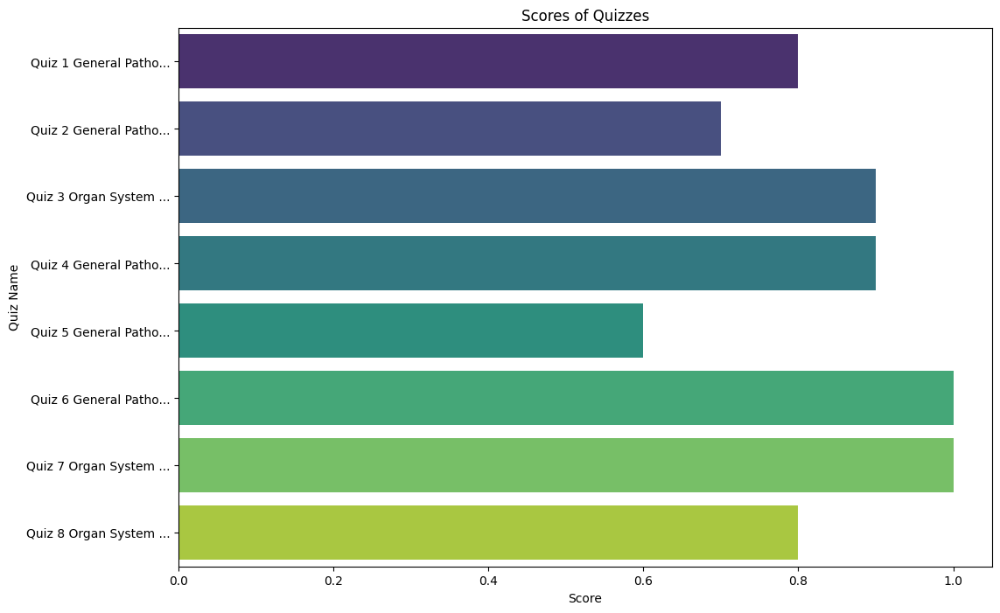

In [197]:
import seaborn as sns
import matplotlib.pyplot as plt
# quiz_names = list(quizzes.keys())

# Function to truncate quiz names
# def truncate_name(name, max_length=20):
#     return (name[:max_length] + '...') if len(name) > max_length else name

# # Prepare data for plotting
# quiz_names = [truncate_name(quiz) for quiz in quizzes.keys()]


# scores = [sum(quiz_data['scores']) for quiz_data in quizzes.values()]

# # Create a bar chart
# plt.figure(figsize=(10, 7))
# plt.bar(quiz_names, scores, color='blue')
# plt.xlabel('Quiz Name')
# plt.ylabel('Score')
# plt.title('Scores of Quizzes')
# plt.xticks(rotation=45)  # Rotates the quiz names for better visibility
# plt.show()

def truncate_name(name, max_length=20):
    return (name[:max_length] + '...') if len(name) > max_length else name

# Prepare data for plotting
quiz_names = [truncate_name(quiz) for quiz in quizzes.keys()]
scores = [sum(quiz_data['scores']) for quiz_data in quizzes.values()]

# Create a DataFrame for better handling with seaborn
import pandas as pd
data = pd.DataFrame({'Quiz Name': quiz_names, 'Score': scores})

# Use seaborn for advanced styling
plt.figure(figsize=(12, 8))
sns.barplot(x='Score', y='Quiz Name', data=data, palette='viridis')

plt.xlabel('Score')
plt.ylabel('Quiz Name')
plt.title('Scores of Quizzes')
plt.show()




In [198]:
for quiz, data in quizzes.items():
    print(f"Data for {quiz}:")
    # print("Responses:", data['responses'])
    # print("Scores:", data['scores'])
    print("Incorrect Answers:", data['incorrect'])
    print("\n")


Data for Quiz 1 General Pathology - Atherosclerosis & Thrombosis:
Incorrect Answers: [{'Question': 1, 'Correct': 'D', 'Explanation': 'This is a ventricular aneurysm that resulted from healing of a large myocardial infarction resulting from severe occlusive coronary artery atherosclerosis'}, {'Question': 4, 'Correct': 'B', 'Explanation': 'The marked atherosclerosis has resulted in formation of a lower abdominal aortic atherosclerotic aneurysm. Persons with diabetes mellitus are likely to have severe, advanced atherosclerosis, as are persons with hypercholesterolemia, and hypertension accelerates this process. Persons with malignant neoplasms often have a reversal of atherosclerotic lesions with the cachexia that accompanies neoplasia. In Marfan syndrome the cystic medial necrosis leads to dilation of the aortic root with risk for dissection.'}]


Data for Quiz 2 General Pathology - General Pathology - Cell Injury:
Incorrect Answers: [{'Question': 3, 'Correct': 'B', 'Explanation': "There

In [199]:
import pandas as pd

# Adjust the range according to the number of quiz files you have
num_files = 8  # Assuming you have 10 files

file_paths = [f'static/data/quiz{i}.xlsx' for i in range(1, num_files + 1)]

dataframes = []

for file_path in file_paths:
    try:
        df = pd.read_excel(file_path)
        dataframes.append(df)
    except FileNotFoundError:
        print(f"File not found: {file_path}")
        continue

combined_df = pd.concat(dataframes, ignore_index=True)

# Now you can work with the combined_df DataFrame


In [200]:
print(combined_df)



     image_path                                           question  \
0     CV118.jpg  A 65-year-old man has had increasing dyspnea a...   
1   SKIN075.jpg  A 56-year-old woman is undergoing chemotherapy...   
2     CV203.jpg  A 45-year-old woman suffers a 'stroke' with ri...   
3     CV013.jpg  A 68-year-old man has had abdominal pain for t...   
4     CV116.jpg  A 75-year-old woman falls down a flight of sta...   
..          ...                                                ...   
74  ENDO027.jpg  A 39-year-old woman has noted a 'bump' on her ...   
75  ENDO004.jpg  A 19-year-old woman was in good health until t...   
76  ENDO115.jpg  A 16-year-old boy has had severe headaches for...   
77  ENDO091.jpg  A 48-year-old man has experienced abdominal pa...   
78  ENDO033.jpg  A 50-year-old man dies from a sudden stroke. A...   

   Correct_Responses                                        Explanation  
0                  D  This is a ventricular aneurysm that resulted f...  
1          

In [201]:
total_responses_so_far = 0
incorrect_answer_indexes = []

for quiz_name, quiz_info in quizzes.items():
    print(f"Quiz Name: {quiz_name}")

    # Update the total responses so far
    total_responses_so_far += quiz_info['total_responses']
    print(f"Total Responses up to this quiz: {total_responses_so_far}")

    # Check if there are incorrect questions
    if 'incorrect' in quiz_info and quiz_info['incorrect']:
        # Adjust indices and append to the incorrect_answer_indexes list
        adjusted_indices = [item['Question'] + total_responses_so_far - quiz_info['total_responses'] for item in quiz_info['incorrect']]
        incorrect_answer_indexes.extend(adjusted_indices)
        print("Adjusted Indices of Incorrect Questions:", adjusted_indices)
    else:
        print("No incorrect questions recorded.")

    print("\n")

# After the loop, print the complete list of incorrect answer indexes
print("All Incorrect Answer Indexes:", incorrect_answer_indexes)


Quiz Name: Quiz 1 General Pathology - Atherosclerosis & Thrombosis
Total Responses up to this quiz: 10
Adjusted Indices of Incorrect Questions: [1, 4]


Quiz Name: Quiz 2 General Pathology - General Pathology - Cell Injury
Total Responses up to this quiz: 20
Adjusted Indices of Incorrect Questions: [13, 17, 20]


Quiz Name: Quiz 3 Organ System Pathology - Dermatopathology
Total Responses up to this quiz: 30
Adjusted Indices of Incorrect Questions: [24]


Quiz Name: Quiz 4 General Pathology  - Immunopathology
Total Responses up to this quiz: 40
Adjusted Indices of Incorrect Questions: [40]


Quiz Name: Quiz 5 General Pathology  - Inflammation
Total Responses up to this quiz: 50
Adjusted Indices of Incorrect Questions: [42, 43, 49, 50]


Quiz Name: Quiz 6 General Pathology  - Neoplasia
Total Responses up to this quiz: 60
No incorrect questions recorded.


Quiz Name: Quiz 7 Organ System Pathology  - Cardiovascular Pathology
Total Responses up to this quiz: 69
No incorrect questions record

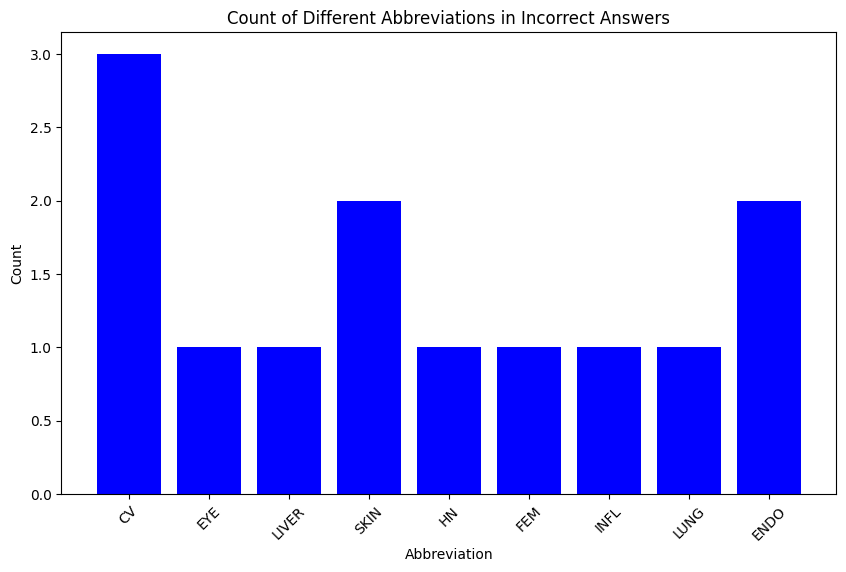

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/1334261455.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abbreviation', y='Count', data=data1, palette='coolwarm')


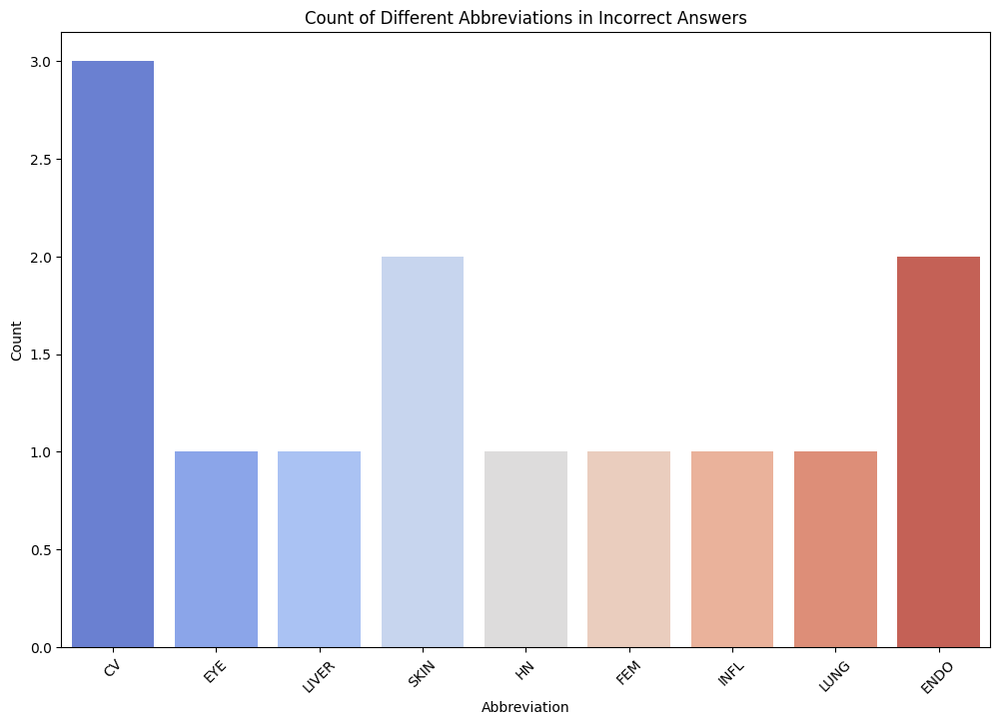

In [221]:
from collections import Counter
import re
abbreviations = []

for i in incorrect_answer_indexes:
    filename = combined_df["image_path"].iloc[i-1]
    # Remove the file extension and numbers
    abbreviation = re.sub(r'\d+\.jpg', '', filename)
    abbreviations.append(abbreviation)

# Count the occurrences of each abbreviation
abbreviation_counts = Counter(abbreviations)

# Plot the counts in a bar chart
# plt.figure(figsize=(10, 6))
# plt.bar(abbreviation_counts.keys(), abbreviation_counts.values(), color='blue')
# plt.xlabel('Abbreviation')
# plt.ylabel('Count')
# plt.title('Count of Different Abbreviations in Incorrect Answers')
# plt.xticks(rotation=45)
# plt.show()


data1 = pd.DataFrame({'Abbreviation': list(abbreviation_counts.keys()), 'Count': list(abbreviation_counts.values())})

plt.figure(figsize=(12, 8))
sns.barplot(x='Abbreviation', y='Count', data=data1, palette='coolwarm')

plt.xlabel('Abbreviation')
plt.ylabel('Count')
plt.title('Count of Different Abbreviations in Incorrect Answers')
plt.xticks(rotation=45)  # Rotates the abbreviation names for better visibility
plt.show()




[2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 44, 45, 46, 47, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78]


/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2293483932.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abbreviation', y='Count', data=data2, palette='coolwarm')


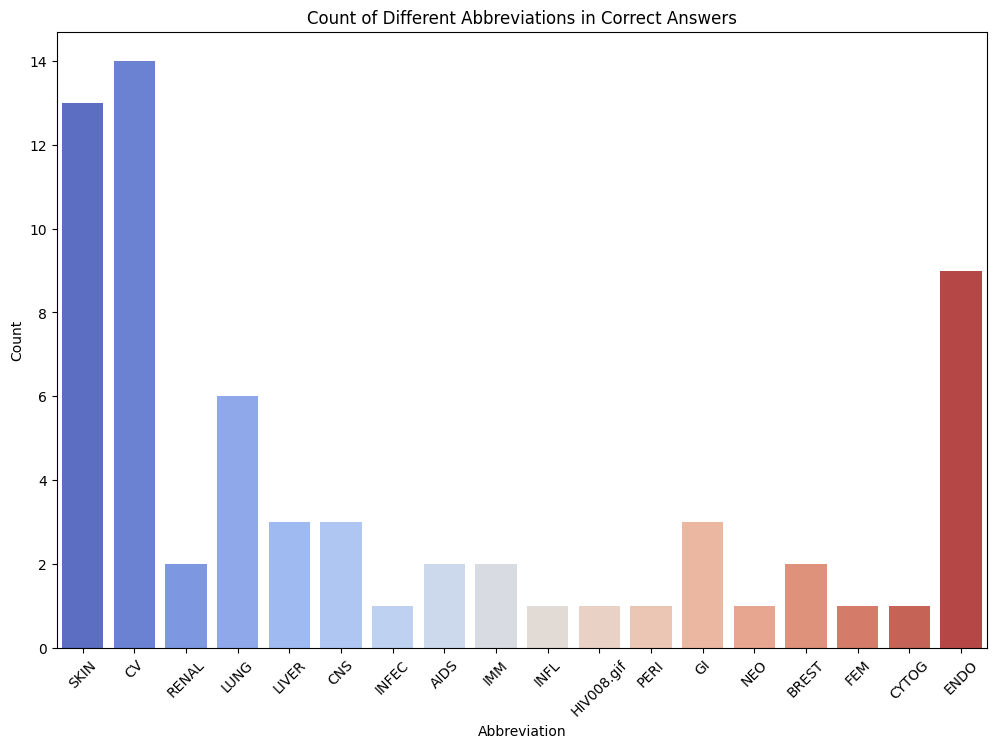

In [220]:
correct_answer_indexes = []
for i in range(total_responses_so_far):
    correct_answer_indexes.append(i+1)

for i in incorrect_answer_indexes:
    correct_answer_indexes.remove(i)
print(correct_answer_indexes)
from collections import Counter
import re
abbreviations2 = []

for i in correct_answer_indexes:
    filename = combined_df["image_path"].iloc[i-1]
    # Remove the file extension and numbers
    abbreviation2 = re.sub(r'\d+\.jpg', '', filename)
    abbreviations2.append(abbreviation2)

# Count the occurrences of each abbreviation
abbreviation_counts2 = Counter(abbreviations2)

# Plot the counts in a bar chart
# plt.figure(figsize=(10, 6))
# plt.bar(abbreviation_counts2.keys(), abbreviation_counts2.values(), color='blue')
# plt.xlabel('Abbreviation')
# plt.ylabel('Count')
# plt.title('Count of Different Abbreviations in Correct Answers')
# plt.xticks(rotation=45)
# plt.show()


data2 = pd.DataFrame({'Abbreviation': list(abbreviation_counts2.keys()), 'Count': list(abbreviation_counts2.values())})

plt.figure(figsize=(12, 8))
sns.barplot(x='Abbreviation', y='Count', data=data2, palette='coolwarm')

plt.xlabel('Abbreviation')
plt.ylabel('Count')
plt.title('Count of Different Abbreviations in Correct Answers')
plt.xticks(rotation=45)  # Rotates the abbreviation names for better visibility
plt.show()


In [204]:
explanations= []
for i in incorrect_answer_indexes:
    filename = combined_df["Explanation"].iloc[i-1]
    # Remove the file extension and numbers
    # abbreviation = re.sub(r'\d+\.jpg', '', filename)
    explanations.append(filename)   
    # abbreviations.append(abbreviation)

print(explanations)
for i in explanations:
    print(i)


['This is a ventricular aneurysm that resulted from healing of a large myocardial infarction resulting from severe occlusive coronary artery atherosclerosis.', 'The marked atherosclerosis has resulted in formation of a lower abdominal aortic atherosclerotic aneurysm. Persons with diabetes mellitus are likely to have severe, advanced atherosclerosis, as are persons with hypercholesterolemia, and hypertension accelerates this process. Persons with malignant neoplasms often have a reversal of atherosclerotic lesions with the cachexia that accompanies neoplasia. In Marfan syndrome the cystic medial necrosis leads to dilation of the aortic root with risk for dissection.', "There is pronounced scleral icterus, consistent with hyperbilirubinemia. Hemolysis leads to increased turnover of RBC's and increased bilirubin production, which overwhelms the capacity of hepatocytes to process it. Metastases are unlikely to cause biliary obstruction with jaundice, because the lesions are focal, and bile

In [205]:
import openai
import os  
import requests

from dotenv import load_dotenv


API_URL = "https://api.openai.com/v1/chat/completions"
load_dotenv()
API_KEY= os.getenv("API_KEY")

import time 
os.environ["OPENAI_API_KEY"]=API_KEY
newopenai = openai.api_key = os.environ.get('OPENAI_API_KEY')
MAX_TOKENS = "4000"
MAX_RETRIES = 5  # Max number of retries 
RETRY_DELAY = 10

def send_request(question):
    try:
        response = openai.chat.completions.create(
            model="gpt-4",
            messages=[
                {"role": "system", "content": "You do name entity recognition on medical terms. Return the named entities in the text only as ENTITY_TYPE:ENTITY_NAME. Use no spaces and for each pair add a line \n for separation. Stick to the rules of the format of pairing."},
                {"role": "user", "content": question}
            ],
            max_tokens=4000
        )

        return response

    except Exception as e:
        # This will catch any errors that might occur during the API call
        print(f"An error occurred: {e}")
        raise


In [206]:
import pandas as pd
import re

# Assuming explanations is a list of questions or prompts
aggregated_data = []
group_data = []

for i, explanation in enumerate(explanations):
    response = send_request(explanation)
    content = response.choices[0].message.content
    print(i)
    print(content)
    
    # Extract entity types and names
    entities = re.findall(r'(\w+):(.+)', content)
    # Append the current value of i for each entity found
    for _ in entities:
        group_data.append(i)
    aggregated_data.extend(entities)

# Create a DataFrame
df = pd.DataFrame(aggregated_data, columns=['ENTITY TYPE', 'ENTITY NAME'])

# Add the GROUP column
df['GROUP'] = group_data

# Remove potential leading and trailing whitespaces
df['ENTITY NAME'] = df['ENTITY NAME'].str.strip()


# Count instances
# df['COUNT'] = df.groupby(['ENTITY TYPE', 'ENTITY NAME'])['ENTITY NAME'].transform('count')

# # Drop duplicate rows
# df = df.drop_duplicates().reset_index(drop=True)

print(df)


0
DISEASE:Ventricular Aneurysm
PATHOLOGY:Myocardial Infarction
CONDITION:Occlusive Coronary Artery Atherosclerosis
1
DISEASE:Atherosclerosis
BODY_PART:Lower abdominal aortic
DISEASE:Atherosclerotic aneurysm
DISEASE:Diabetes mellitus
DISEASE:Hypercholesterolemia
DISEASE:Hypertension
DISEASE:Malignant neoplasms
DISEASE:Atherosclerotic lesions
DISEASE:Cachexia
DISEASE:Neoplasia
DISEASE:Marfan syndrome
DISEASE:Cystic medial necrosis
BODY_PART:Aortic root
MEDICAL_CONDITION:Dissection
2
CONDITION:Scleral icterus
CONDITION:Hyperbilirubinemia
PROCESS:Hemolysis
CELL_TYPE:RBC's
SUBSTANCE:Bilirubin
CELL_TYPE:Hepatocytes
CONDITION:Metastases
CONDITION:Biliary obstruction
CONDITION:Jaundice
ORGAN:Liver
3
DISEASE:Inflammation
CONDITION:Ischemia
EVENT:Cardiac arrest
EVENT:Reperfusion
PHYSICAL_ENTITY:Activated oxygen species
PHYSICAL_ENTITY:Free radical injury
CONDITION:Myocardial ischemic injury
PHYSICAL_ENTITY:Contraction bands
PHYSICAL_ENTITY:Myocardial nuclei
PHYSICAL_ENTITY:Cross striations
CONDI

In [207]:
df.to_csv('incorrect.csv', index=False)

In [208]:
import pandas as pd

# Load your CSV file
df = pd.read_csv('incorrect.csv')

# Preview the DataFrame
print(df.head())


  ENTITY TYPE                                ENTITY NAME  GROUP
0     DISEASE                       Ventricular Aneurysm      0
1   PATHOLOGY                      Myocardial Infarction      0
2   CONDITION  Occlusive Coronary Artery Atherosclerosis      0
3     DISEASE                            Atherosclerosis      1
4   BODY_PART                     Lower abdominal aortic      1


/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


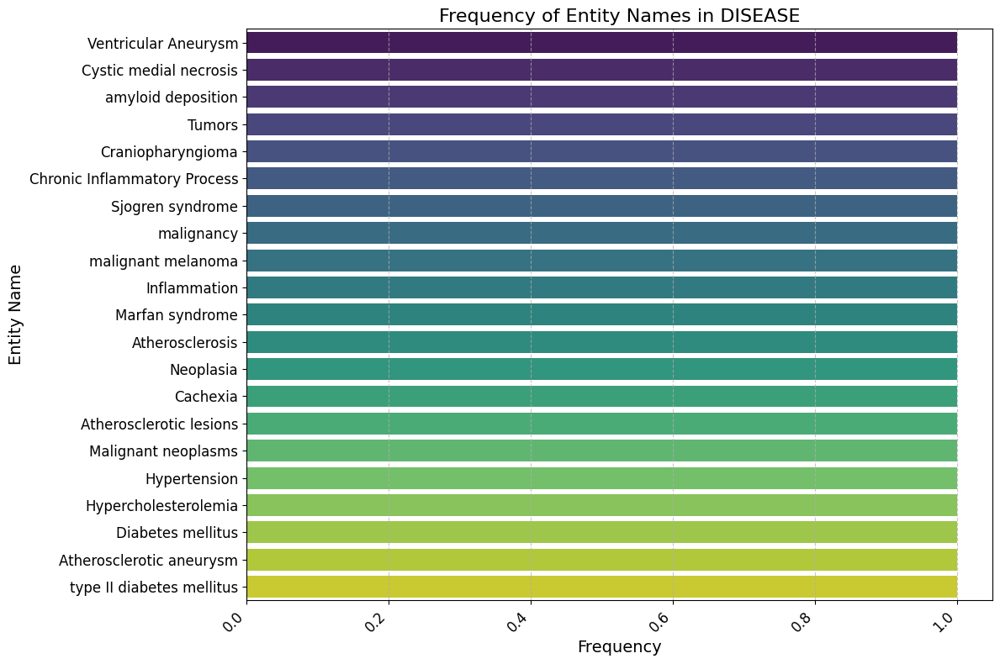

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


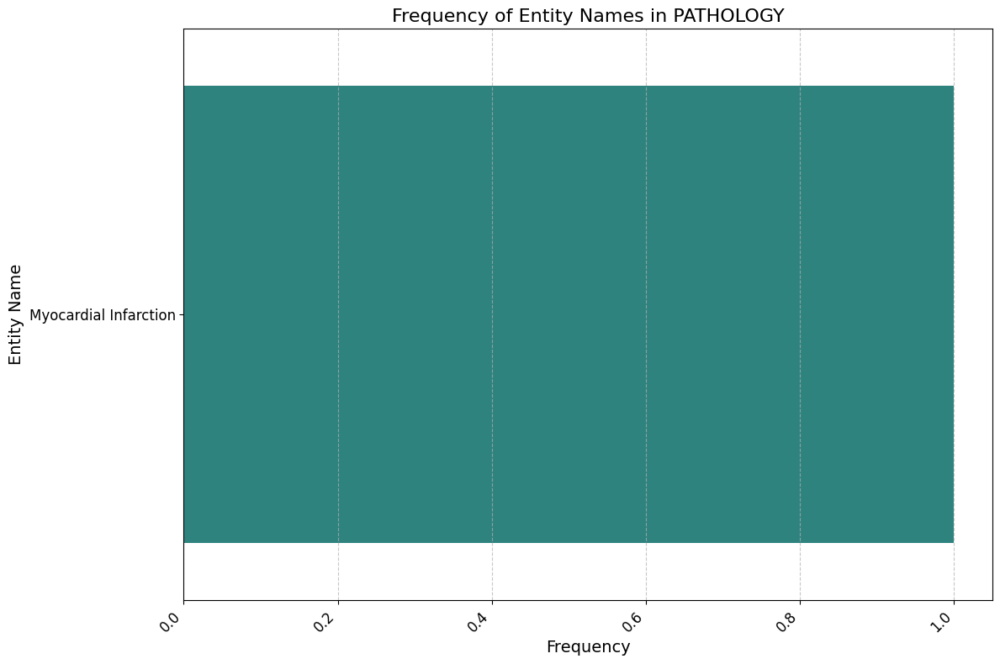

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


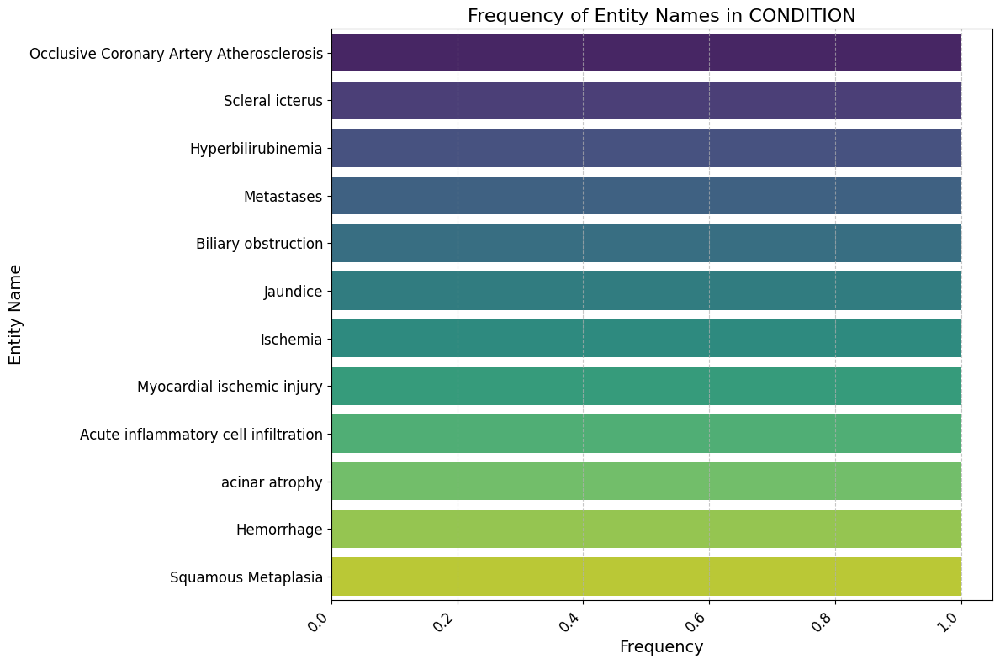

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


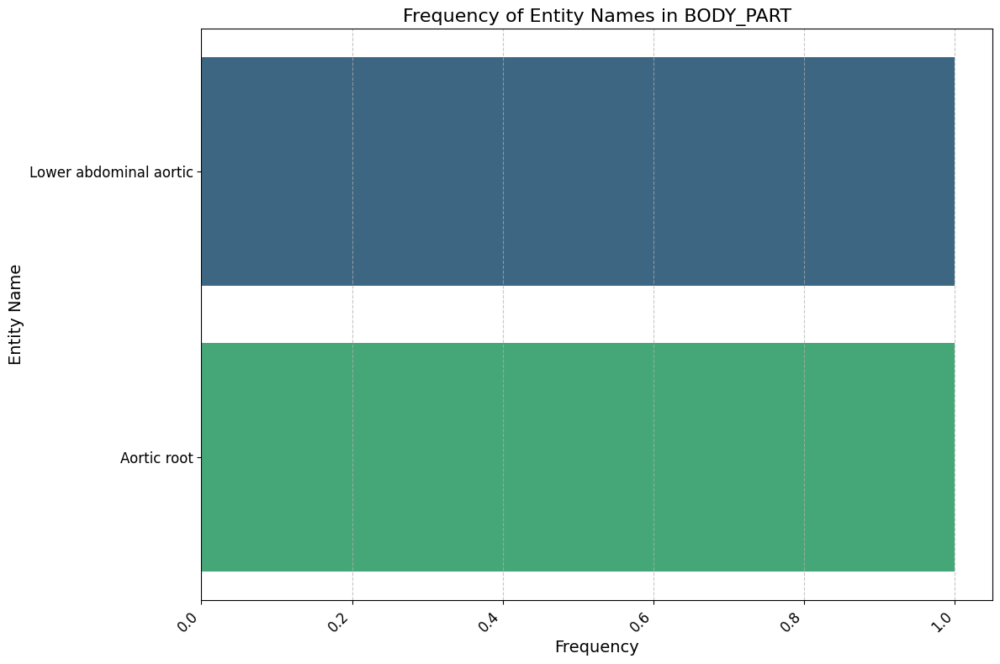

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


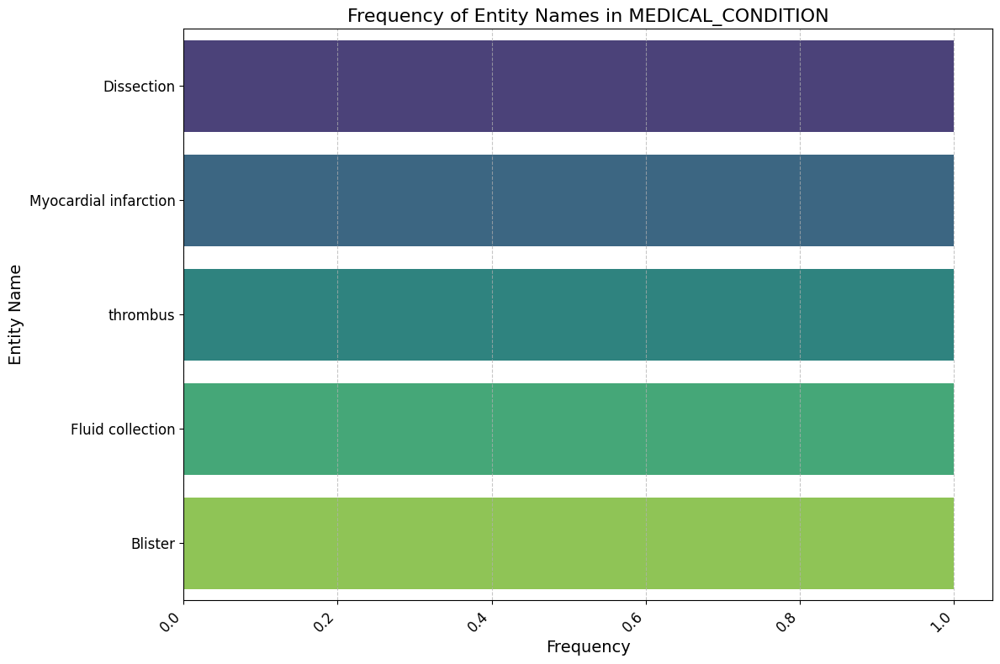

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


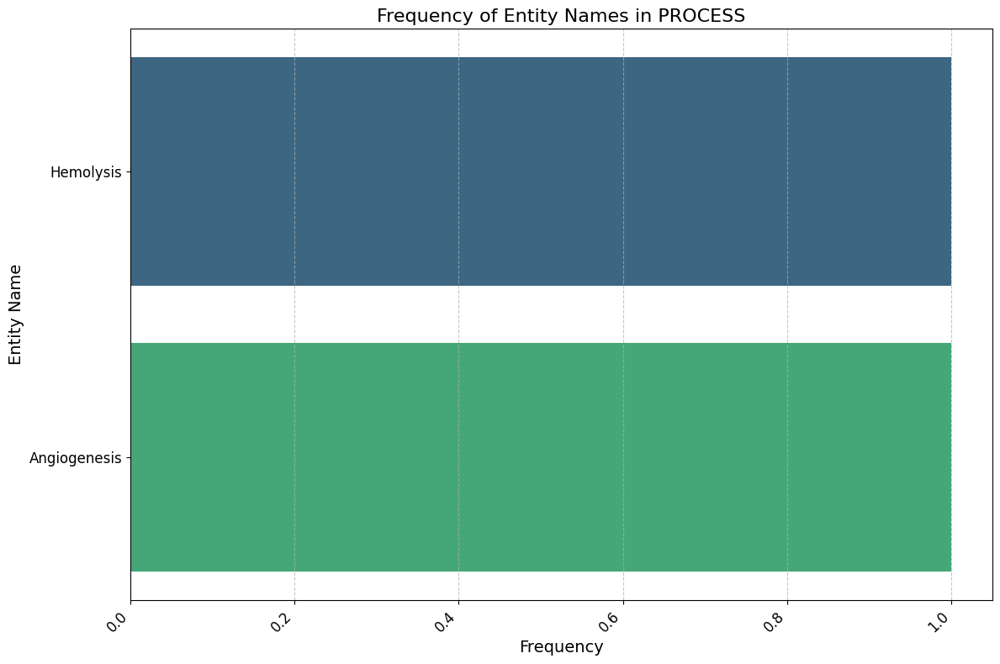

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


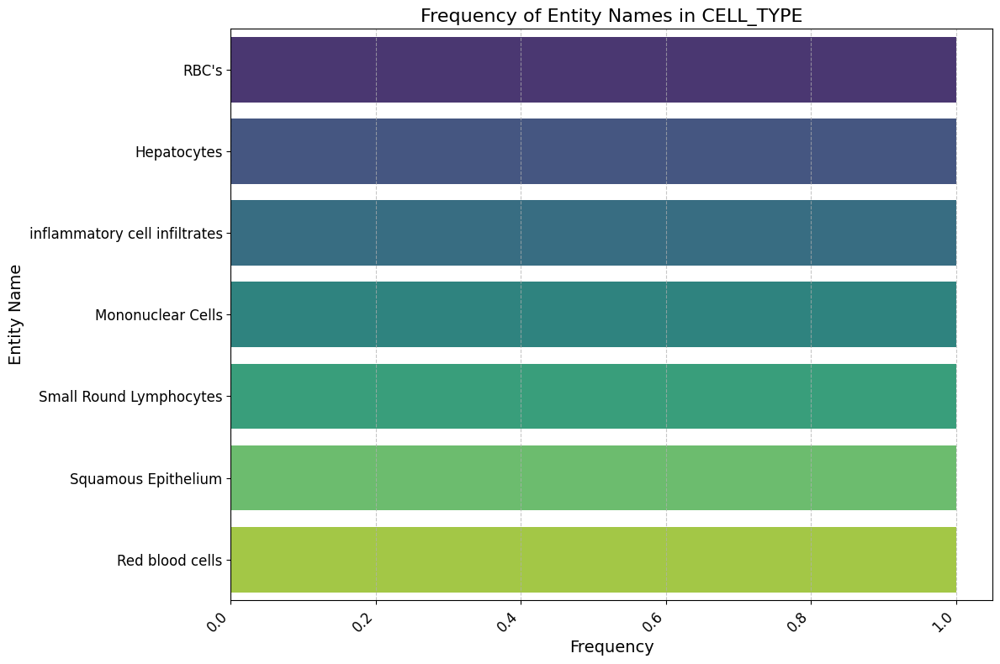

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


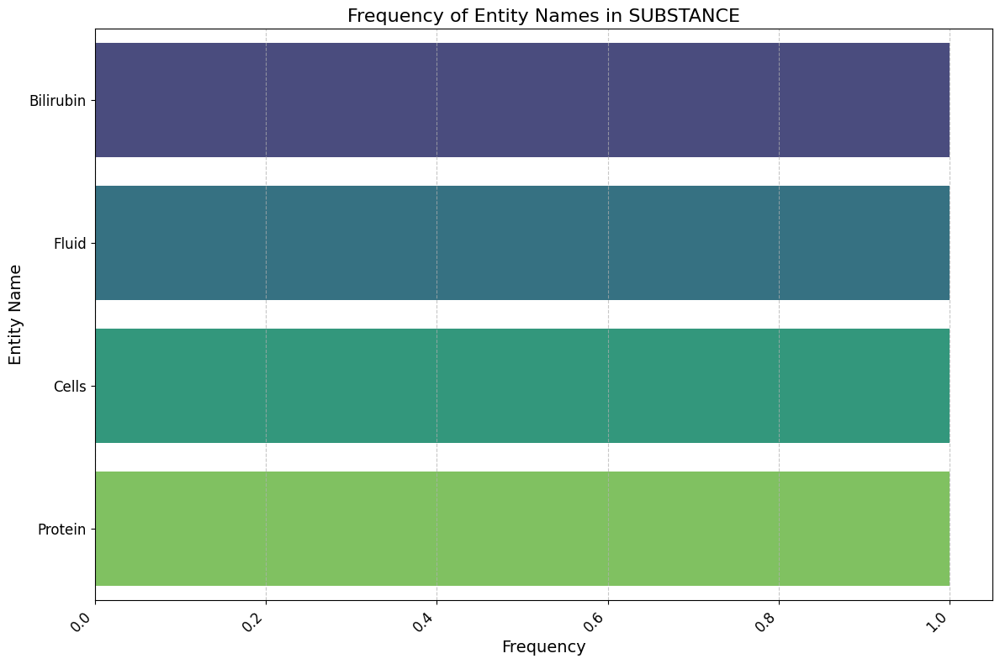

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


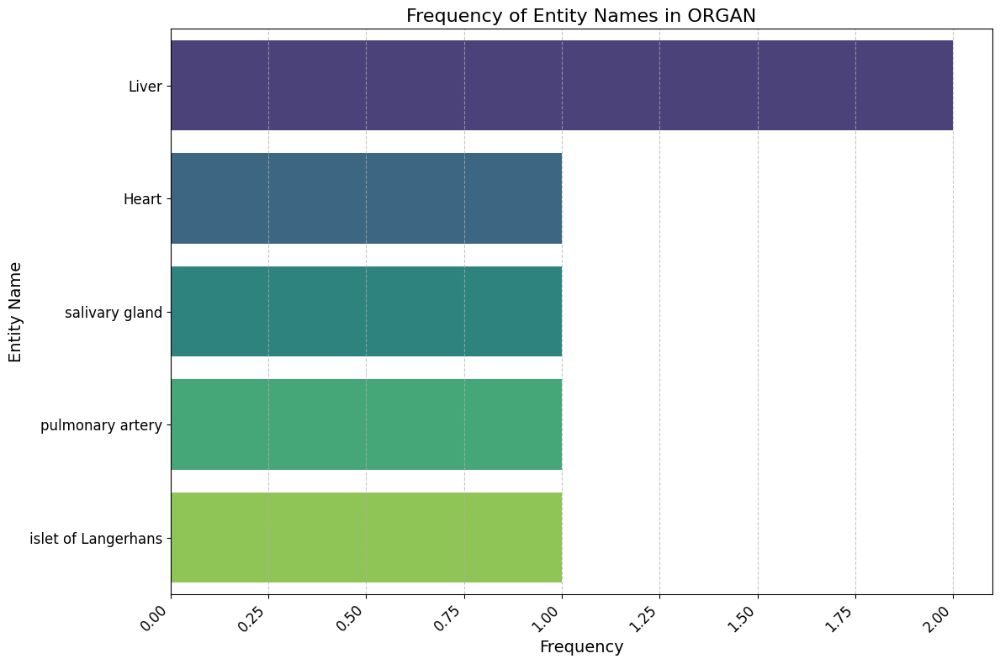

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


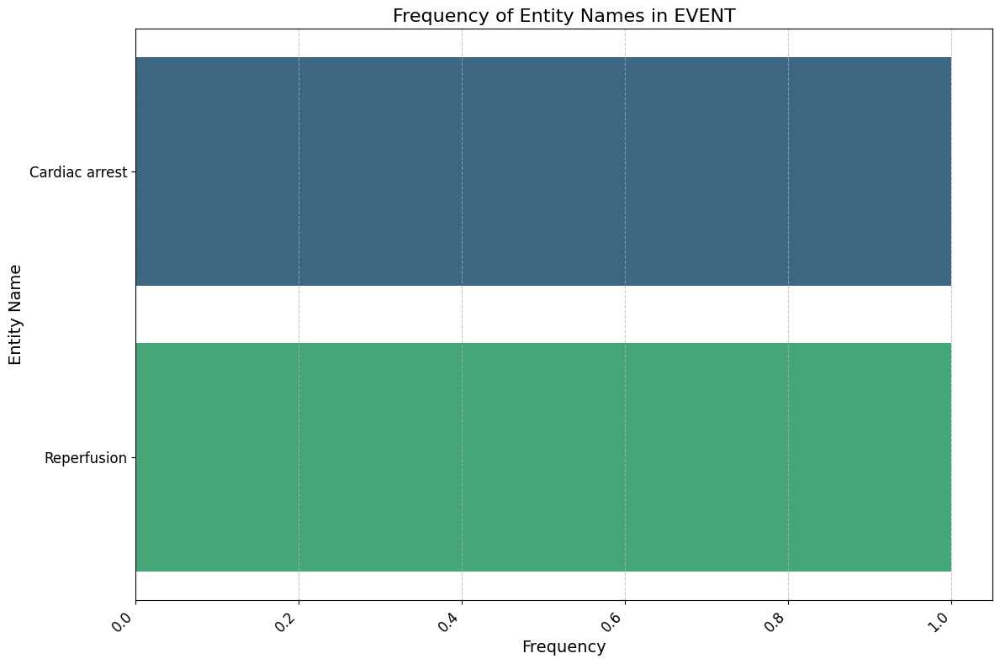

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


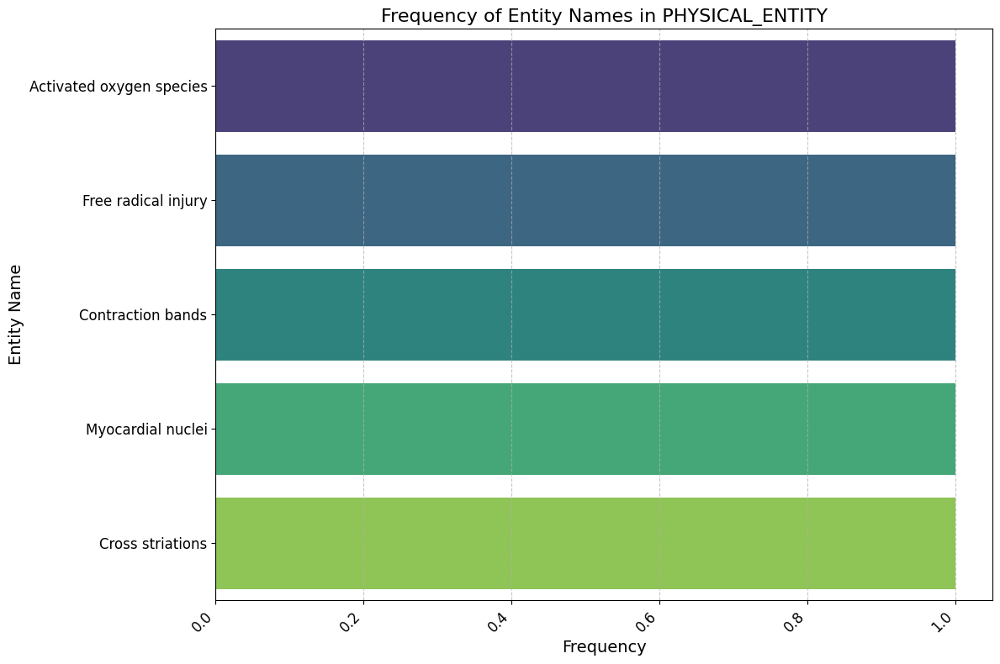

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


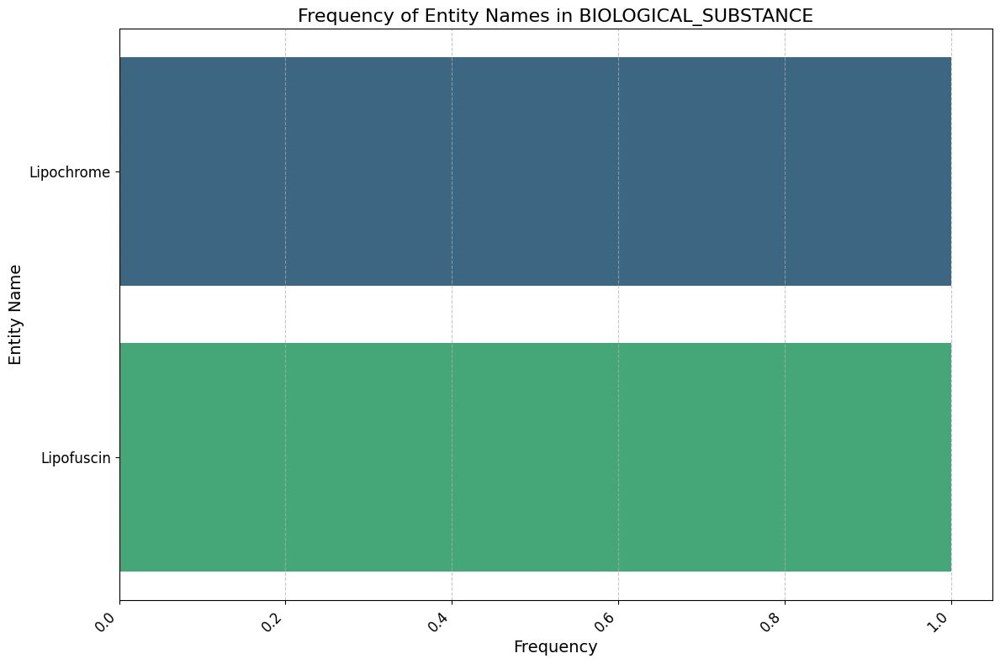

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


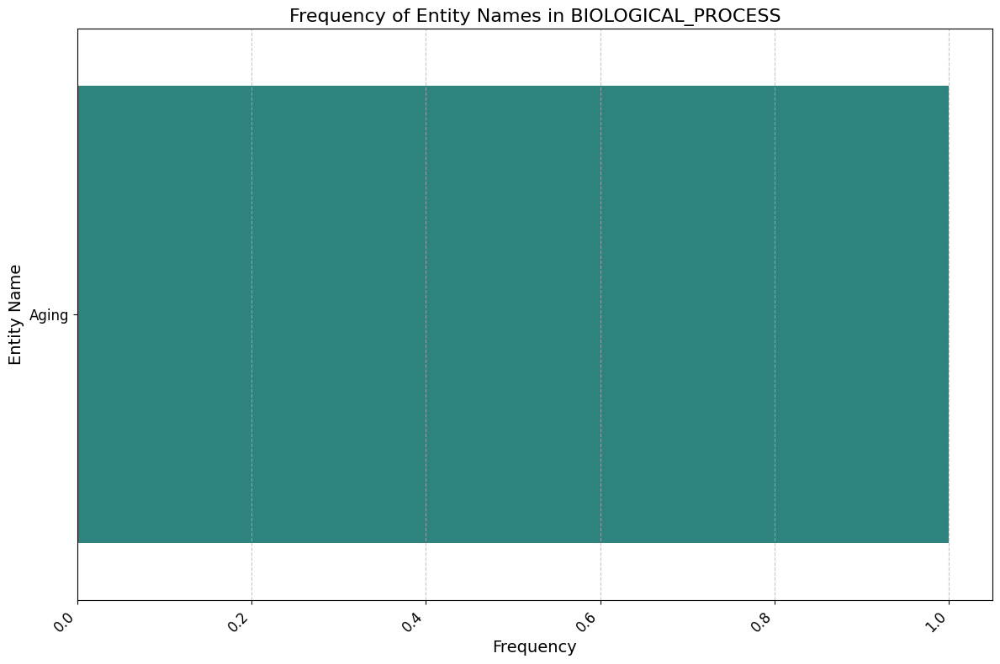

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


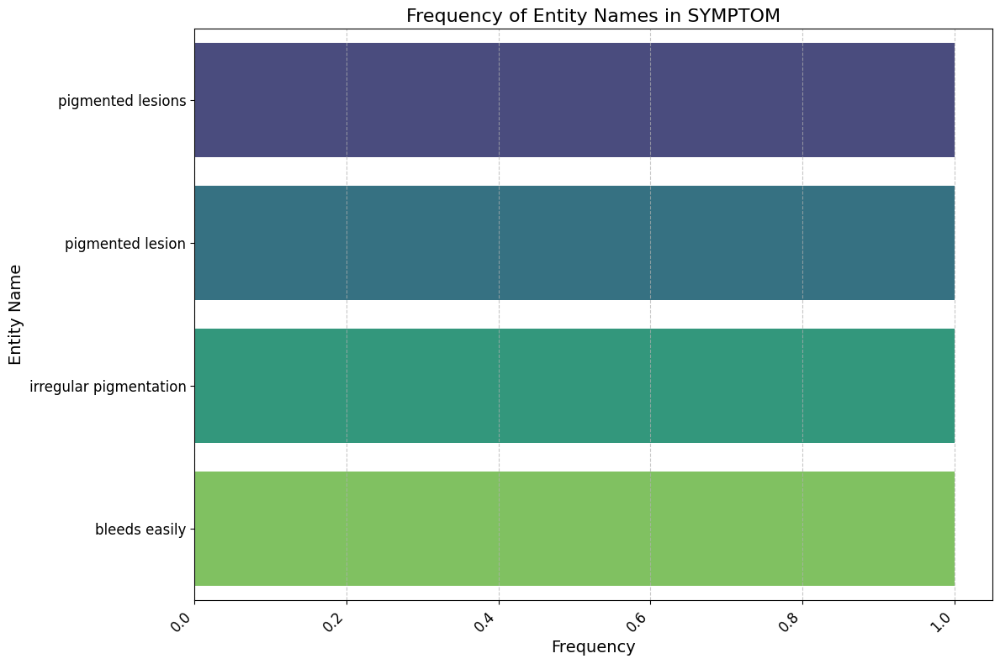

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


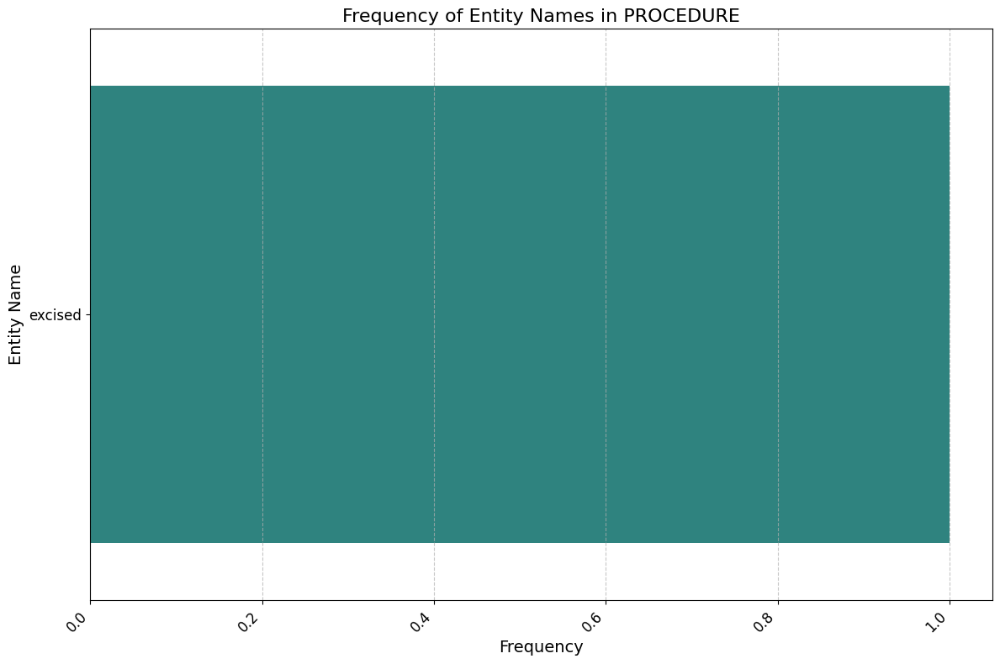

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


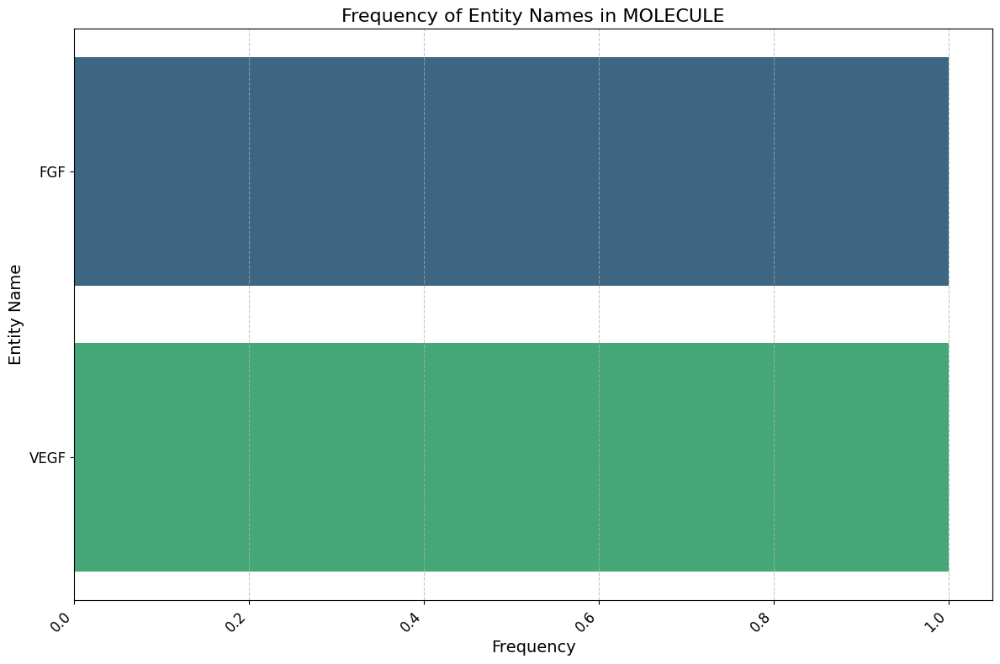

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


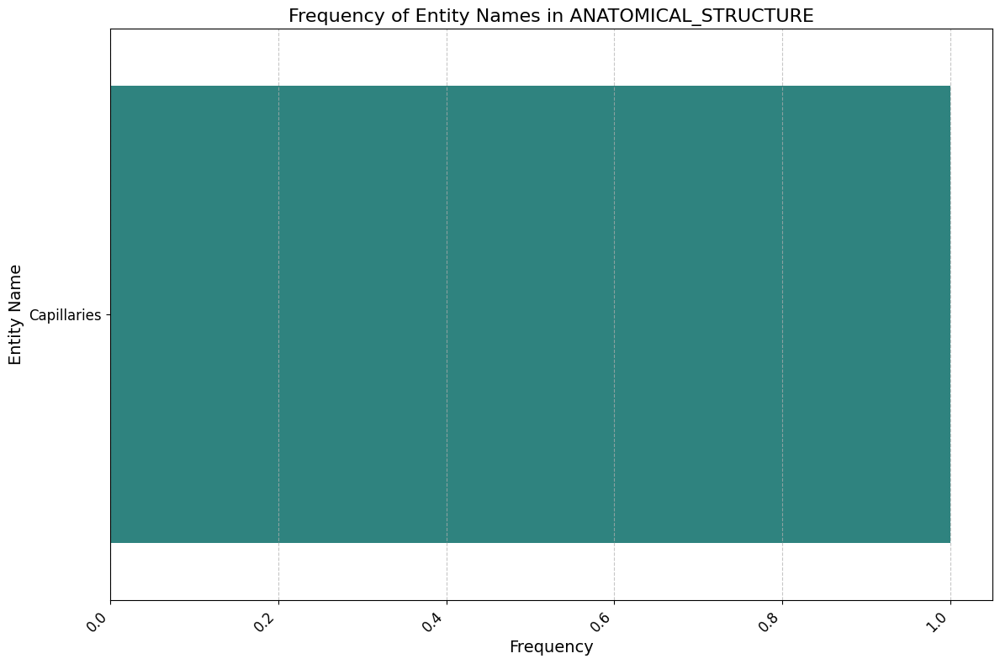

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


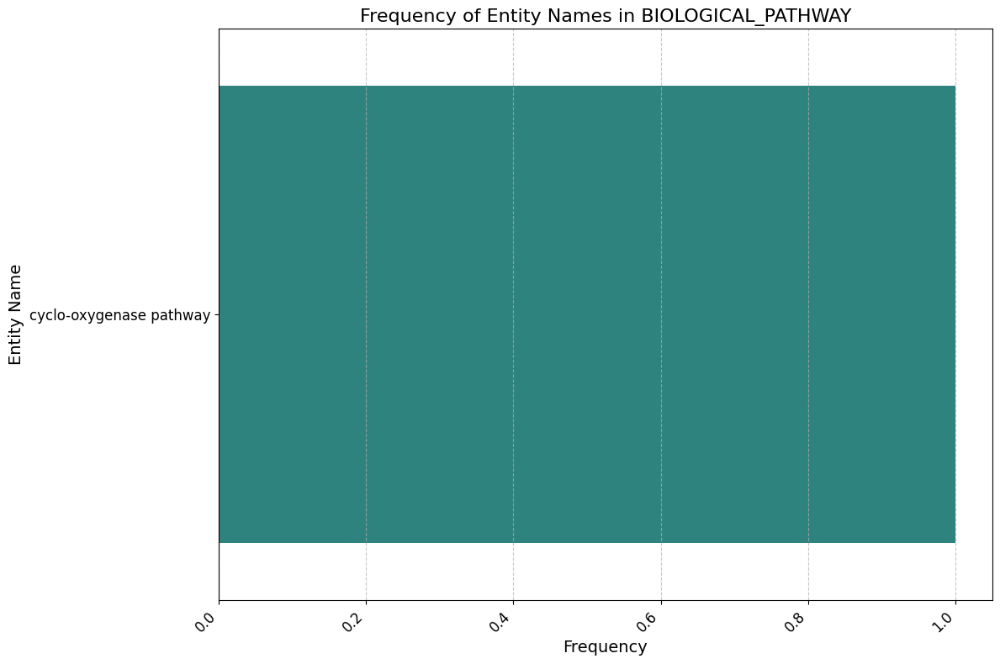

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


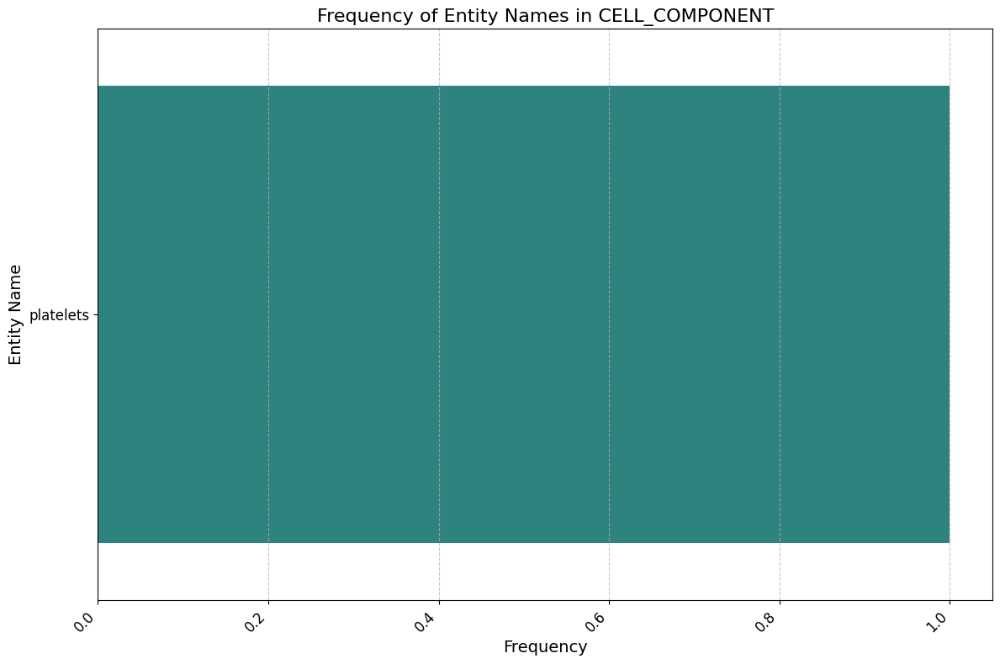

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


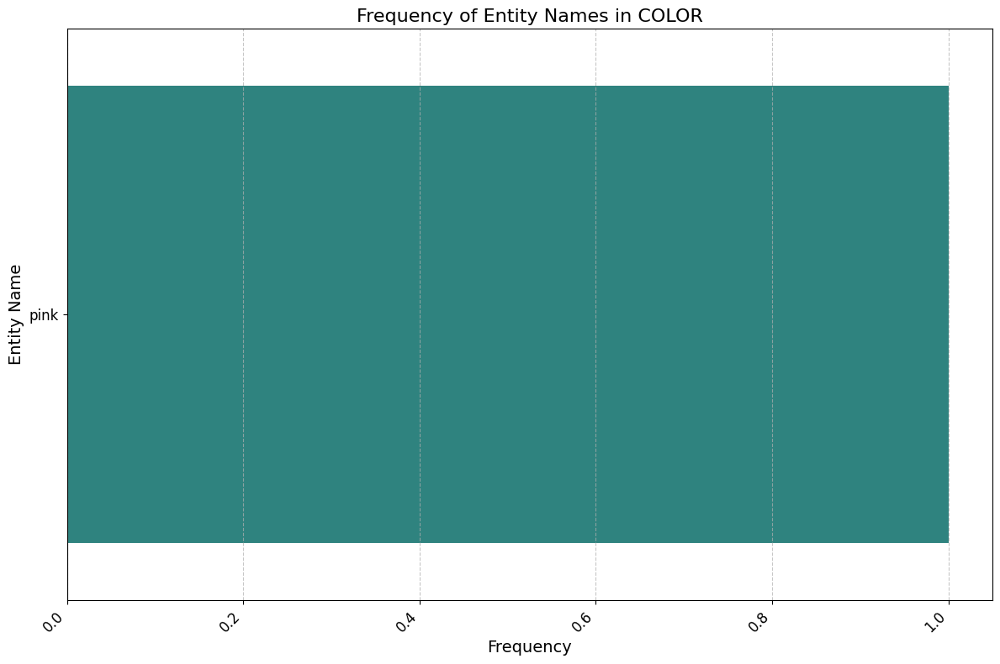

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


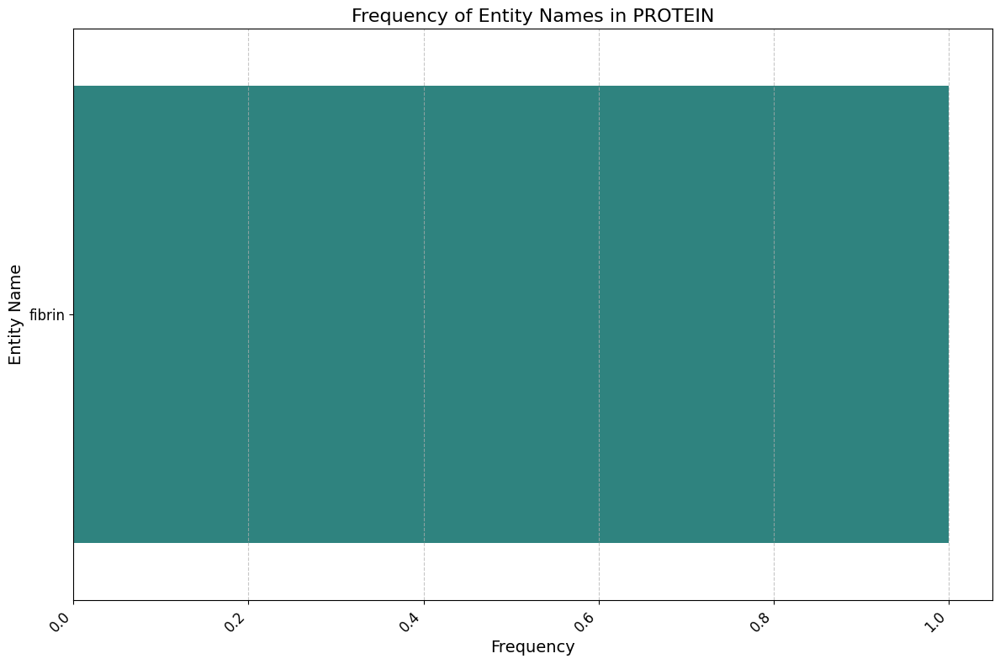

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


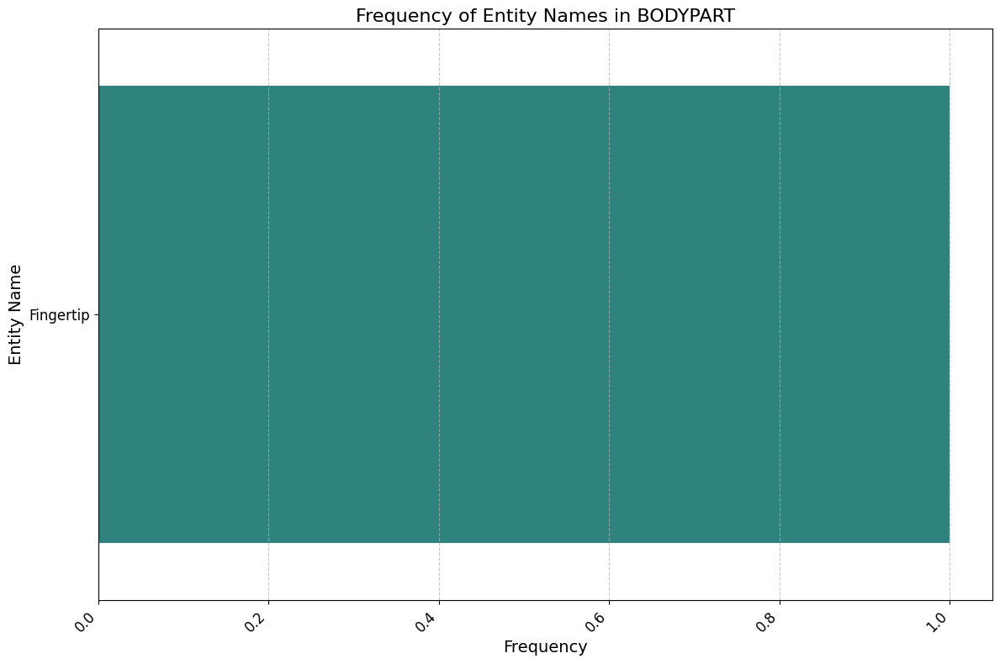

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


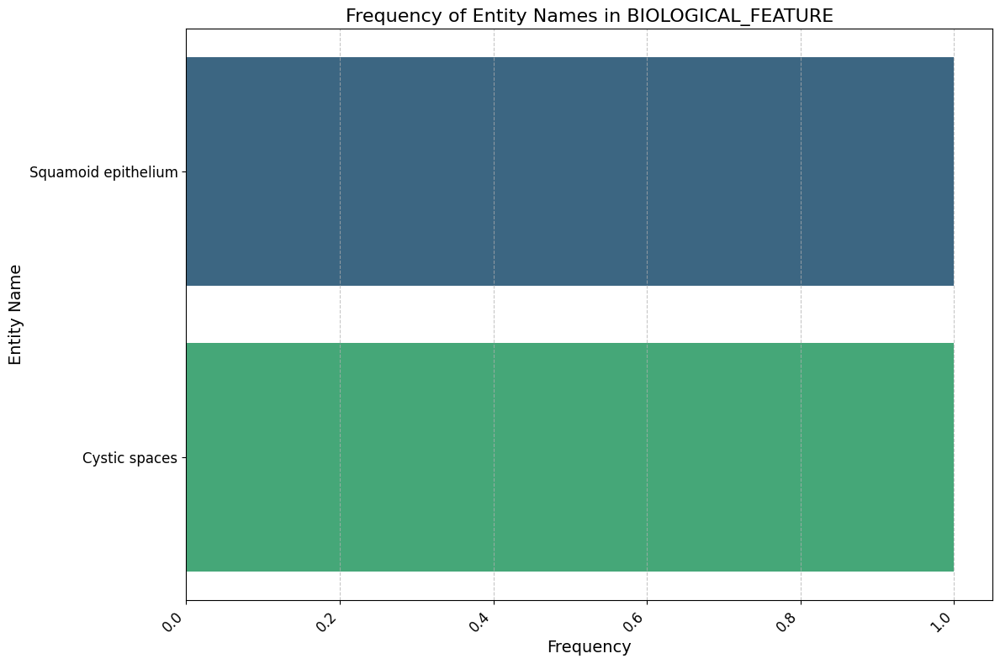

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


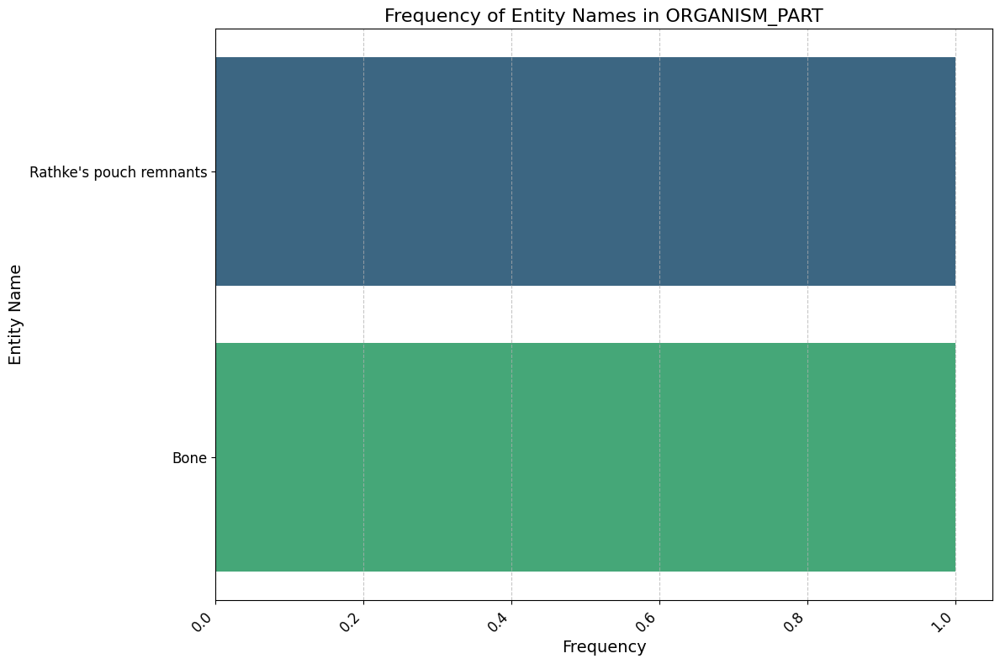

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/506235133.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


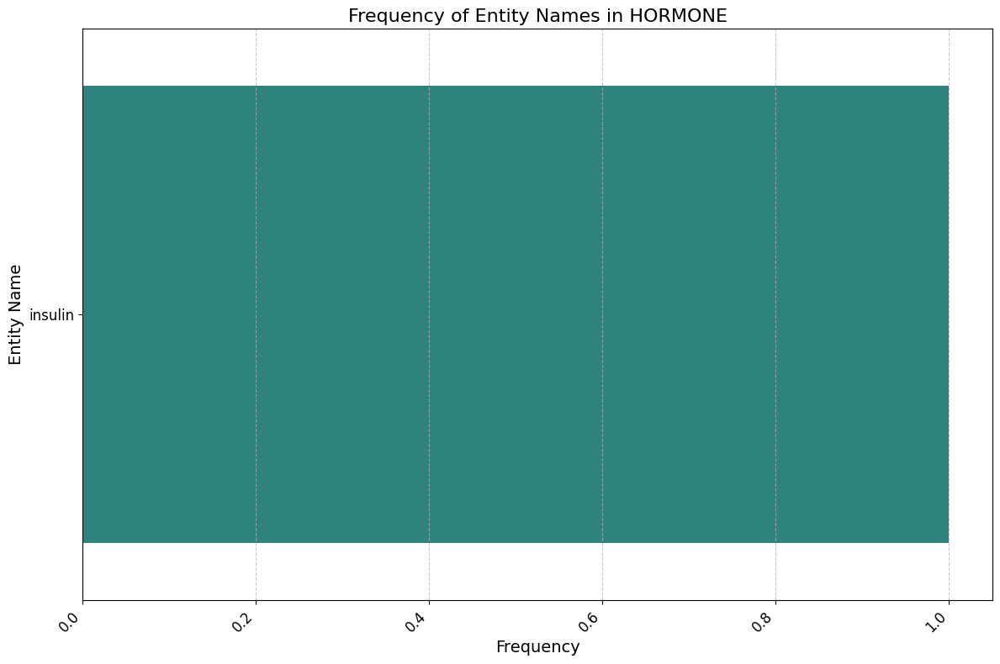

In [209]:
import seaborn as sns

# Frequency Analysis
entity_types = df['ENTITY TYPE'].unique()

# Loop through each entity type and create a plot
for entity_type in entity_types:
    filtered_df = df[df['ENTITY TYPE'] == entity_type]
    entity_name_counts = filtered_df['ENTITY NAME'].value_counts()

    plt.figure(figsize=(12, 8))
    sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')
    plt.title(f'Frequency of Entity Names in {entity_type}', fontsize=16)
    plt.xlabel('Frequency', fontsize=14)
    plt.ylabel('Entity Name', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Group-wise comparison for the current entity type
    # group_counts = filtered_df.groupby(['GROUP']).size()
    
    # # Plotting group distribution for the current entity type
    # plt.figure(figsize=(6, 4))  # Adjust the size as needed
    # group_counts.plot(kind='bar')
    # plt.title(f'Group Distribution for {entity_type}')
    # plt.xlabel('Group')
    # plt.ylabel('Count')
    # plt.tight_layout()  # Adjust layout
    # plt.show()


Color Mapping for Entity Types: {'DISEASE': 'red', 'PATHOLOGY': 'blue', 'CONDITION': 'green', 'BODY_PART': 'yellow', 'MEDICAL_CONDITION': 'purple', 'PROCESS': 'orange', 'CELL_TYPE': 'cyan', 'SUBSTANCE': 'magenta', 'ORGAN': 'lime', 'EVENT': 'pink', 'PHYSICAL_ENTITY': 'red', 'BIOLOGICAL_SUBSTANCE': 'blue', 'BIOLOGICAL_PROCESS': 'green', 'SYMPTOM': 'yellow', 'PROCEDURE': 'purple', 'MOLECULE': 'orange', 'ANATOMICAL_STRUCTURE': 'cyan', 'BIOLOGICAL_PATHWAY': 'magenta', 'CELL_COMPONENT': 'lime', 'COLOR': 'pink', 'PROTEIN': 'red', 'BODYPART': 'blue', 'BIOLOGICAL_FEATURE': 'green', 'ORGANISM_PART': 'yellow', 'HORMONE': 'purple'}


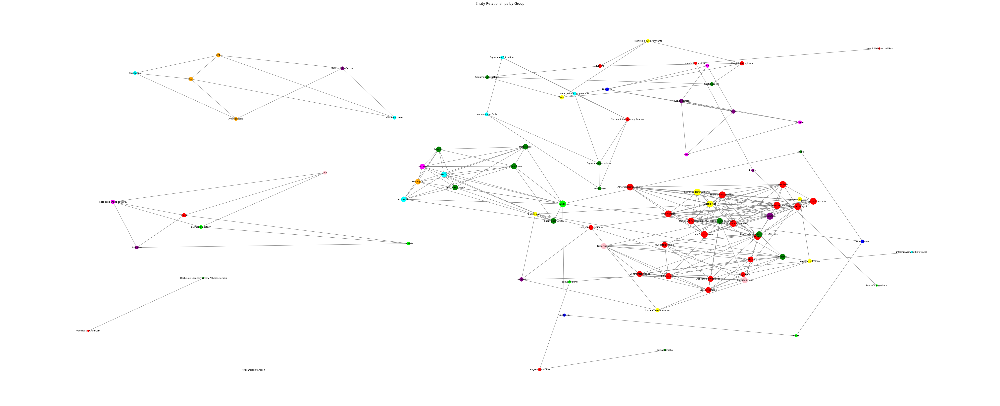

REPORT
Network Density: 0.06335204490777867
Number of Connected Components: 13
Top Nodes by Degree: [('Atherosclerosis', 12), ('Dissection', 12), ('Lower abdominal aortic', 11), ('Atherosclerotic aneurysm', 11), ('Diabetes mellitus', 11)]
Betweenness Centrality: {'Ventricular Aneurysm': 0.0, 'Myocardial Infarction': 0.0, 'Occlusive Coronary Artery Atherosclerosis': 0.0, 'Atherosclerosis': 0.00029847033951001115, 'Lower abdominal aortic': 0.00027111055838826013, 'Atherosclerotic aneurysm': 0.0002437507772665091, 'Diabetes mellitus': 0.00024126352443725902, 'Hypercholesterolemia': 0.00024126352443725902, 'Hypertension': 0.00024126352443725902, 'Malignant neoplasms': 0.00024126352443725902, 'Atherosclerotic lesions': 0.00024126352443725902, 'Cachexia': 0.00024126352443725905, 'Neoplasia': 0.00024126352443725905, 'Marfan syndrome': 0.00024126352443725902, 'Cystic medial necrosis': 0.00024375077726650912, 'Aortic root': 0.00027111055838826013, 'Dissection': 0.00029847033951001115, 'Scleral 

In [210]:
import networkx as nx


colors = ["red", "blue", "green", "yellow", "purple", "orange", "cyan", "magenta", "lime", "pink"]

# Create a color map for different entity types
unique_types = df['ENTITY TYPE'].unique()
color_map = {etype: colors[i % len(colors)] for i, etype in enumerate(unique_types)}
df['color'] = df['ENTITY TYPE'].apply(lambda x: color_map[x])

# Print the color mapping
print("Color Mapping for Entity Types:", color_map)

# Initialize a graph
G = nx.Graph()

# Add nodes with color attribute
for index, row in df.iterrows():
    G.add_node(row['ENTITY NAME'], type=row['ENTITY TYPE'], color=row['color'])

# Add edges for intra-group relationships
for group in df['GROUP'].unique():
    group_df = df[df['GROUP'] == group]
    entities = group_df['ENTITY NAME'].tolist()
    for i in range(len(entities)):
        for j in range(i+2, len(entities)):
            G.add_edge(entities[i], entities[j])

# Node size based on degree
node_size = [G.degree[node] * 50 for node in G]

# Draw the graph
plt.figure(figsize=(50, 20))
pos = nx.spring_layout(G, k=0.15, iterations=10)  # Tweak these parameters as needed
nx.draw(G, pos, with_labels=True, node_color=[data['color'] for _, data in G.nodes(data=True)], 
        node_size=node_size, edge_color='gray', font_size=8)
plt.title("Entity Relationships by Group")
# # Creating a color map caption
# caption = "Color Mapping:\n" + "\n".join([f"{etype}: {color}" for etype, color in color_map.items()])
# plt.figtext(0.5, 0.01, caption, wrap=True, horizontalalignment='left', fontsize=12)

plt.show()
# Report

print("REPORT")
density = nx.density(G)
print("Network Density:", density)
connected_components = nx.number_connected_components(G)
print("Number of Connected Components:", connected_components)
degrees = dict(G.degree())
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
print("Top Nodes by Degree:", sorted_degrees[:5])  # Top 5 nodes
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
print("Betweenness Centrality:", betweenness_centrality)
print("Closeness Centrality:", closeness_centrality)
print("Eigenvector Centrality:", eigenvector_centrality)





In [222]:
import csv
import json

# Your JSON data goes here. Replace 'json_data' with your actual JSON variable.

print(correct_answer_indexes)
# Function to process JSON data and write to CSV
def json_to_csv(data, csv_file_path, corrected_answer_indexes):
    with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(['Explanation', 'Index'])  # Writing header

        index = 1  # Initialize index at 1
        for quiz_name, quiz_data in data.items():
            if quiz_name.startswith("Quiz"):
                response_count = len(quiz_data['responses'])
                quizzes[quiz_name]['total_responses'] = response_count
                index=1
                for response in quiz_data["responses"]:
                        if index in corrected_answer_indexes:
                            content = response["choices"][0]["message"]["content"]

                            writer.writerow([content, index])  # Writing content and index
                        index += 1  # Increment index for next row regardless of inclusion

# Specify the path to your CSV file
csv_file_path = 'correct.csv'

# Call the function with your JSON data, CSV file path, and corrected_answer_indexes
json_to_csv(data, csv_file_path, correct_answer_indexes)


[2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 44, 45, 46, 47, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78]


In [223]:
print(correct_answer_indexes)
reasonings =[]
for quiz_name, quiz_data in data.items():
    if quiz_name.startswith("Quiz"):
        response_count = len(quiz_data['responses'])
        quizzes[quiz_name]['total_responses'] = response_count
        index=1
        for response in quiz_data["responses"]:
                if index in correct_answer_indexes:
                    content = response["choices"][0]["message"]["content"]
                    reasonings.append(content)  # Writing
                index += 1 

print(reasonings)

[2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 44, 45, 46, 47, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78]
[]


In [224]:
for i in reasonings:
    print(i)

In [225]:
import pandas as pd
import re

# Assuming explanations is a list of questions or prompts
aggregated_data2 = []
group_data2 = []

for i, reasoning in enumerate(reasonings):
    response = send_request(reasoning)
    content = response.choices[0].message.content
    print(i)
    print(content)
    
    # Extract entity types and names
    entities = re.findall(r'(\w+):(.+)', content)
    # Append the current value of i for each entity found
    for _ in entities:
        group_data2.append(i)
    aggregated_data2.extend(entities)

# Create a DataFrame
df = pd.DataFrame(aggregated_data2, columns=['ENTITY TYPE', 'ENTITY NAME'])

# Add the GROUP column
df['GROUP'] = group_data2

# Remove potential leading and trailing whitespaces
df['ENTITY NAME'] = df['ENTITY NAME'].str.strip()


# Count instances
# df['COUNT'] = df.groupby(['ENTITY TYPE', 'ENTITY NAME'])['ENTITY NAME'].transform('count')

# # Drop duplicate rows
# df = df.drop_duplicates().reset_index(drop=True)

print(df)


Empty DataFrame
Columns: [ENTITY TYPE, ENTITY NAME, GROUP]
Index: []


In [215]:
df.to_csv('correct.csv', index=False)

In [226]:
# Load your CSV file
df = pd.read_csv('correct.csv')

# Preview the DataFrame
print(df.head())


  ENTITY TYPE        ENTITY NAME  GROUP
0   BODY_PART                arm      0
1   CONDITION      discoloration      0
2       COLOR            purples      0
3       COLOR             browns      0
4   CONDITION  hyperpigmentation      0


/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


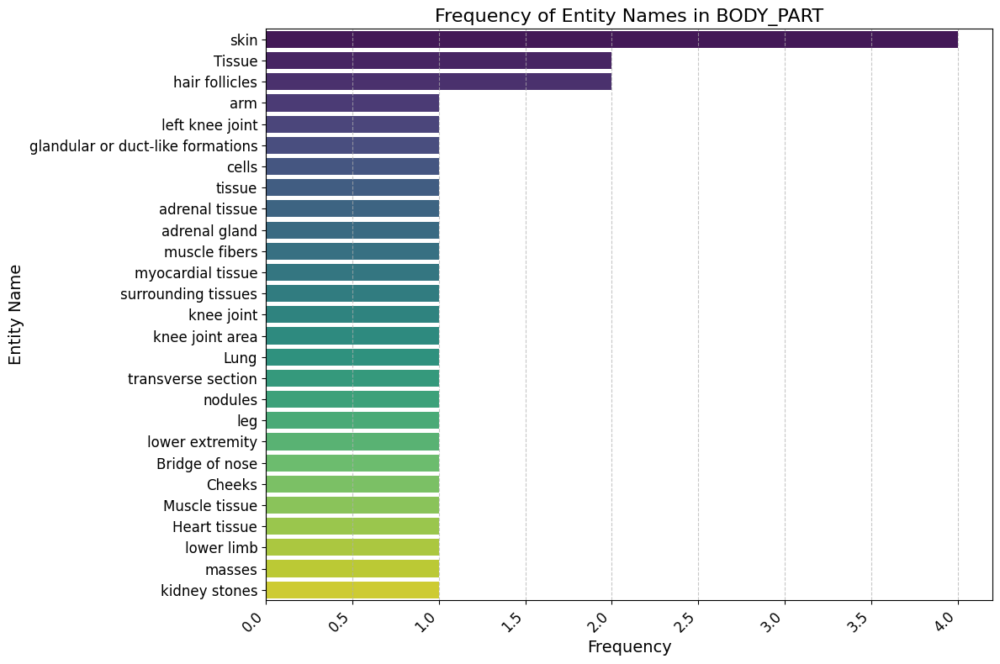

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


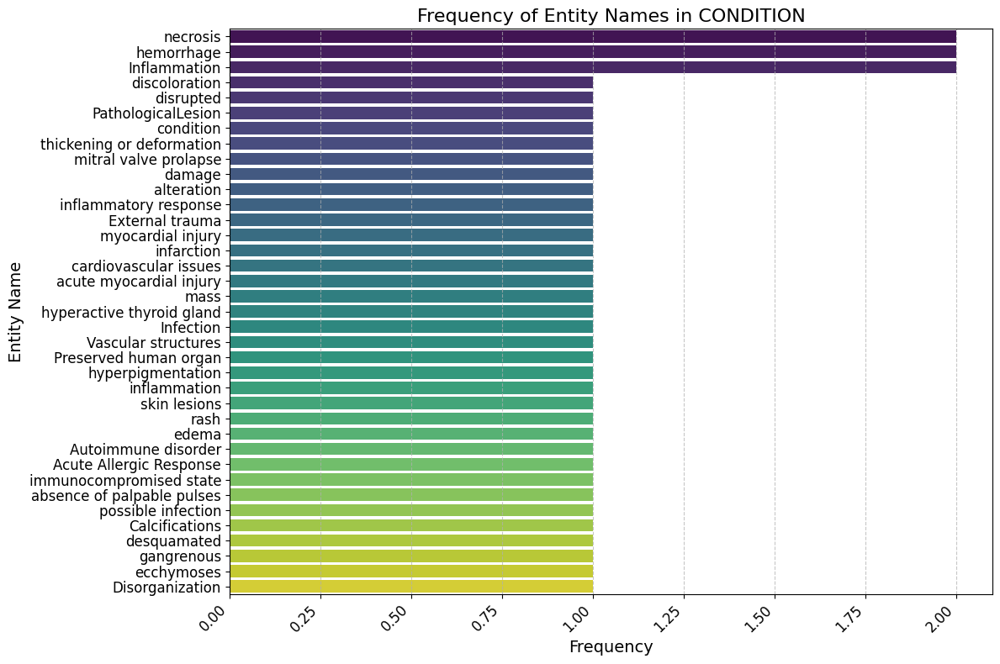

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


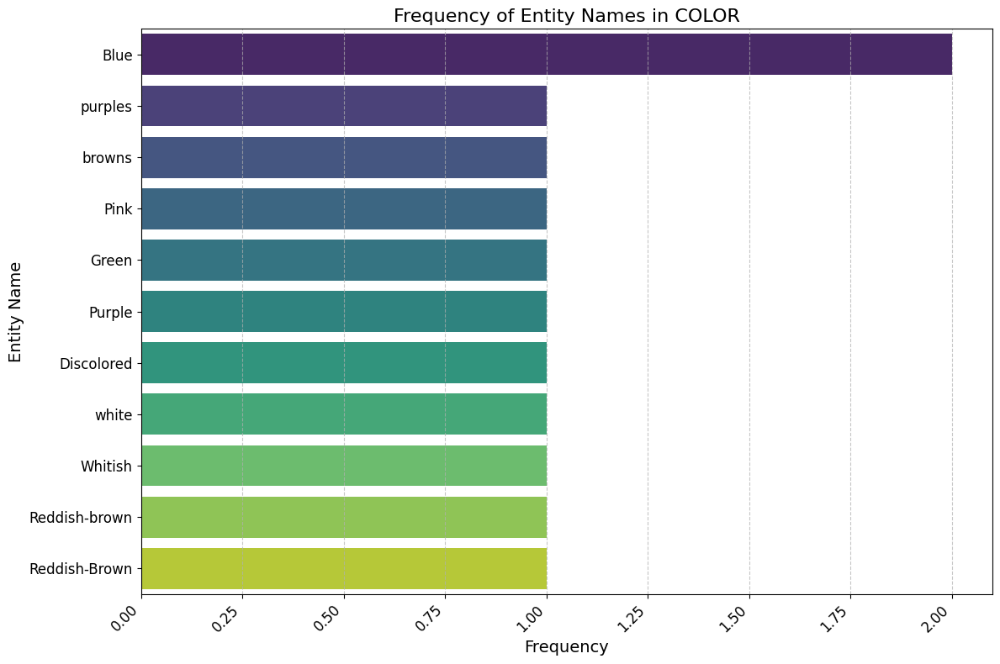

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


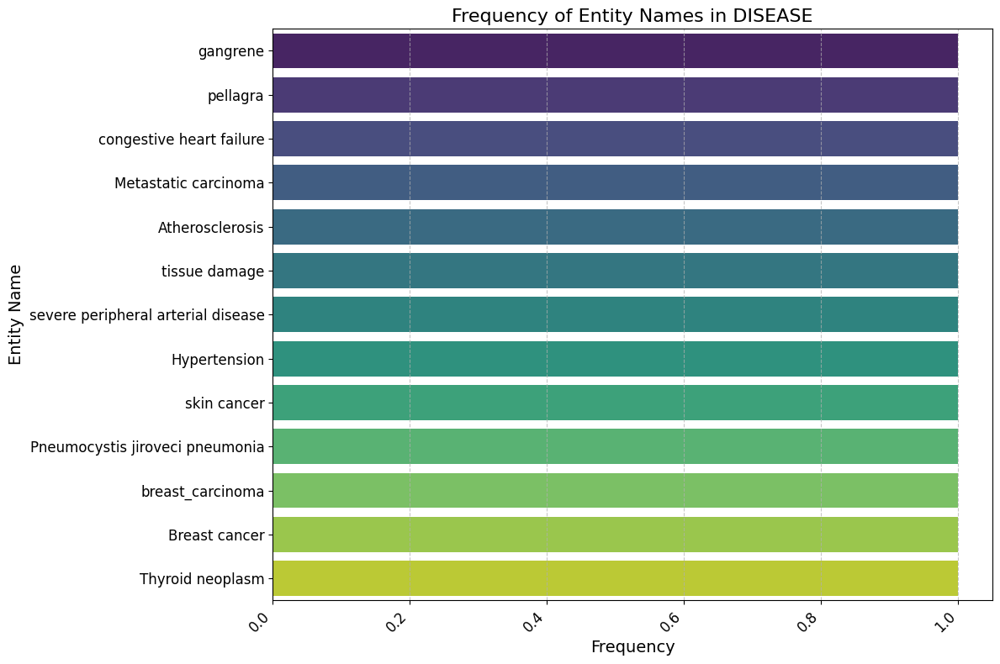

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


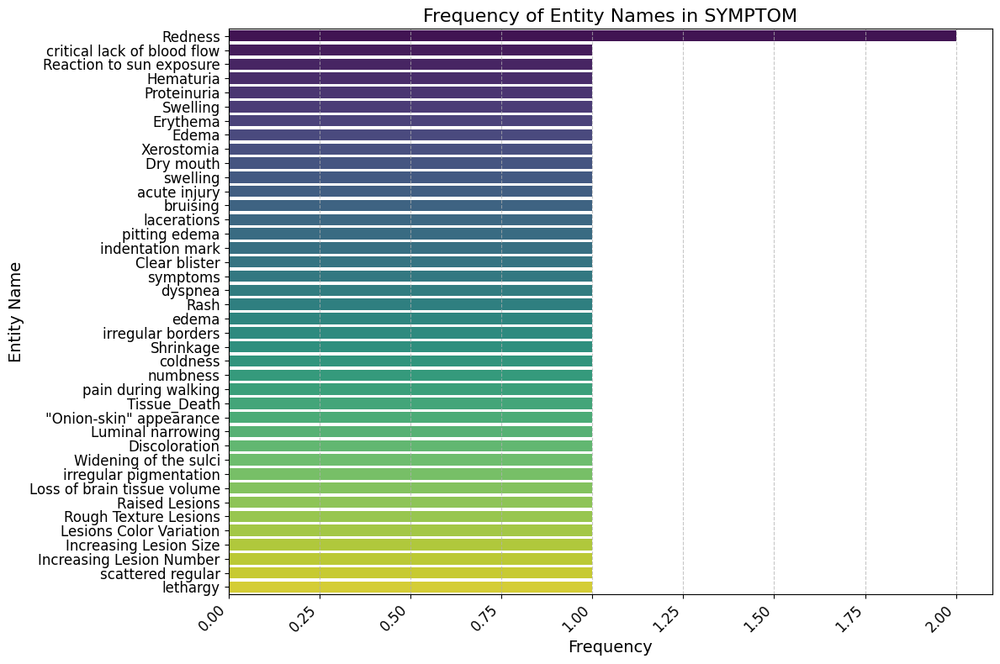

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


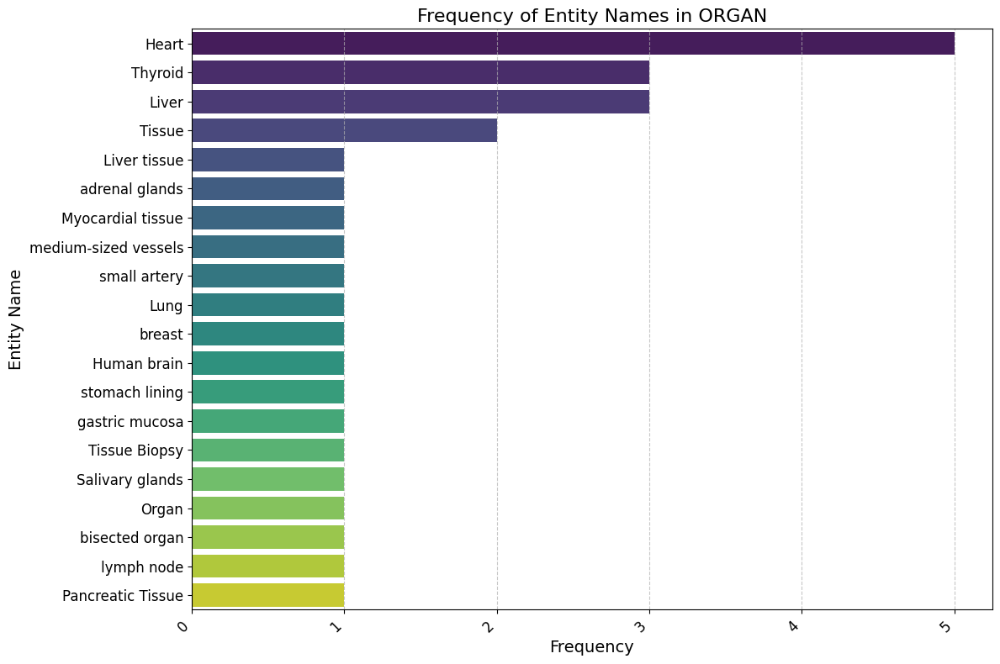

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


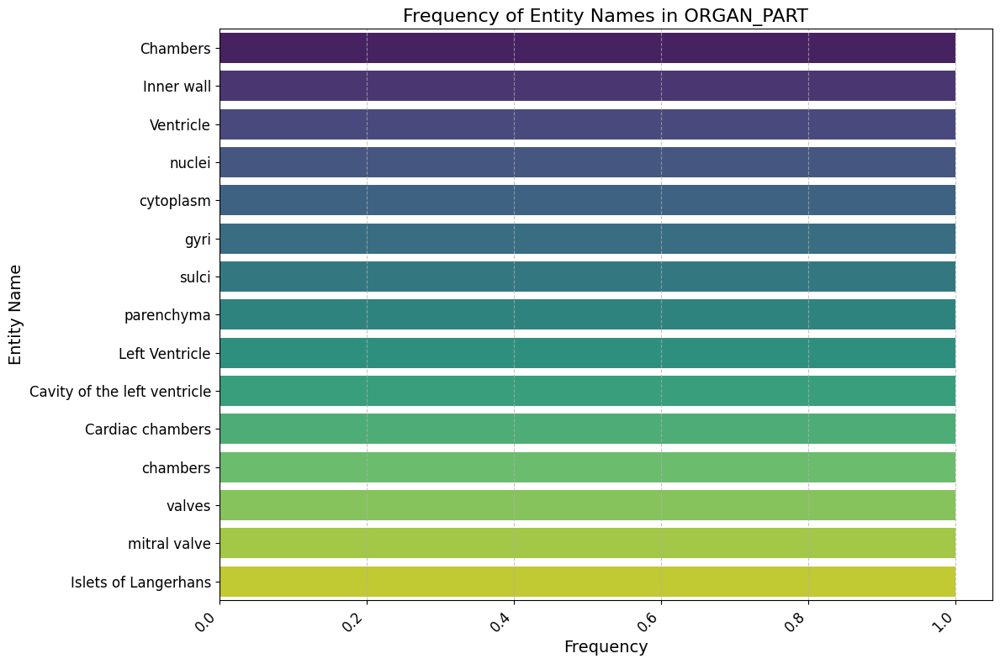

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


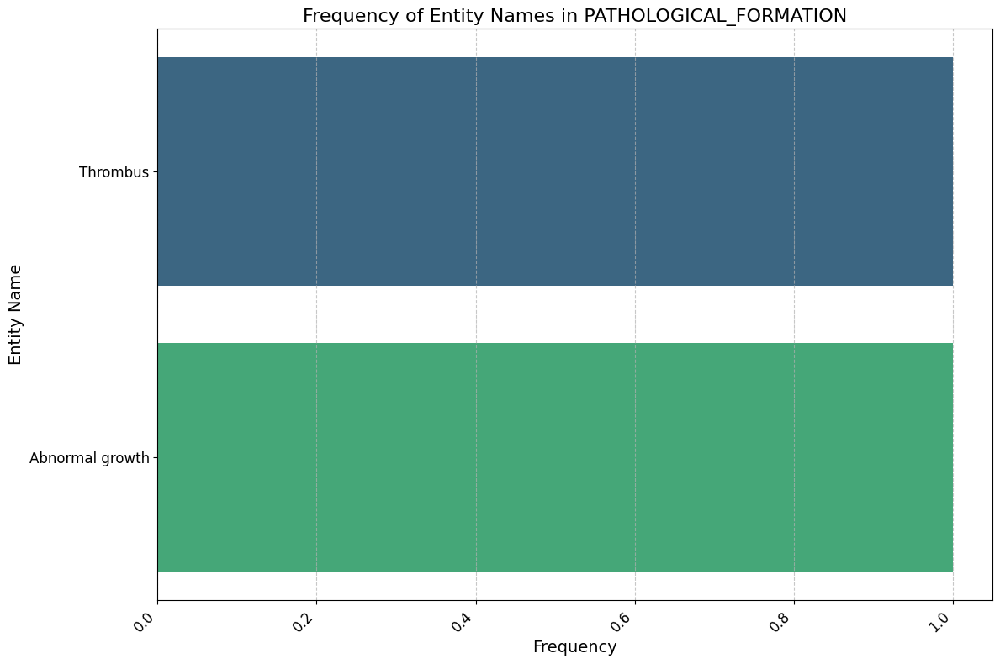

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


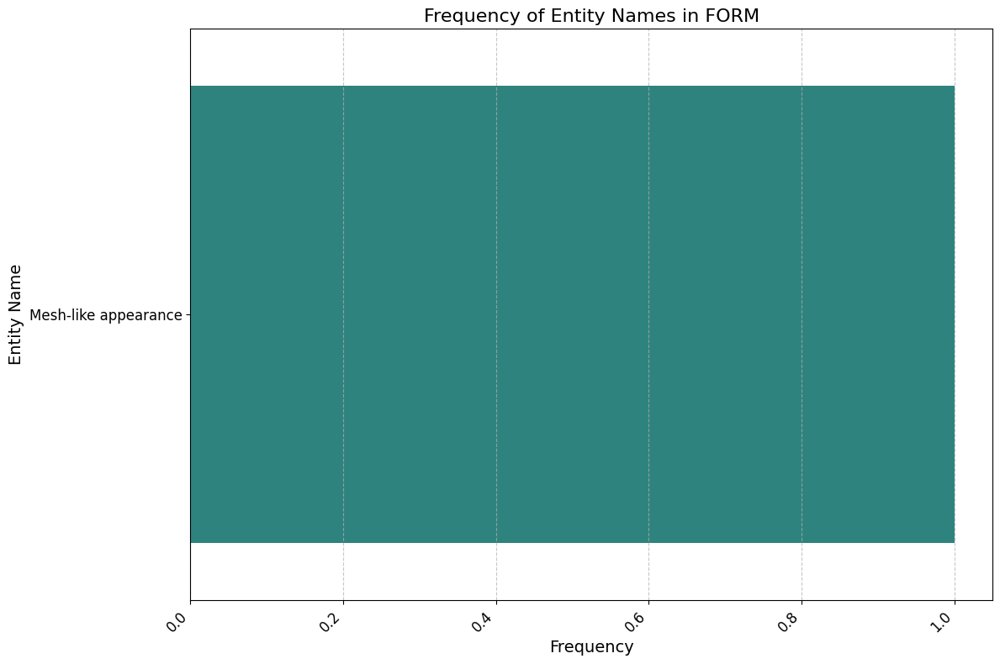

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


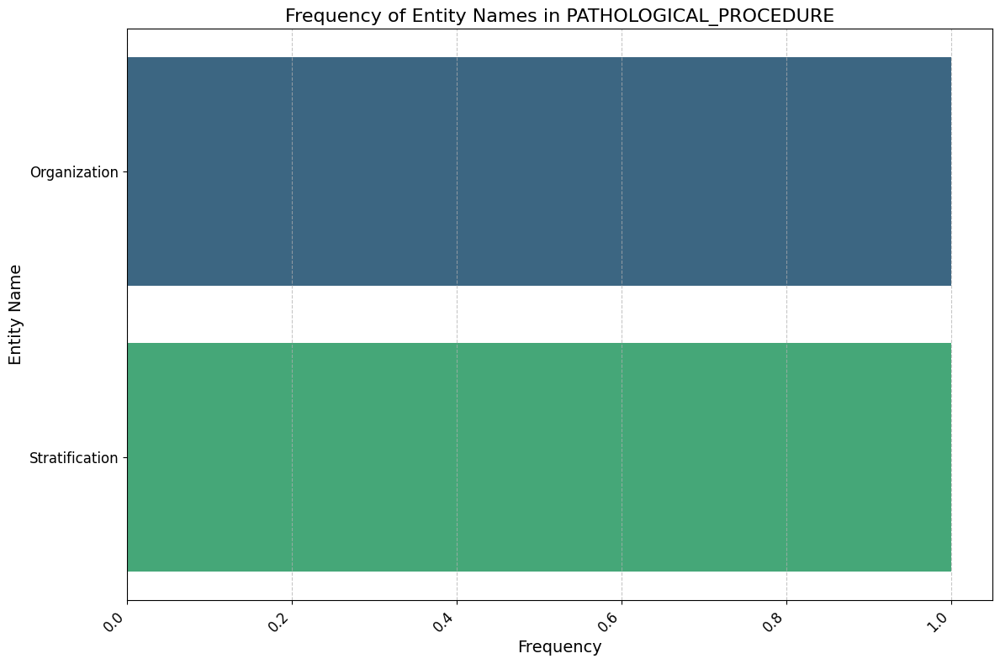

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


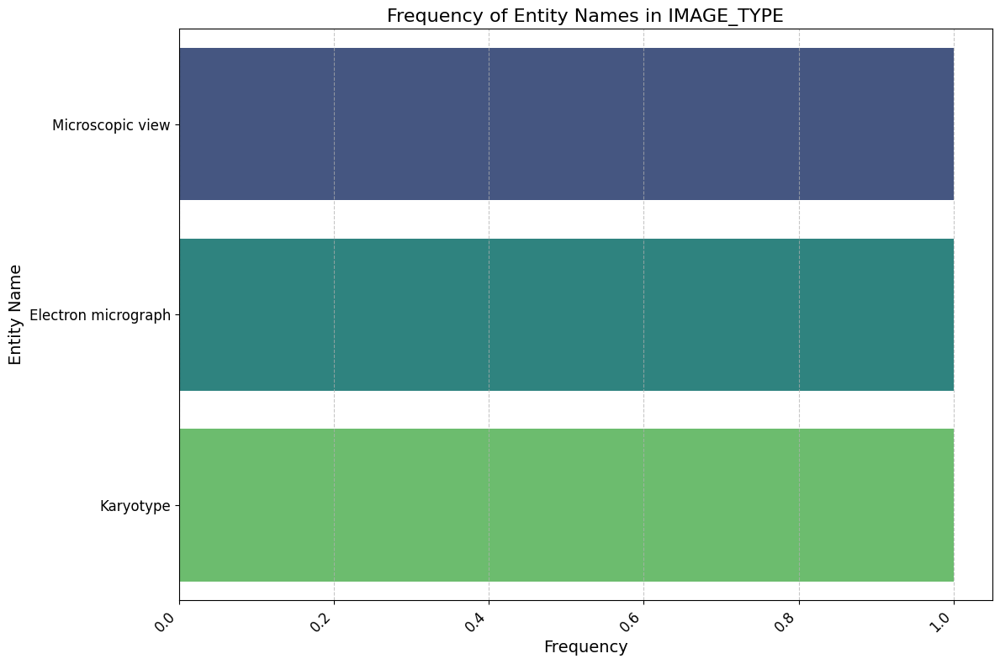

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


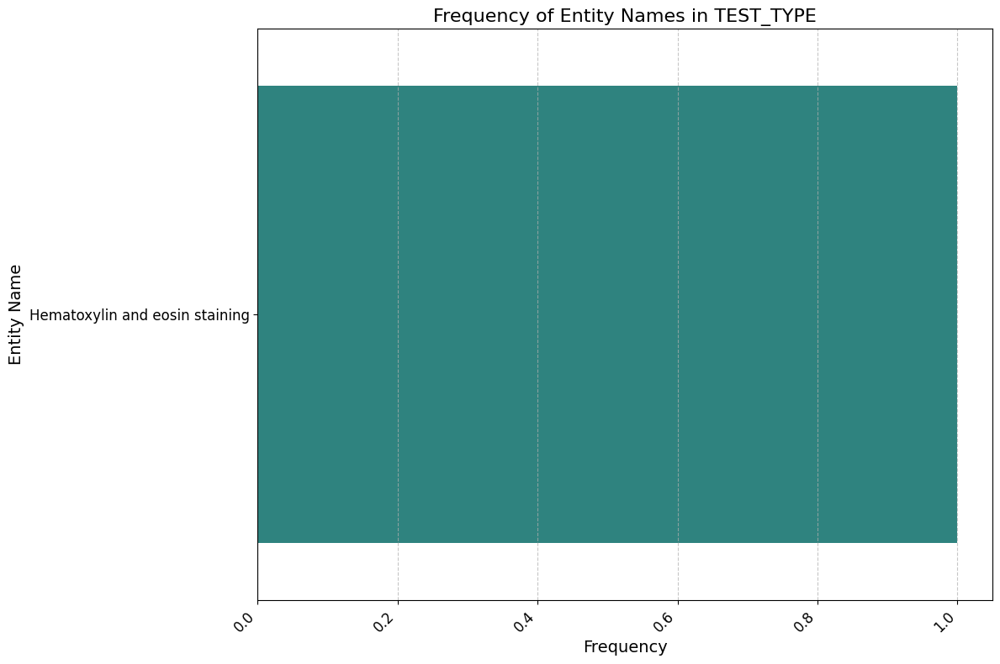

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


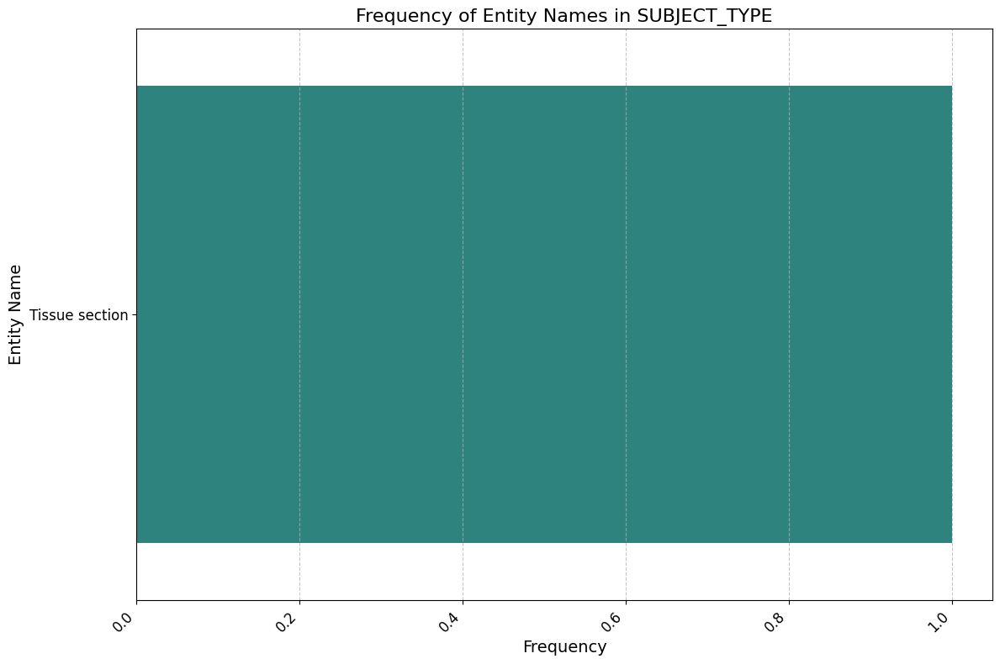

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


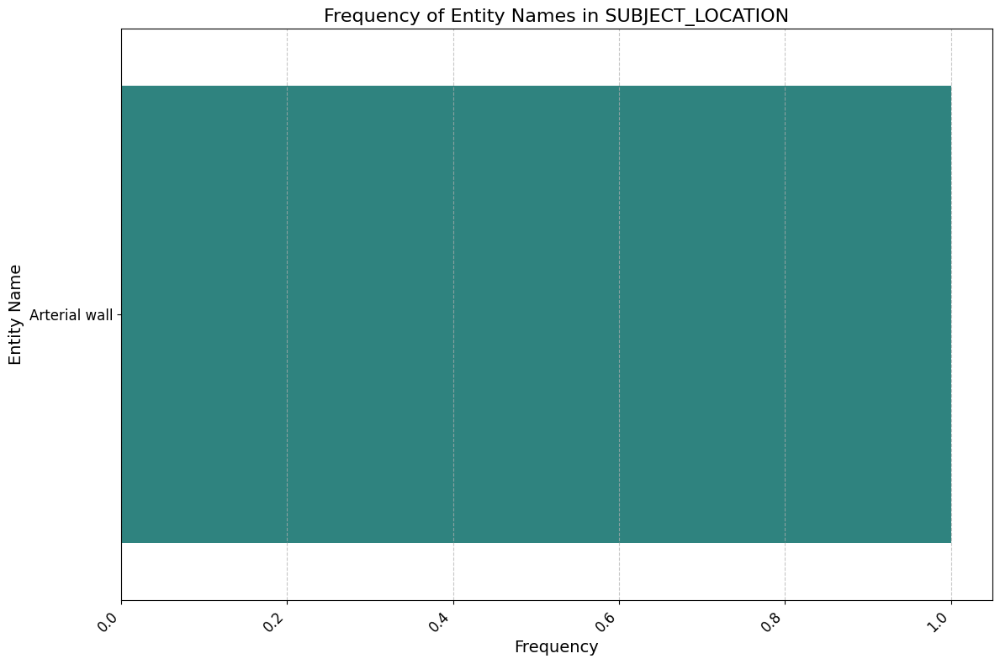

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


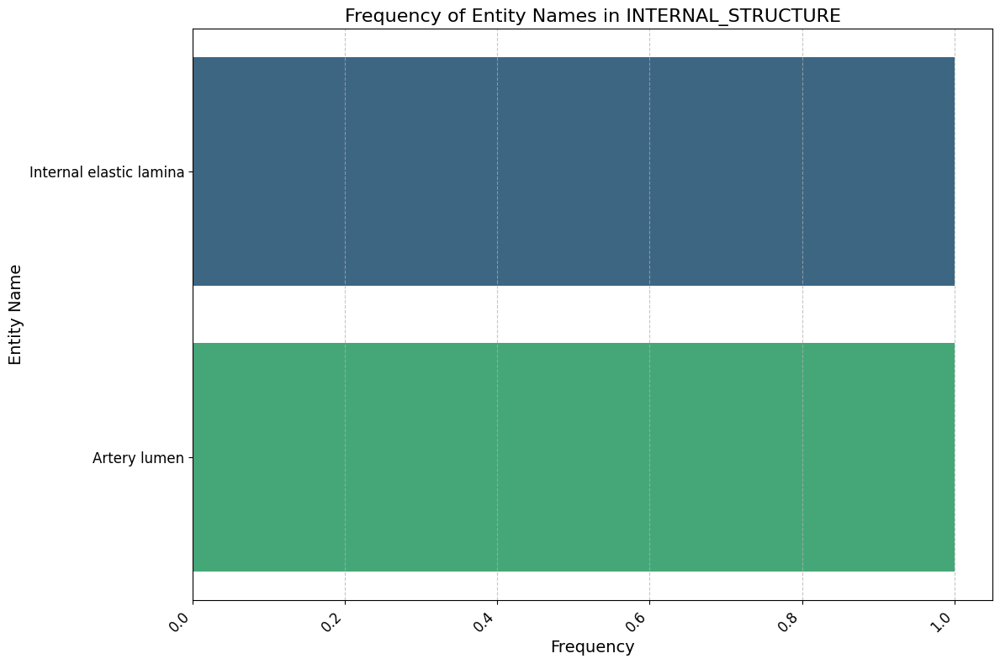

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


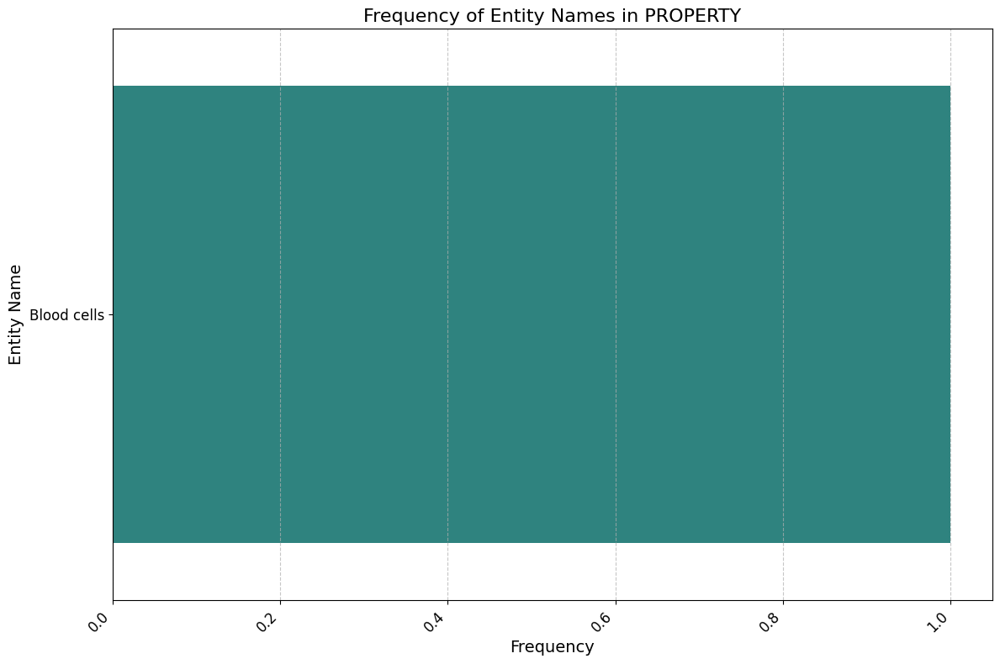

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


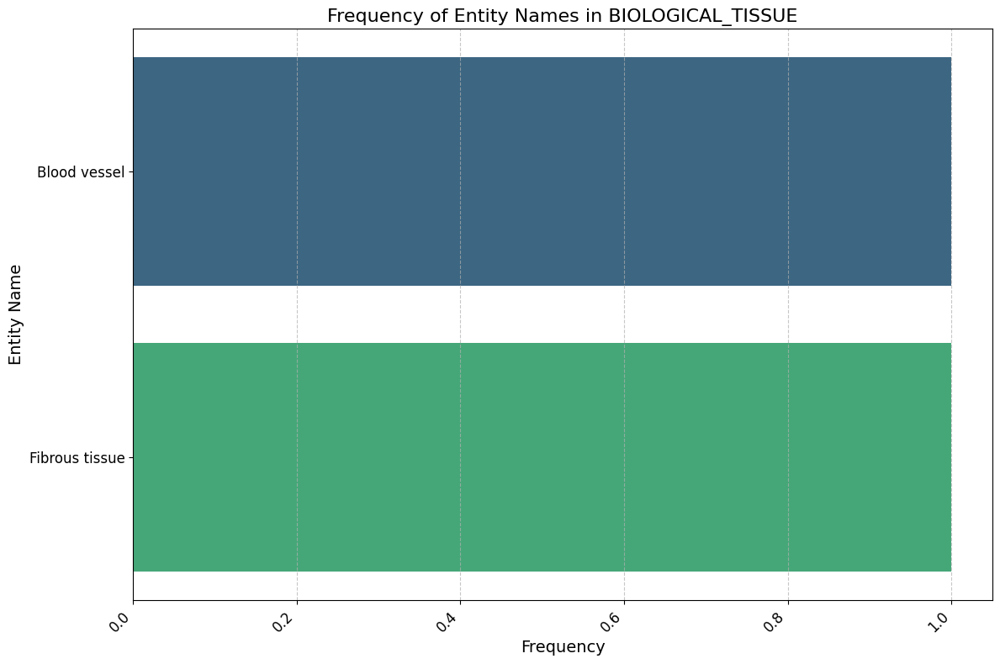

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


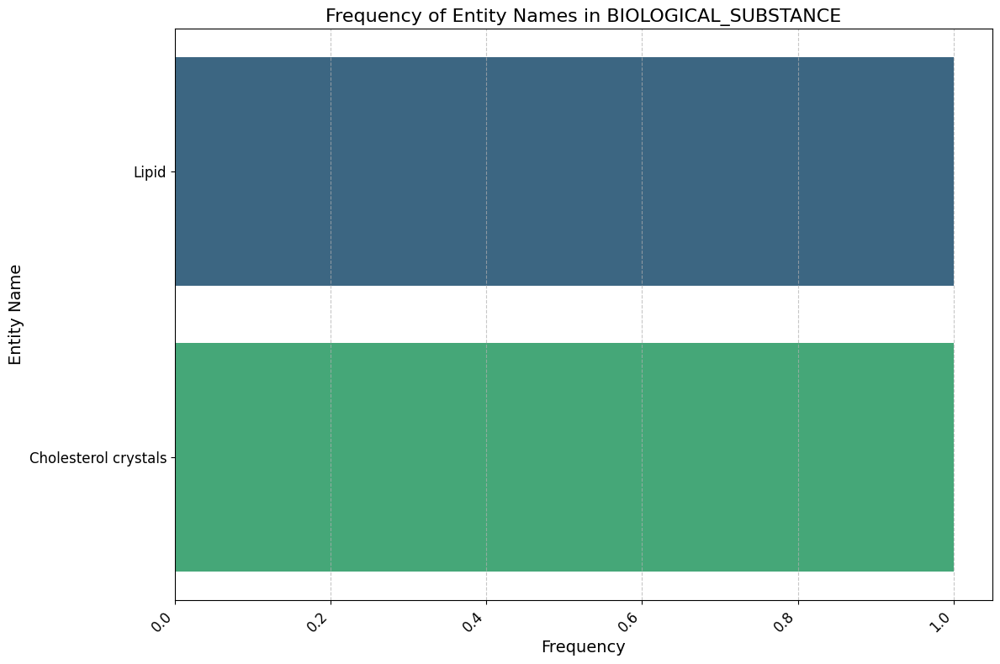

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


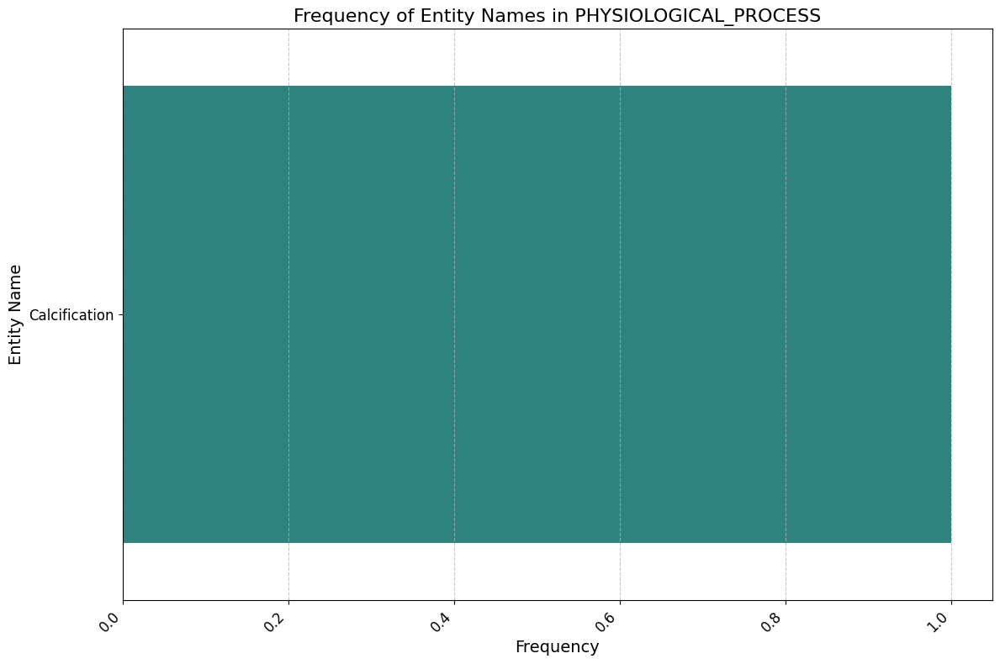

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


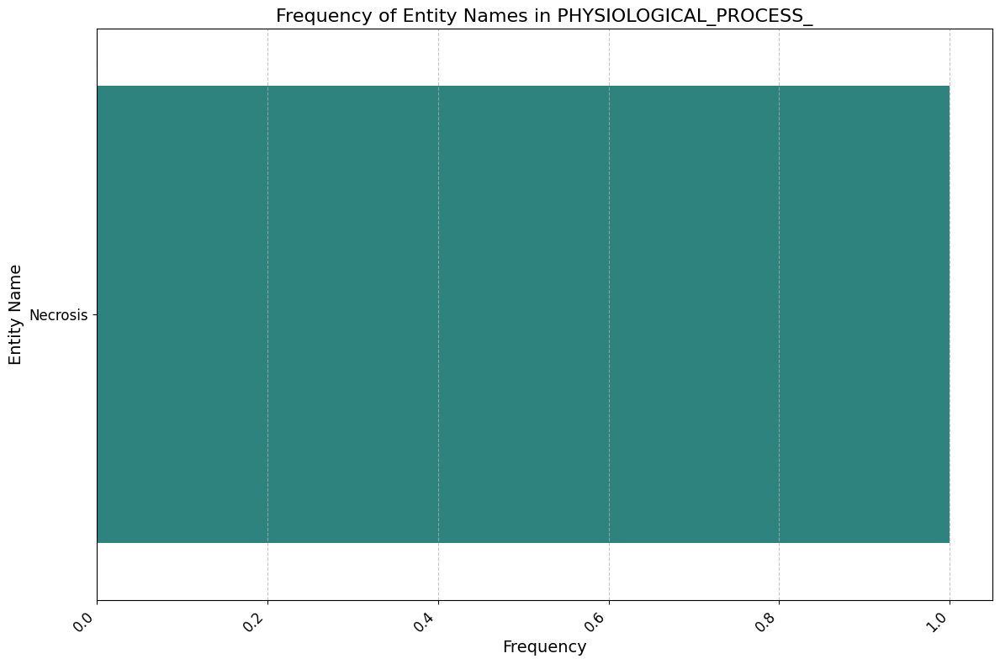

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


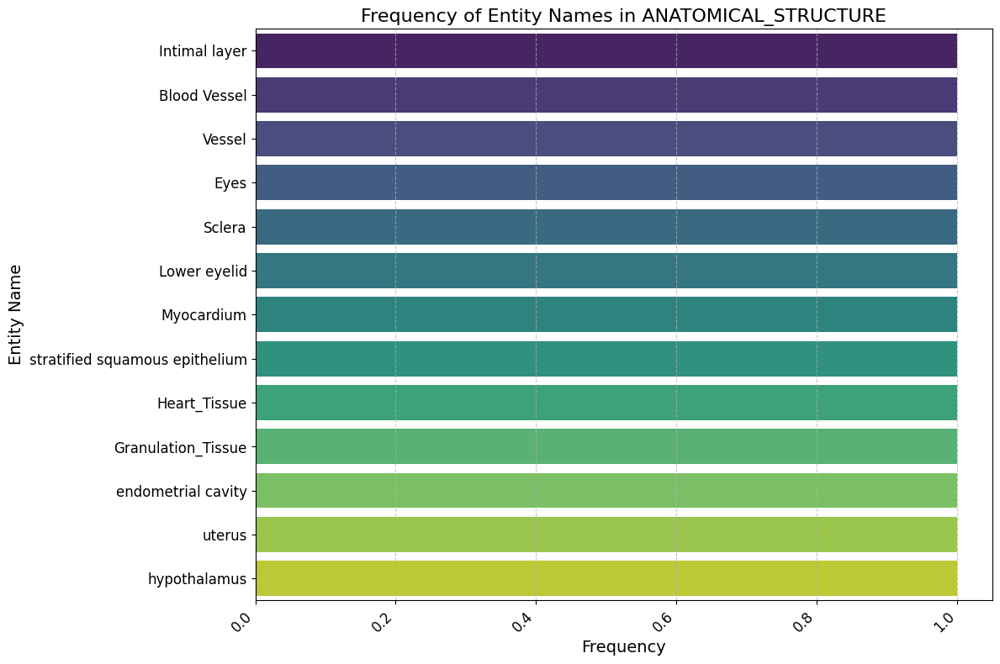

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


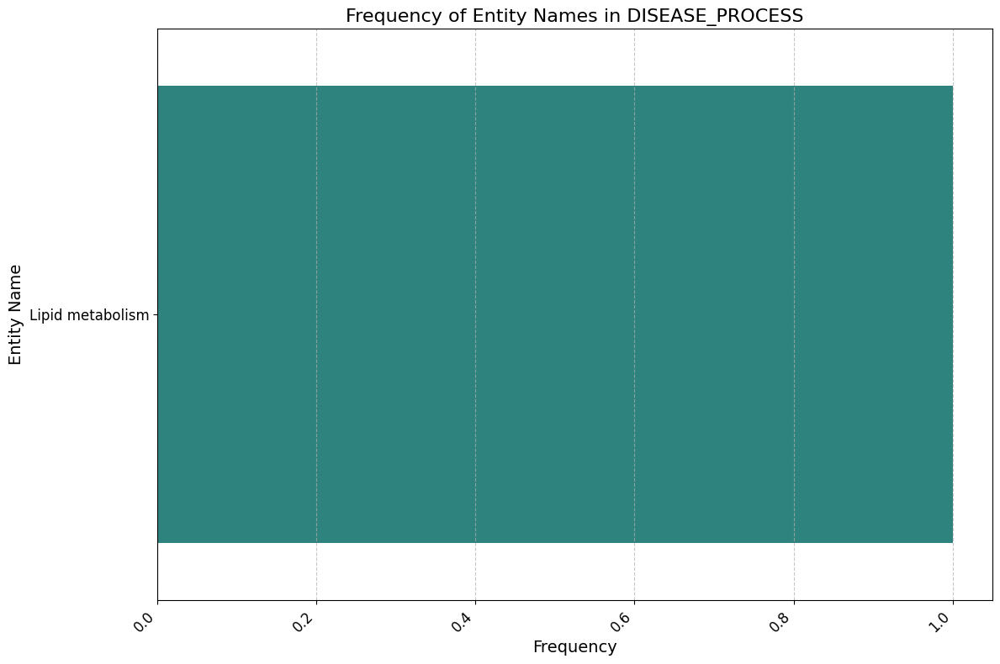

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


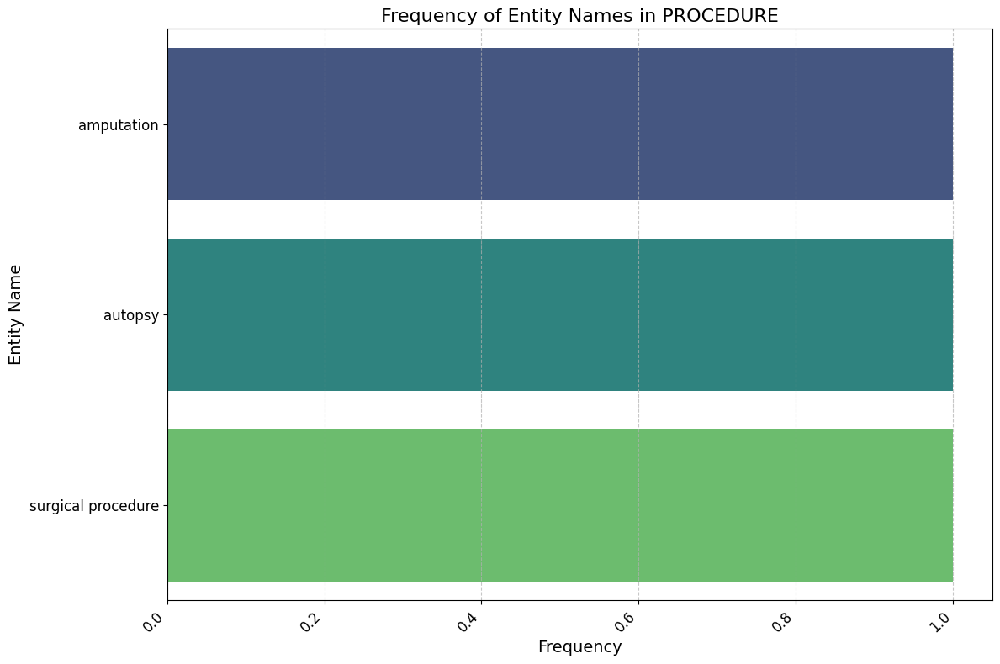

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


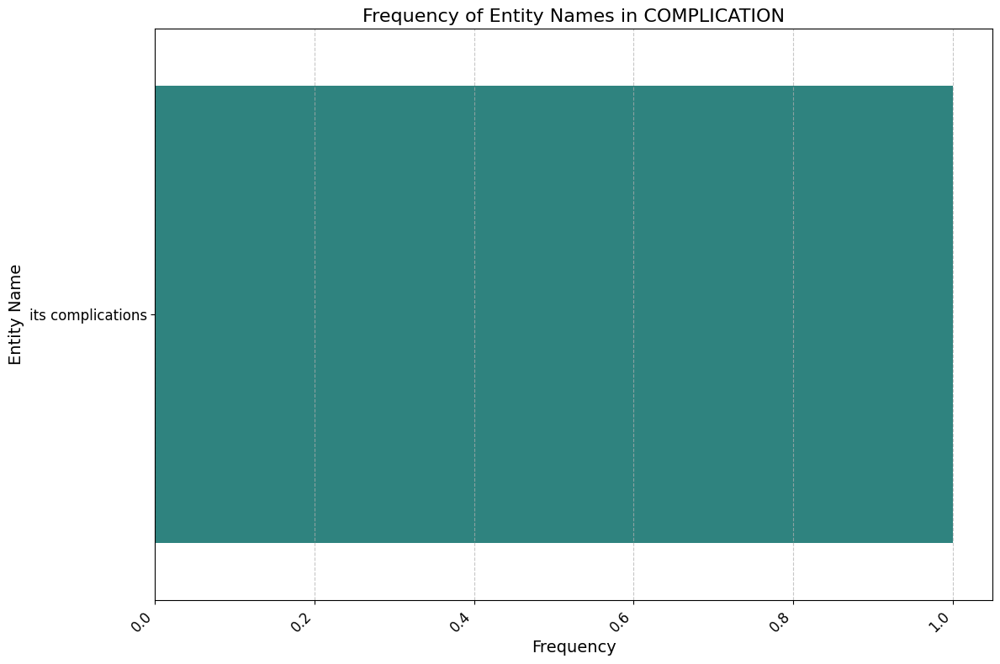

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


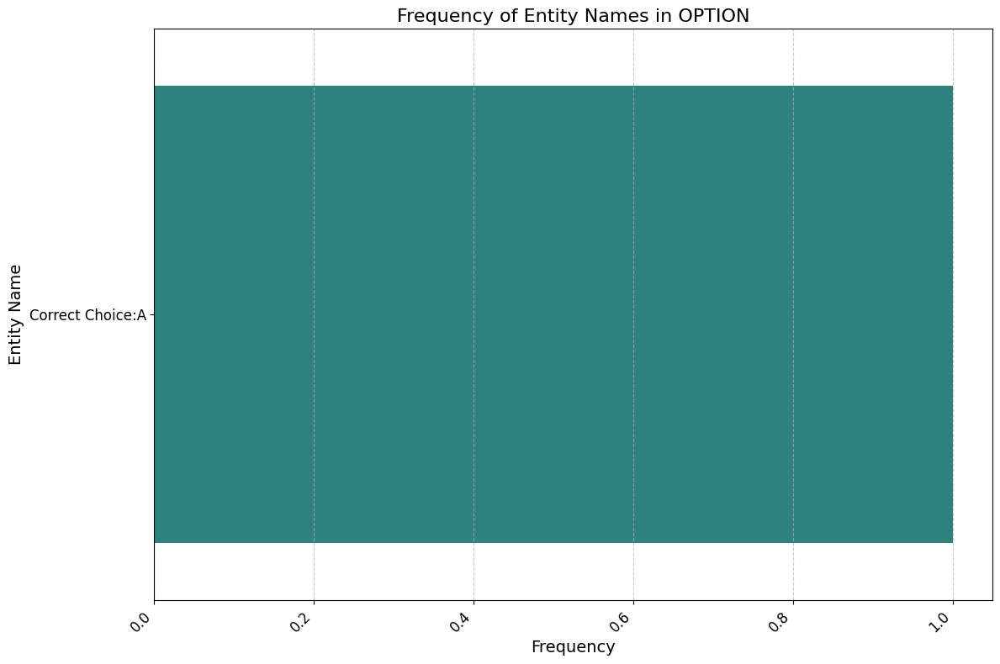

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


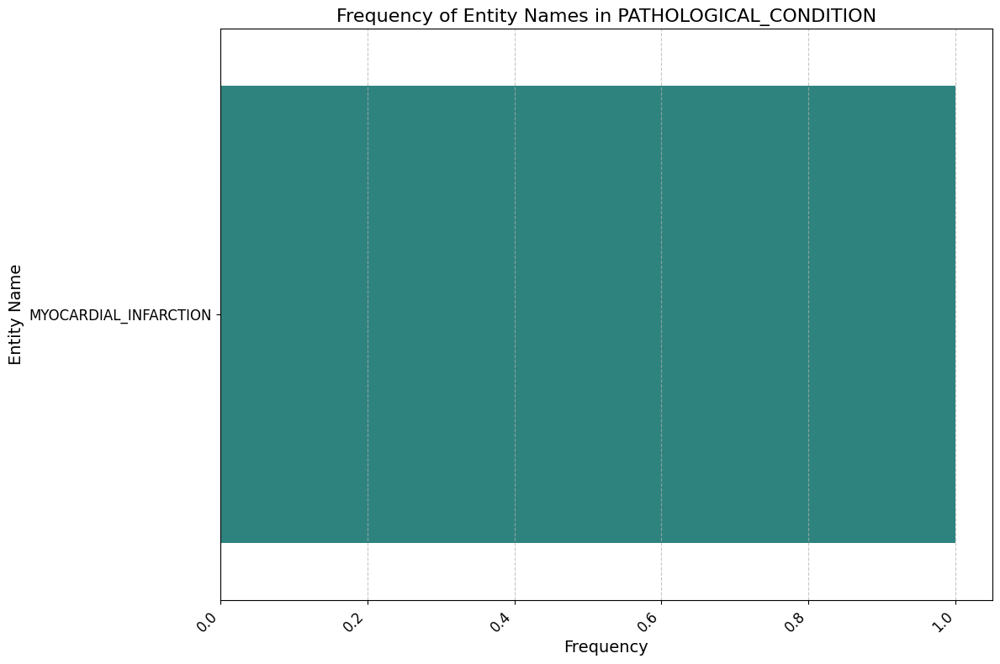

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


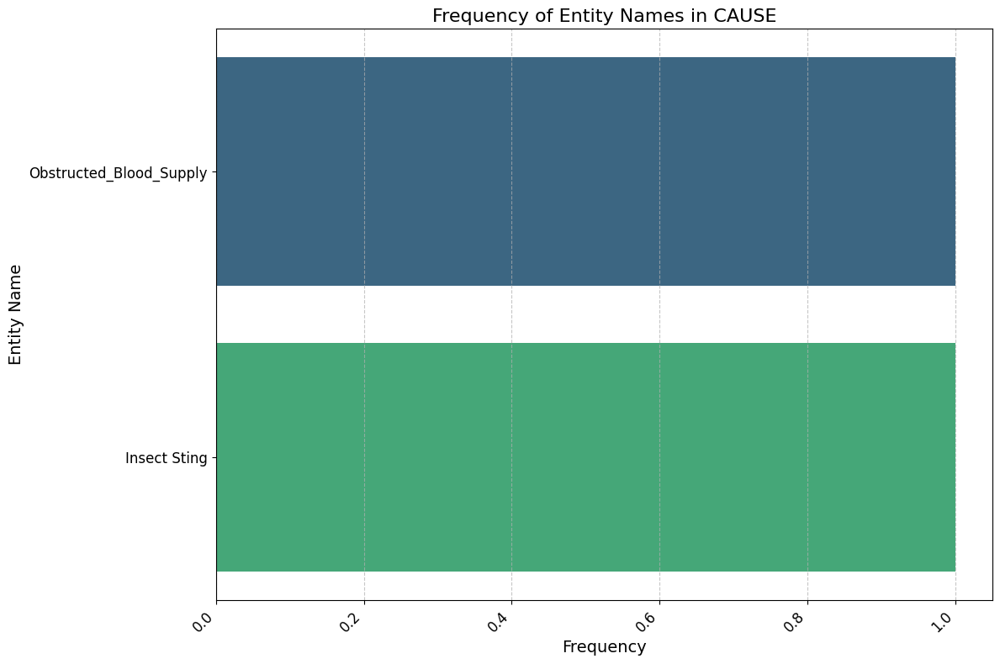

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


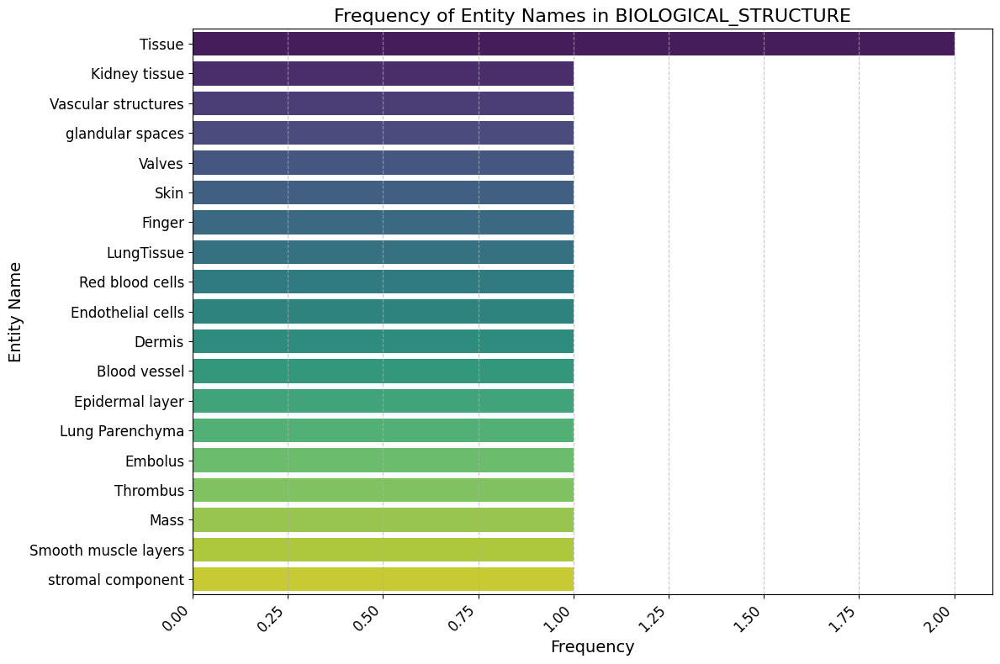

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


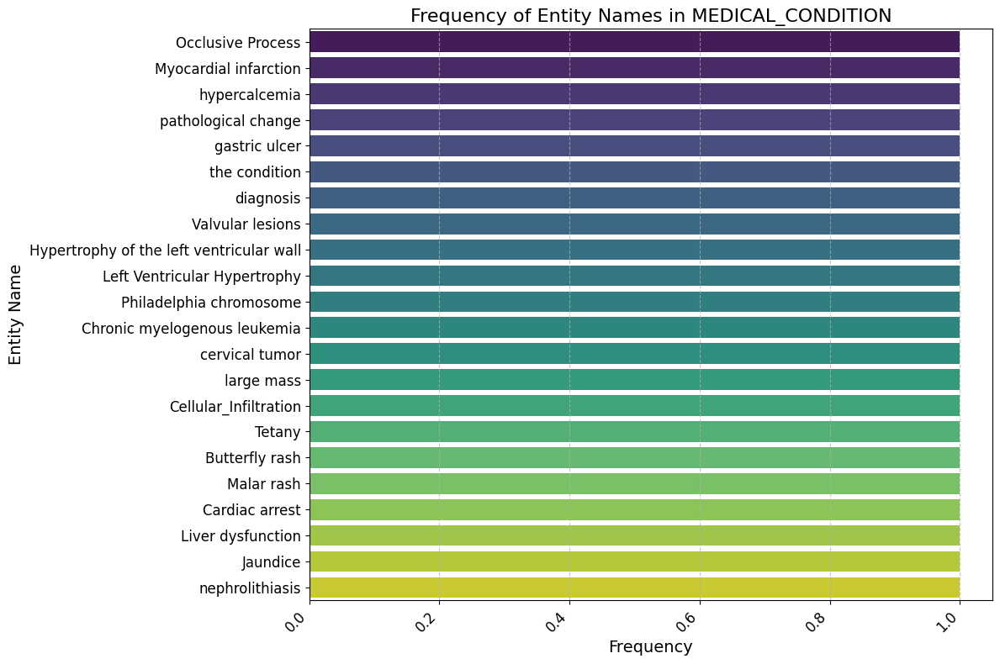

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


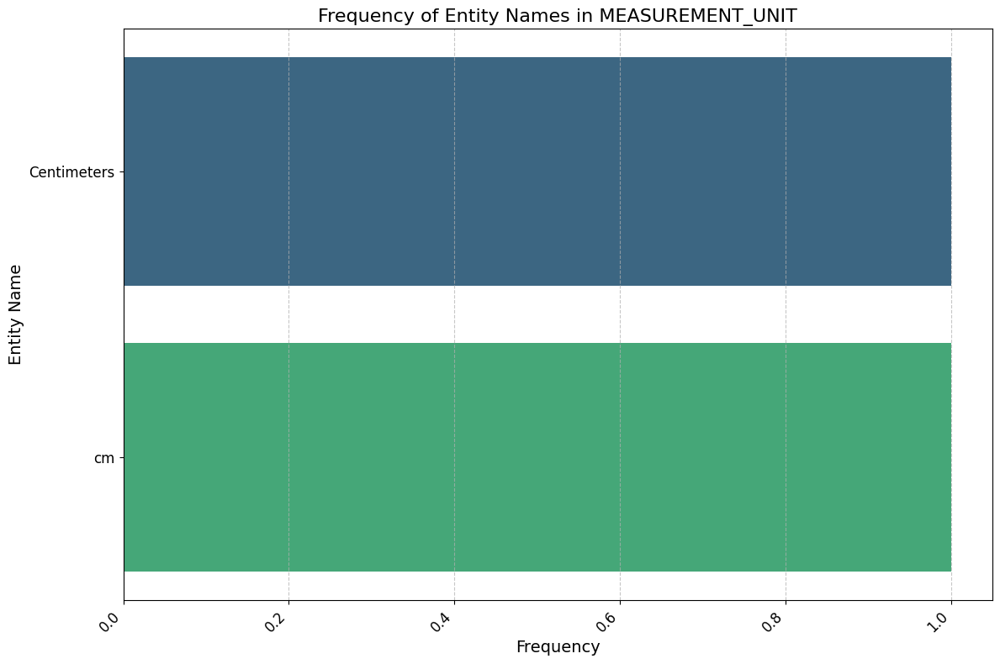

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


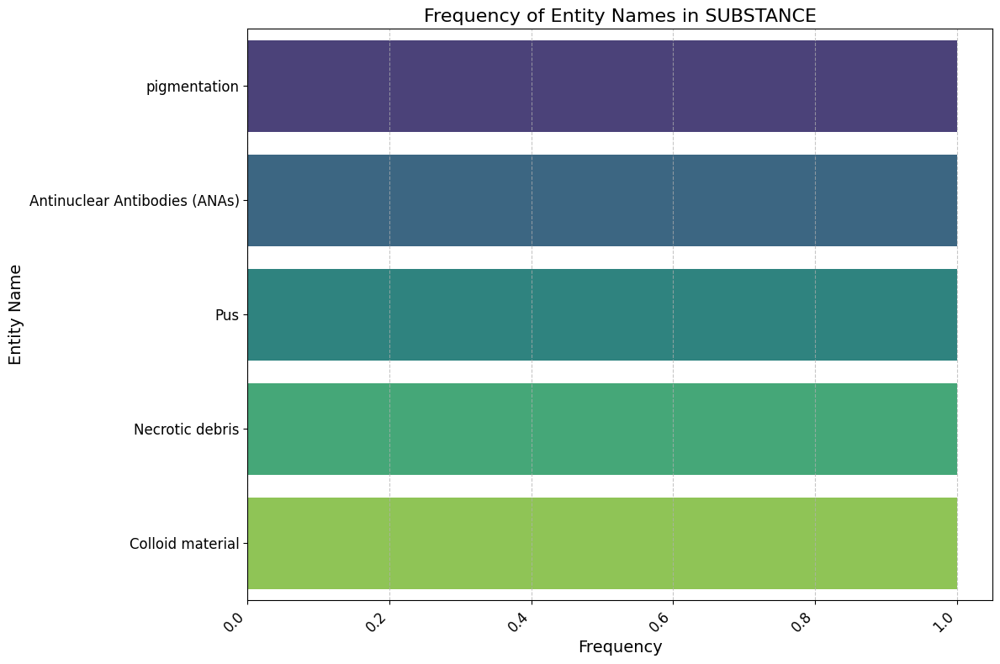

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


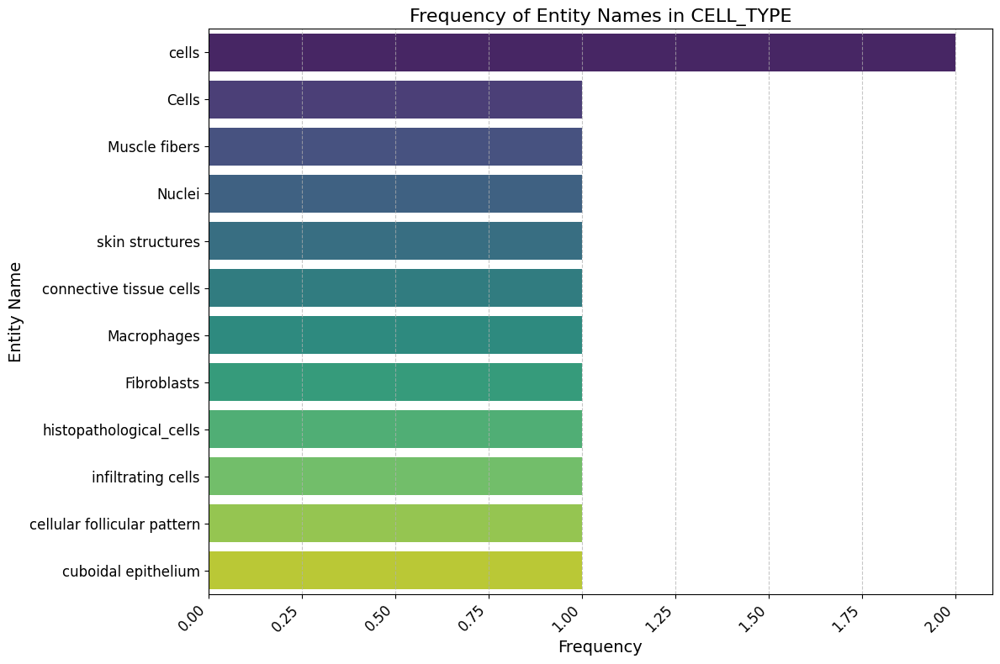

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


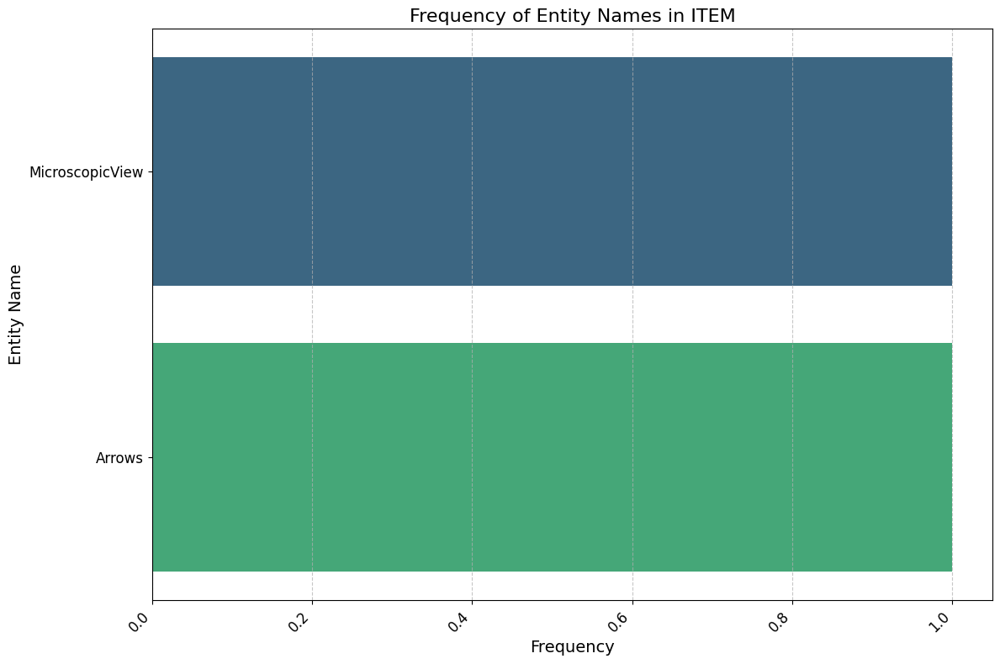

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


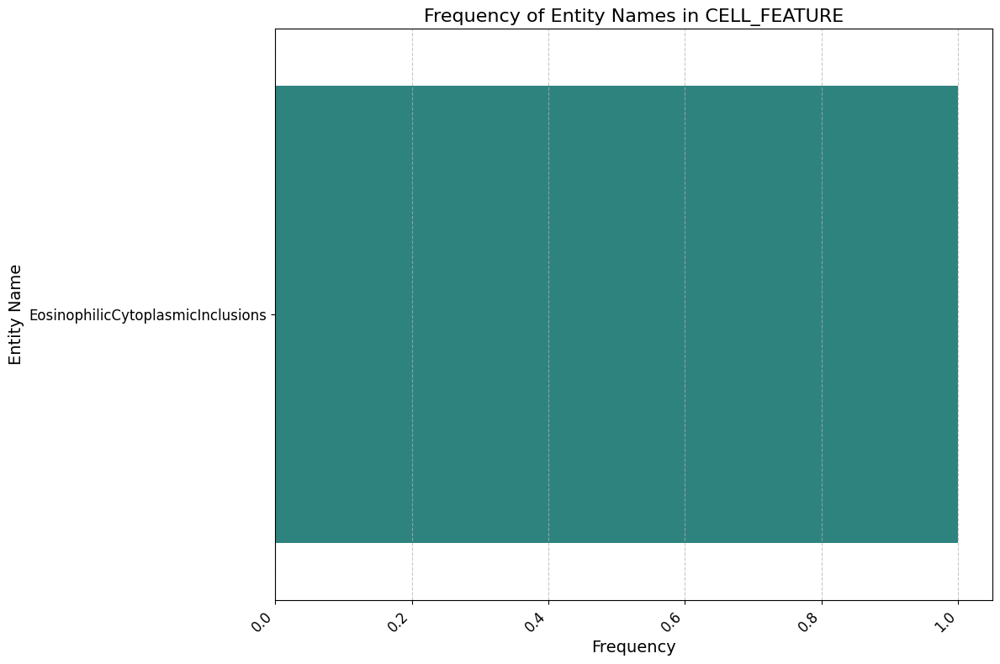

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


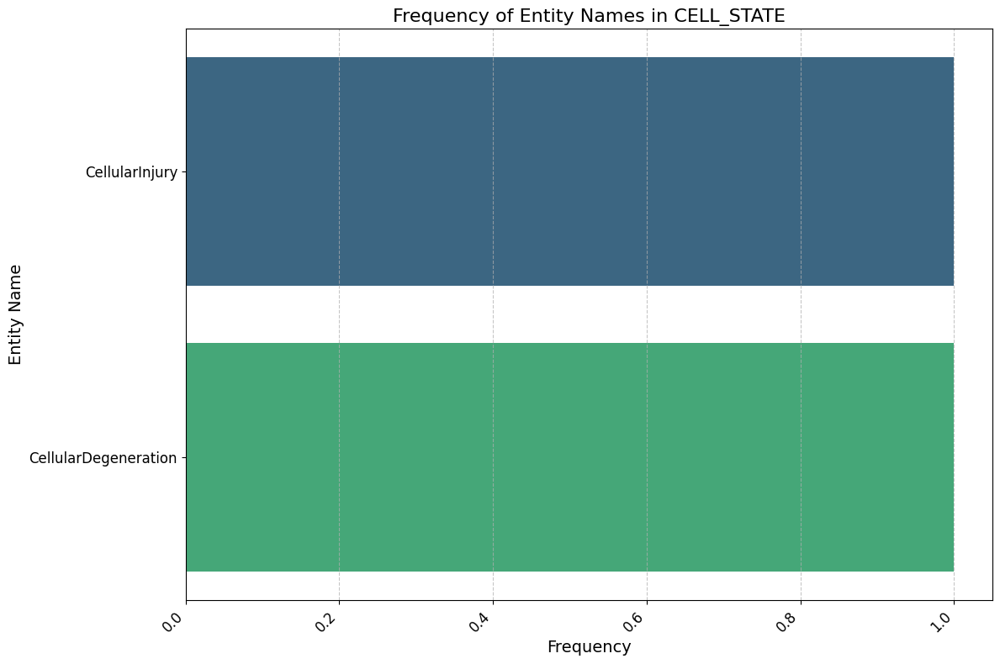

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


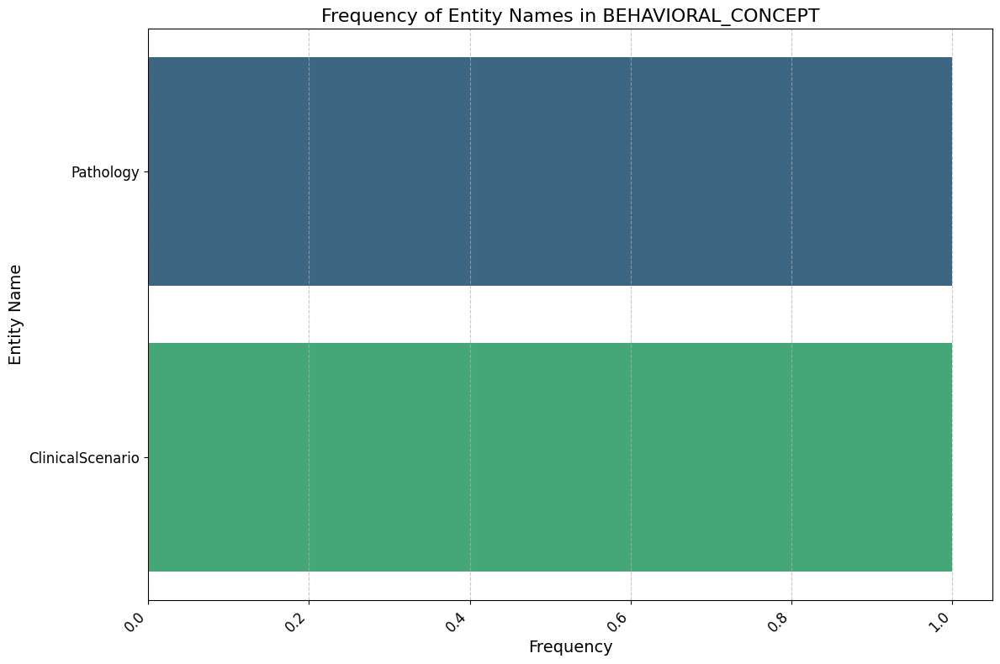

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


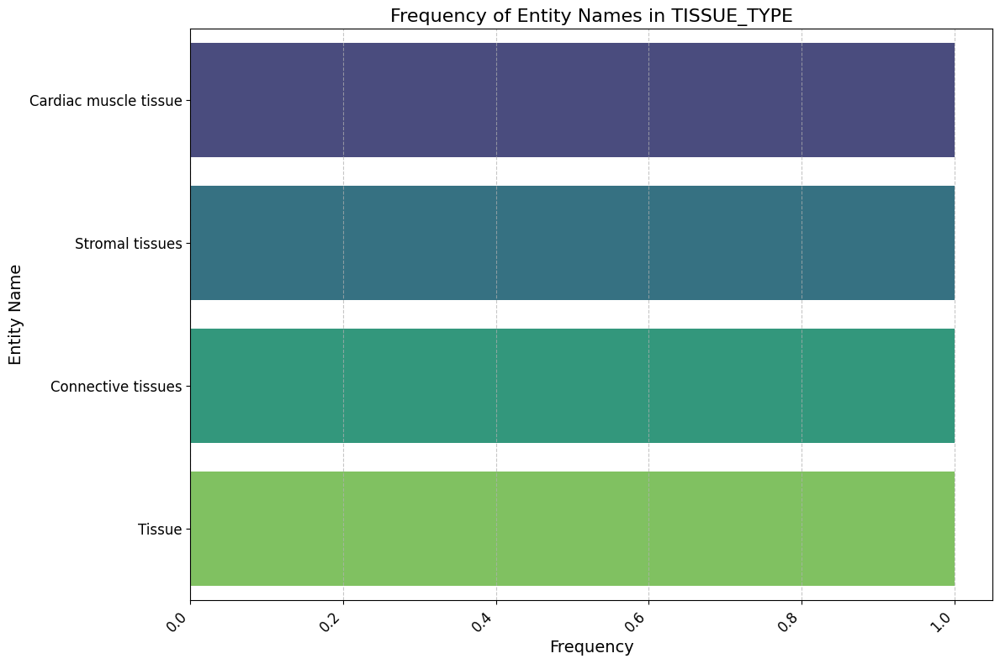

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


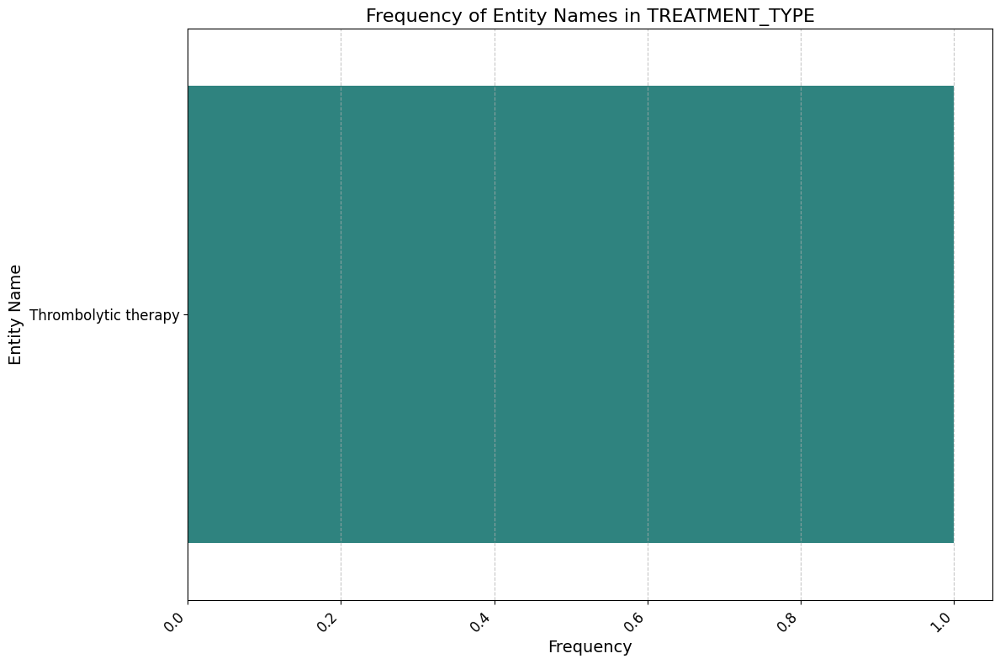

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


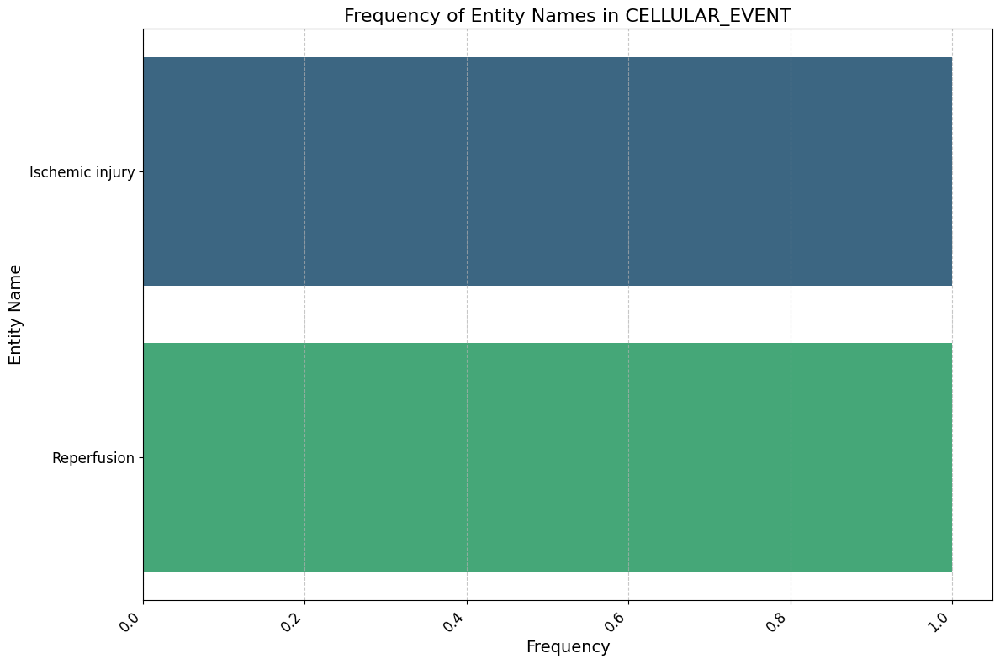

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


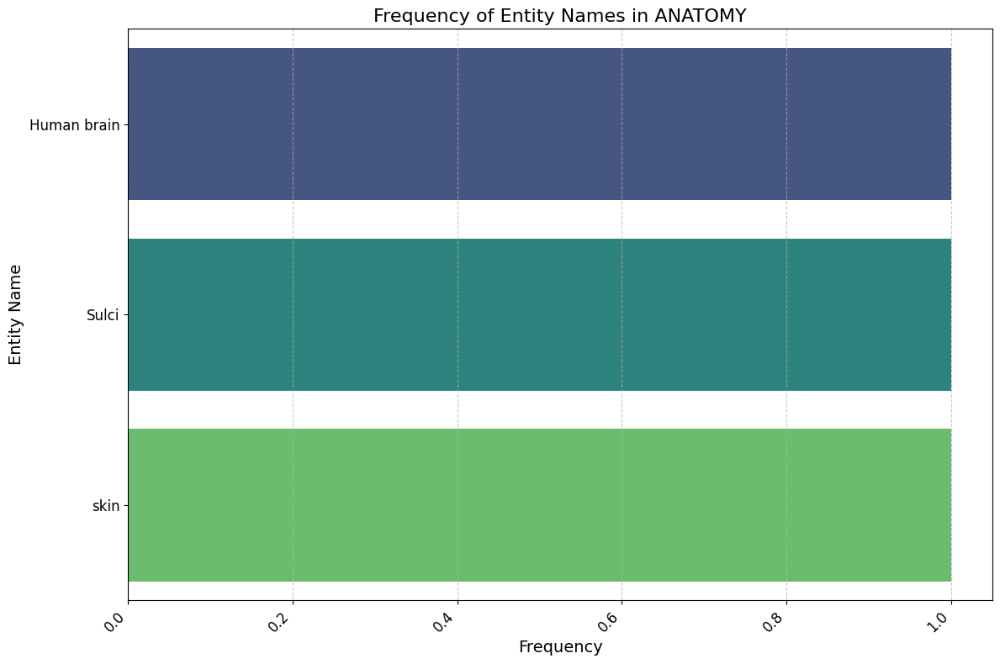

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


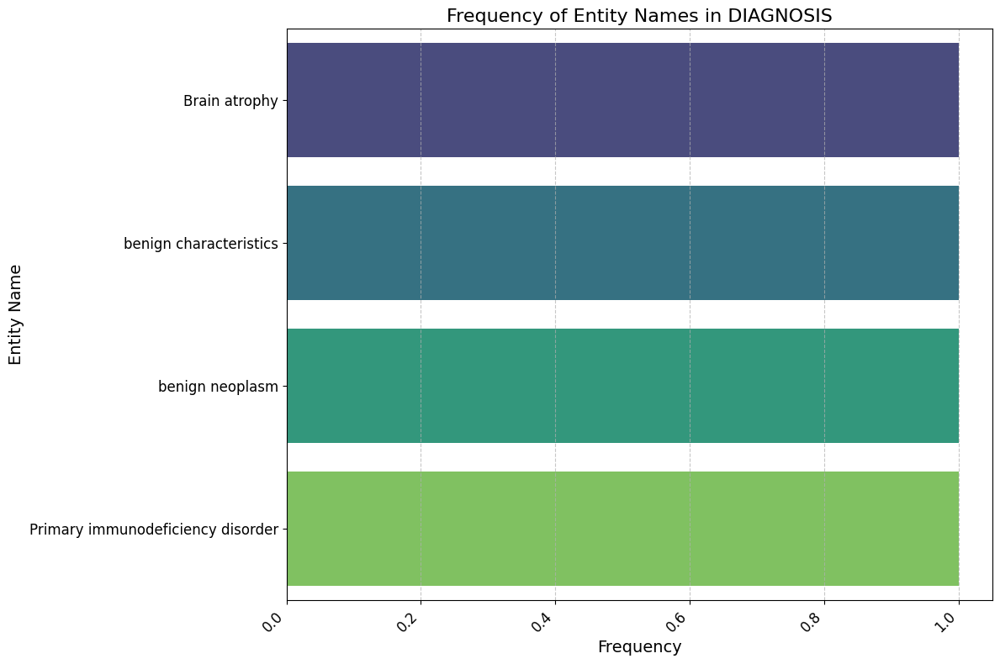

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


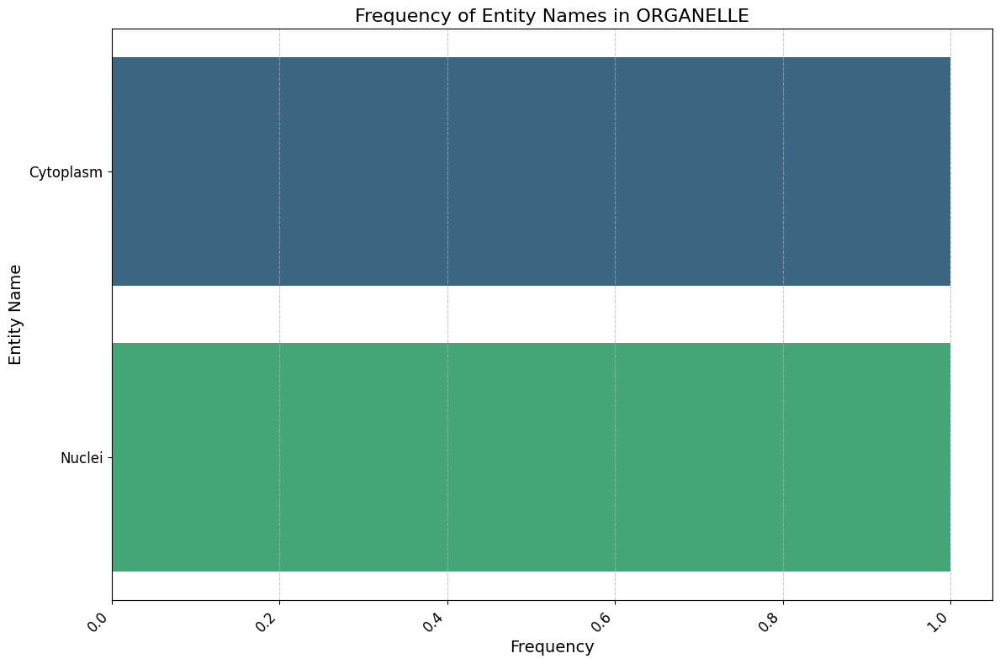

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


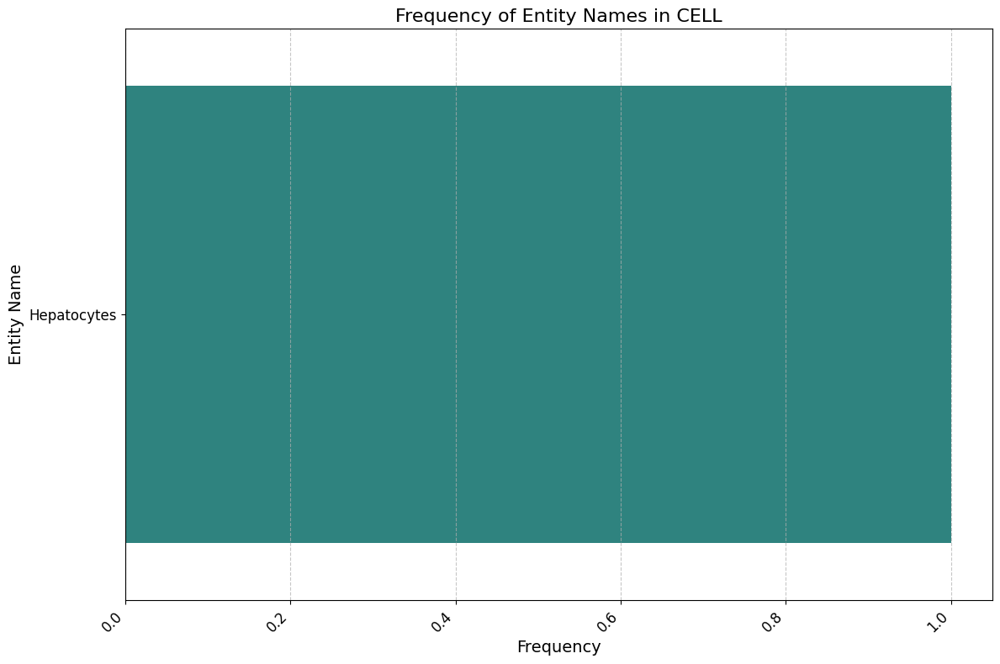

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


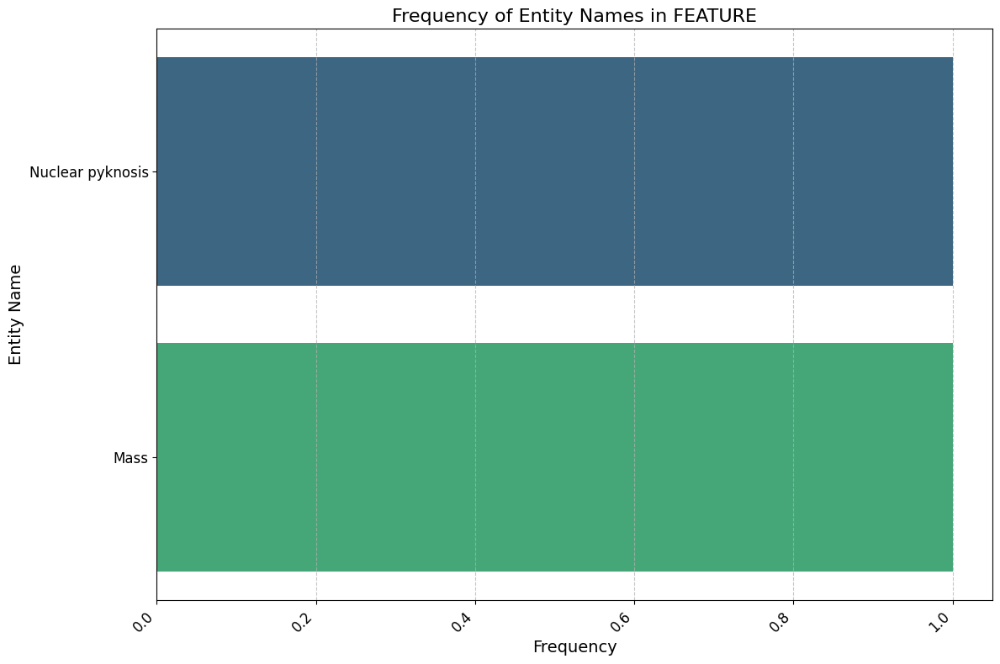

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


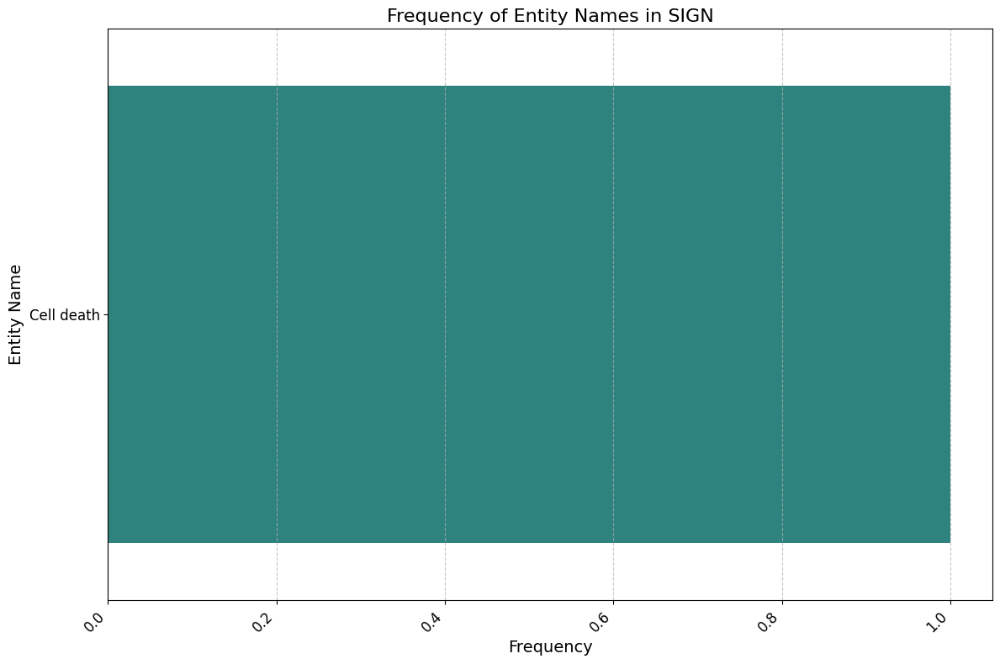

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


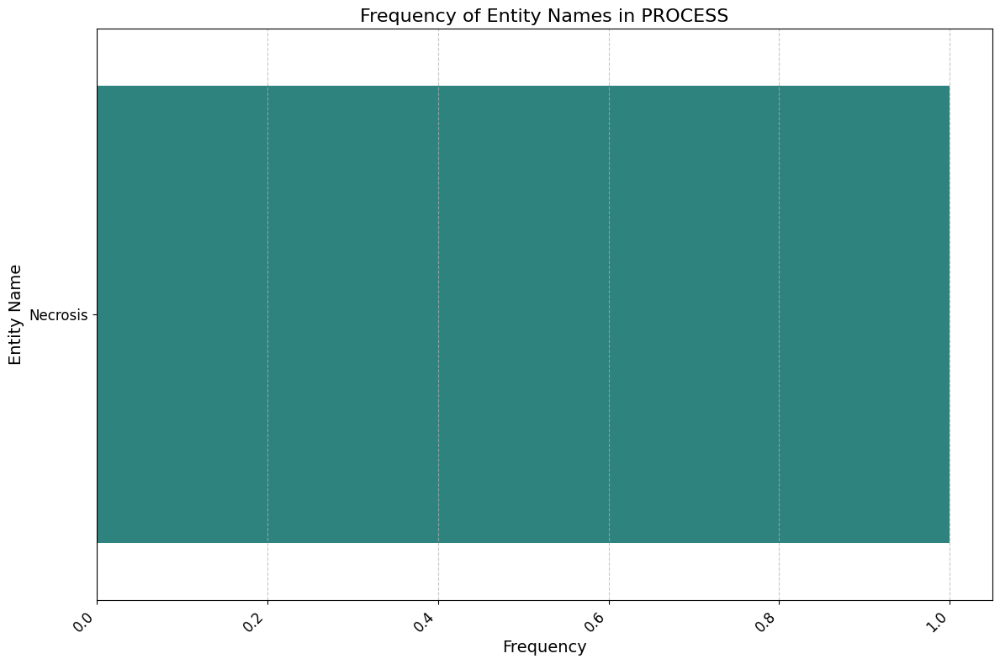

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


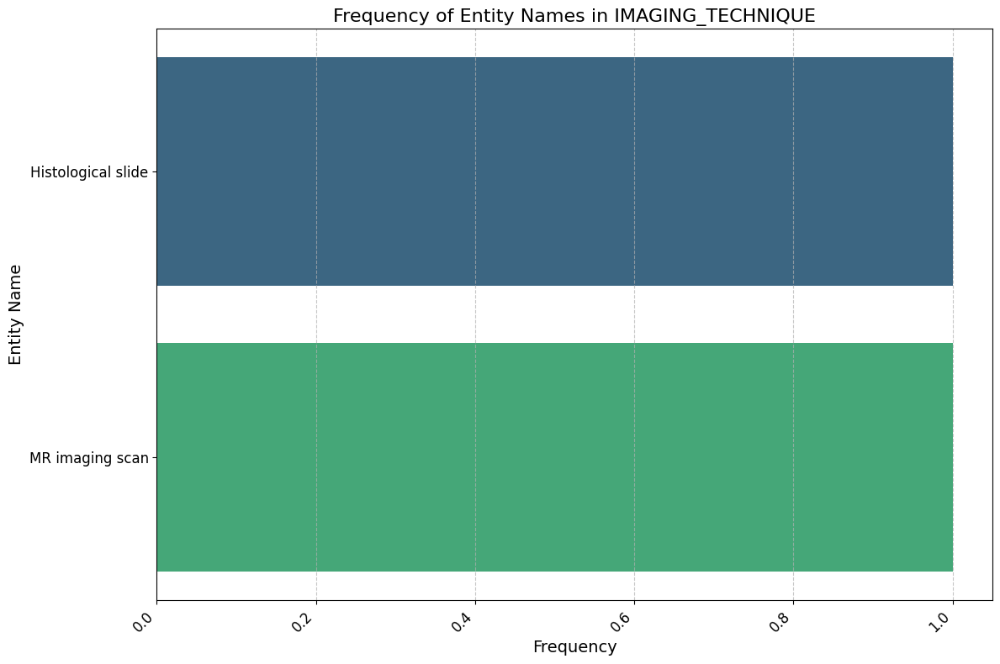

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


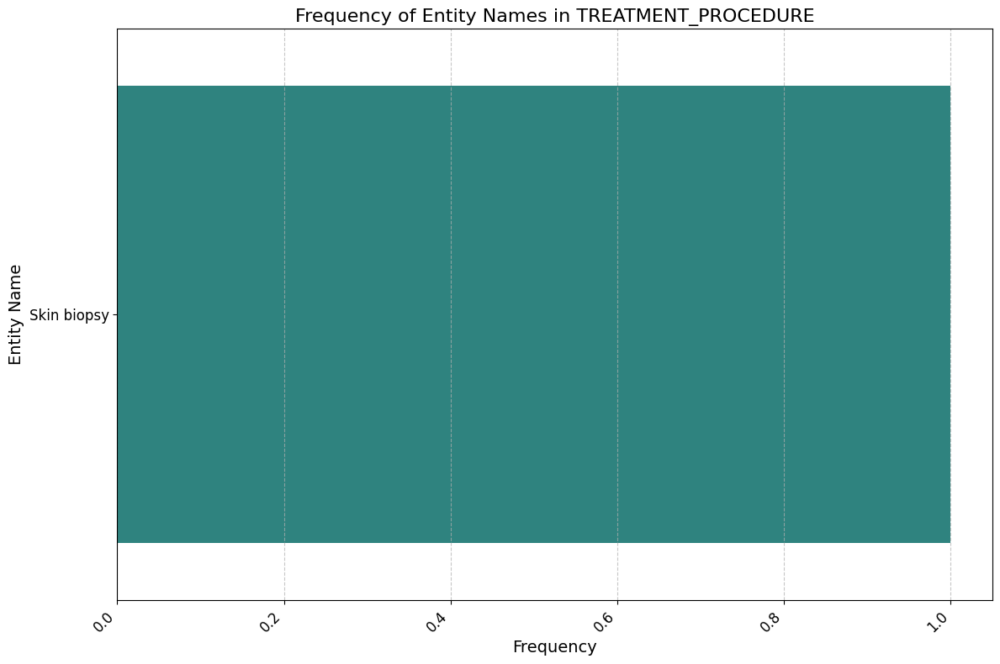

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


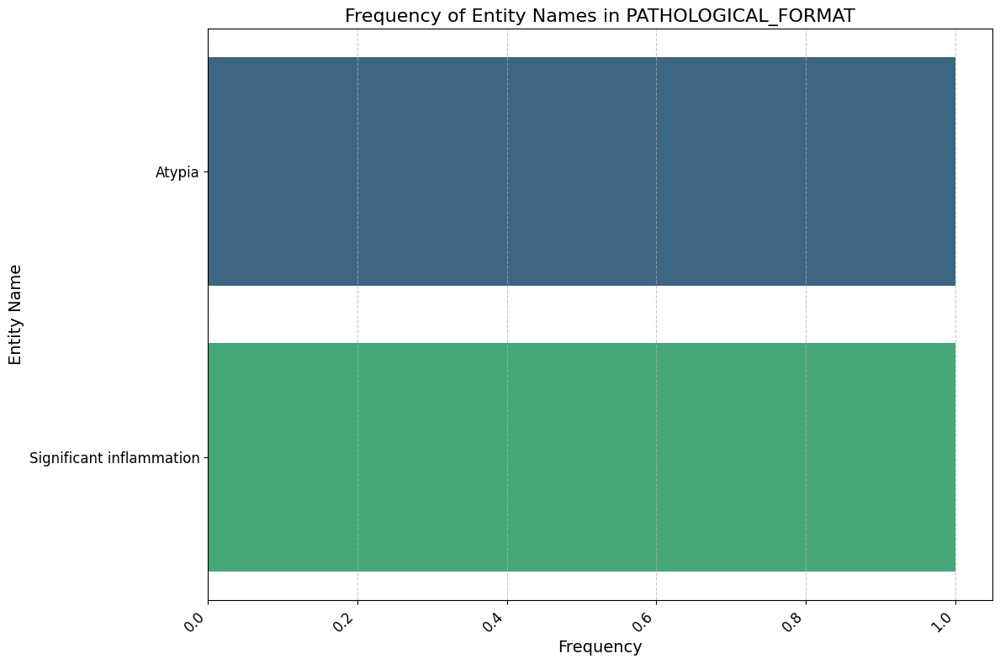

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


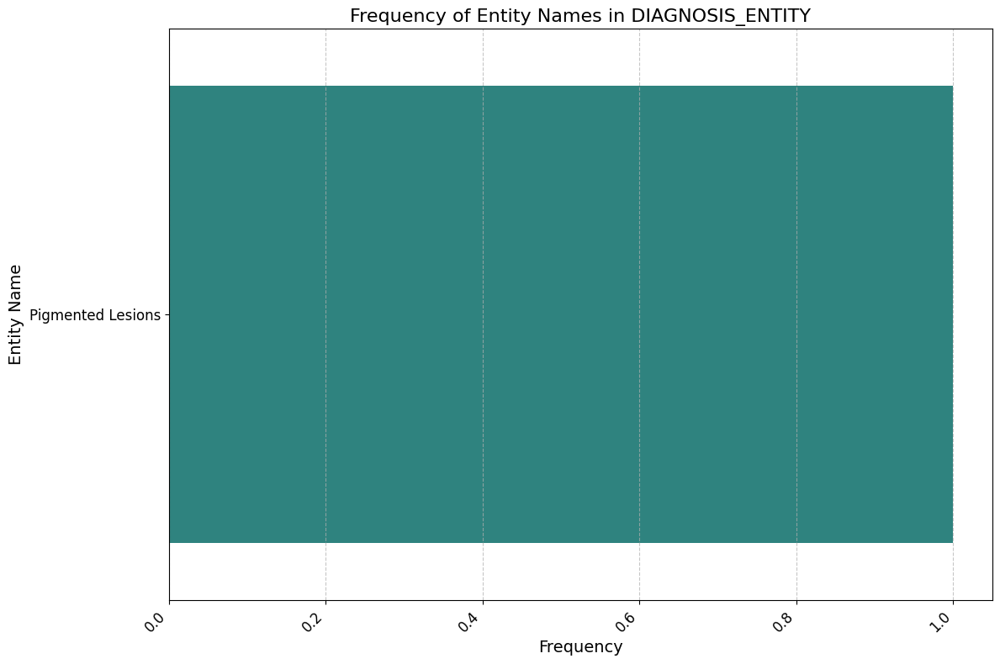

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


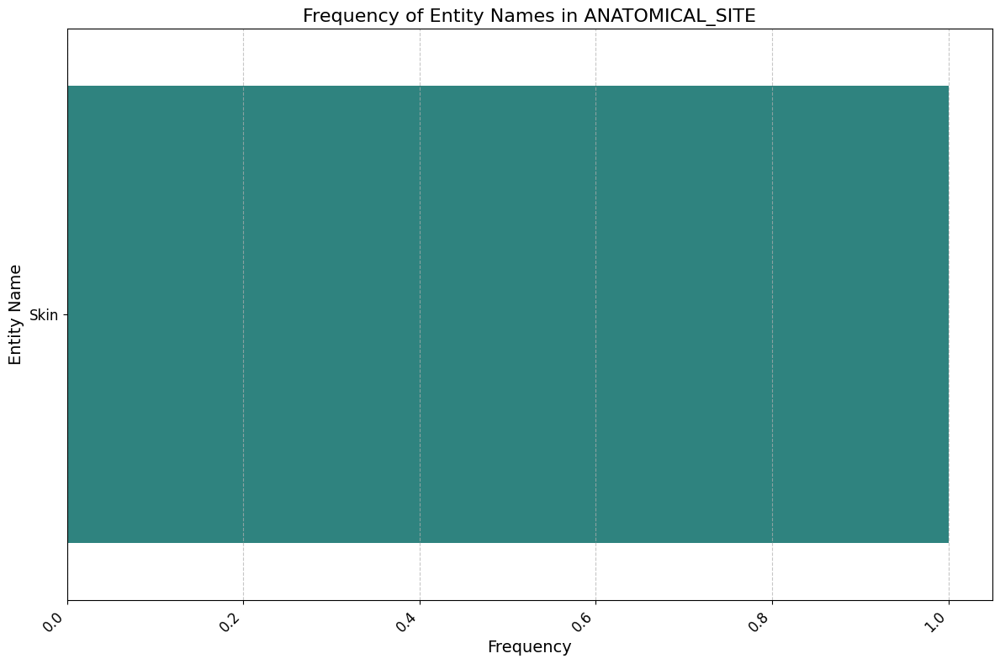

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


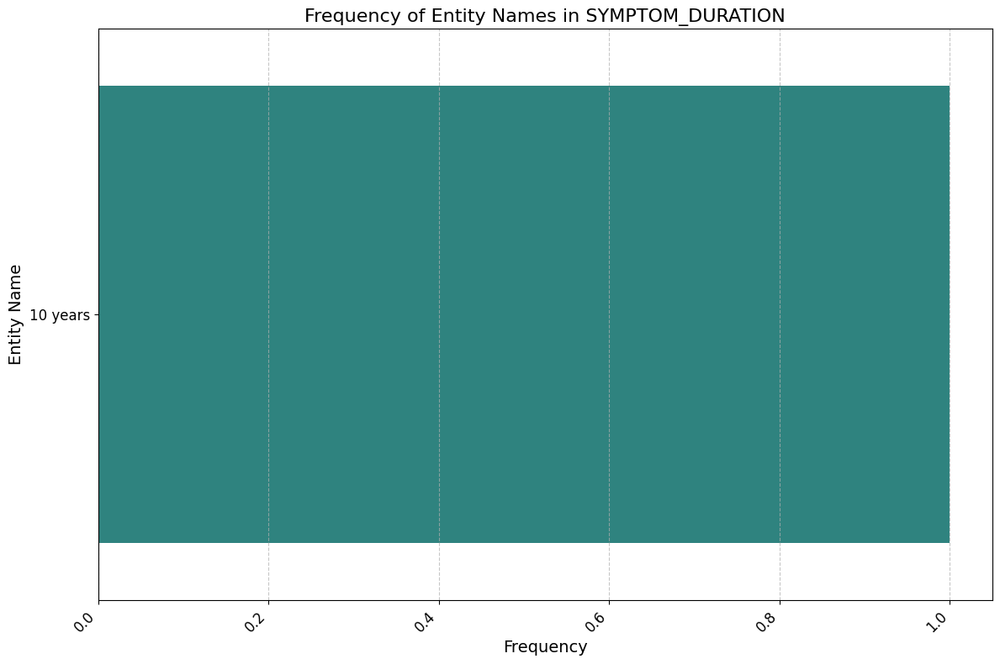

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


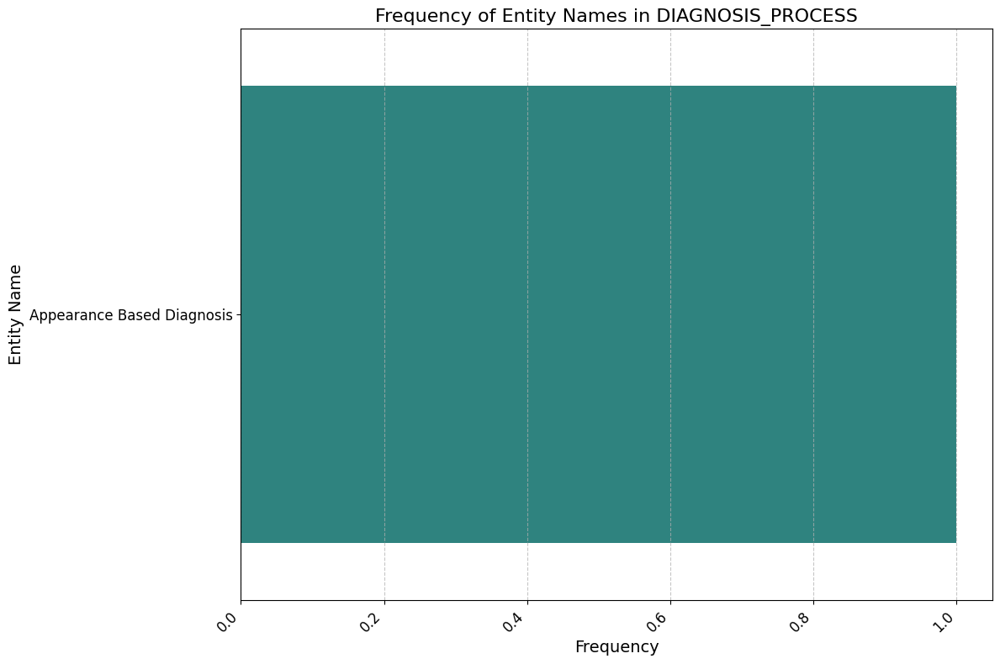

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


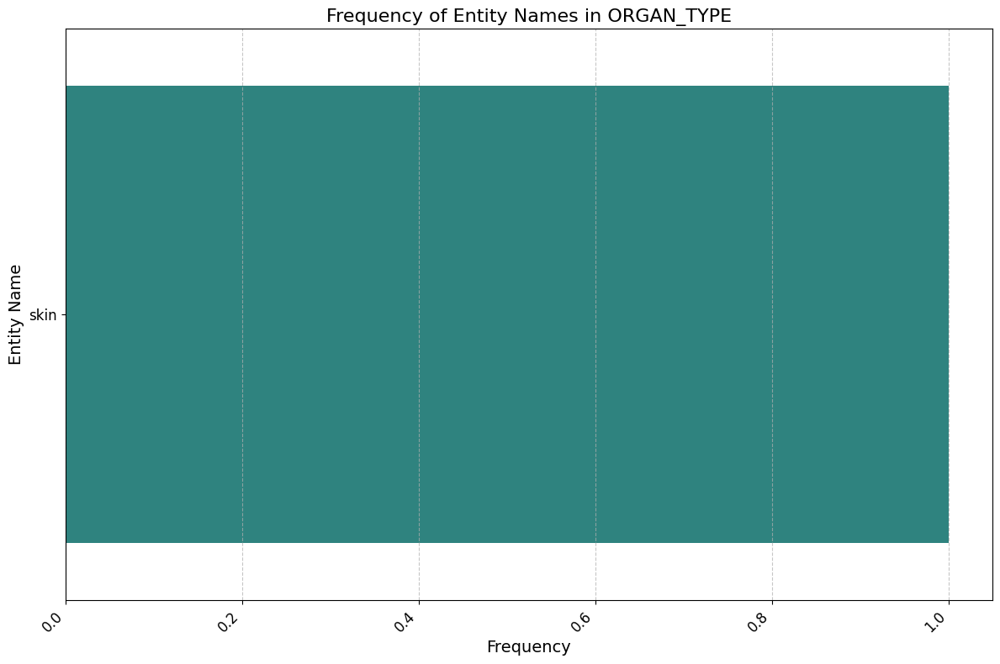

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


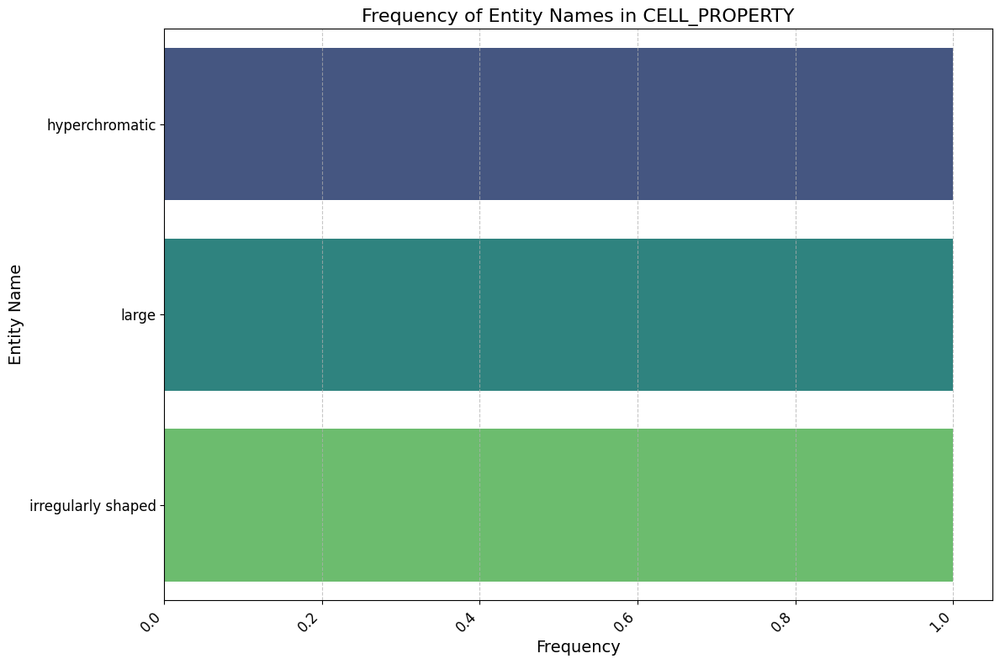

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


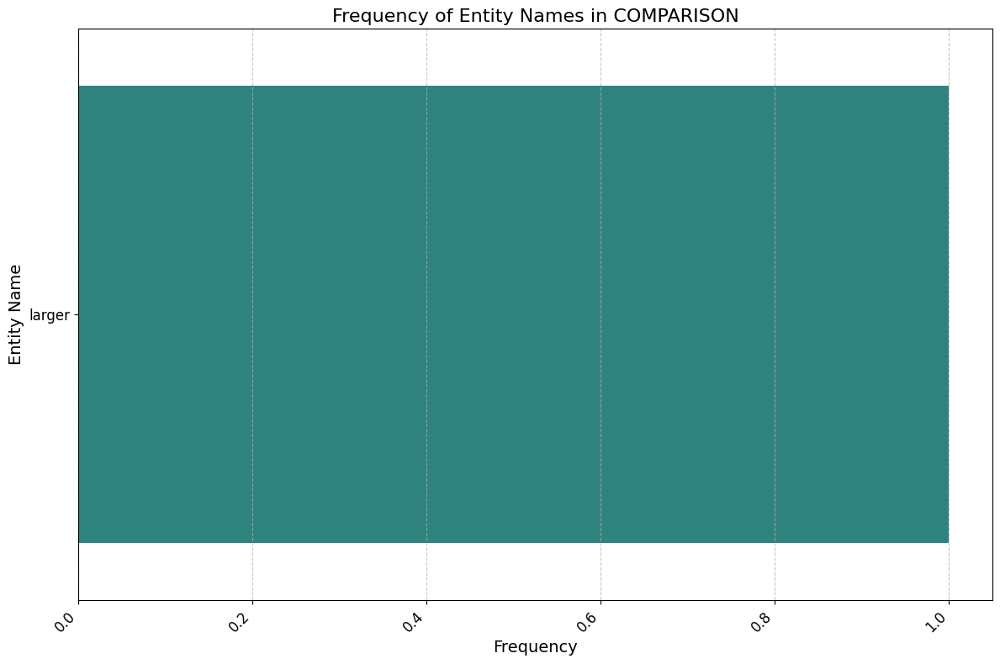

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


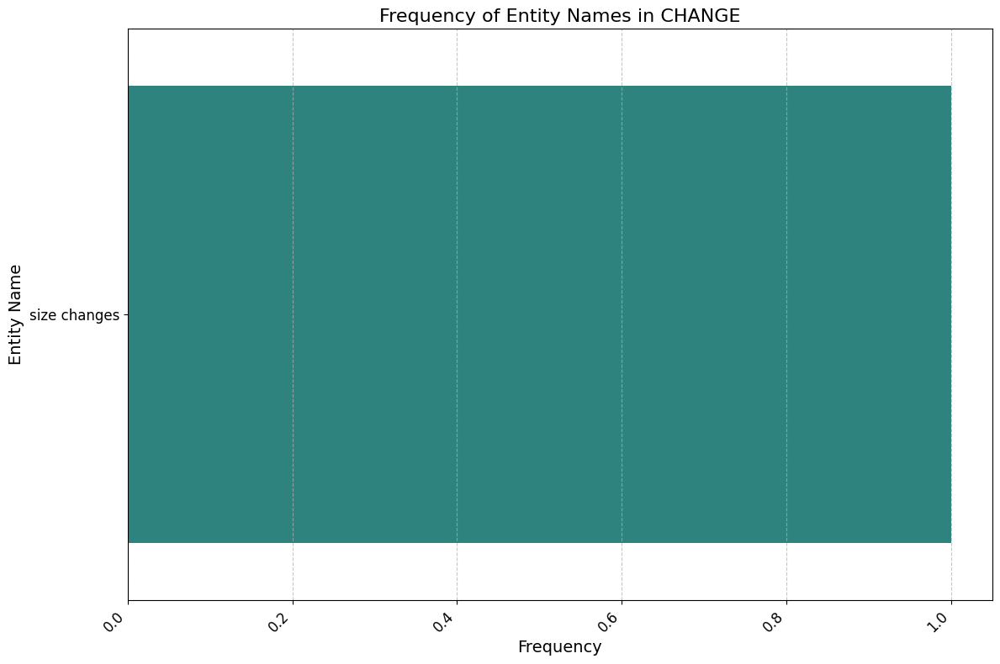

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


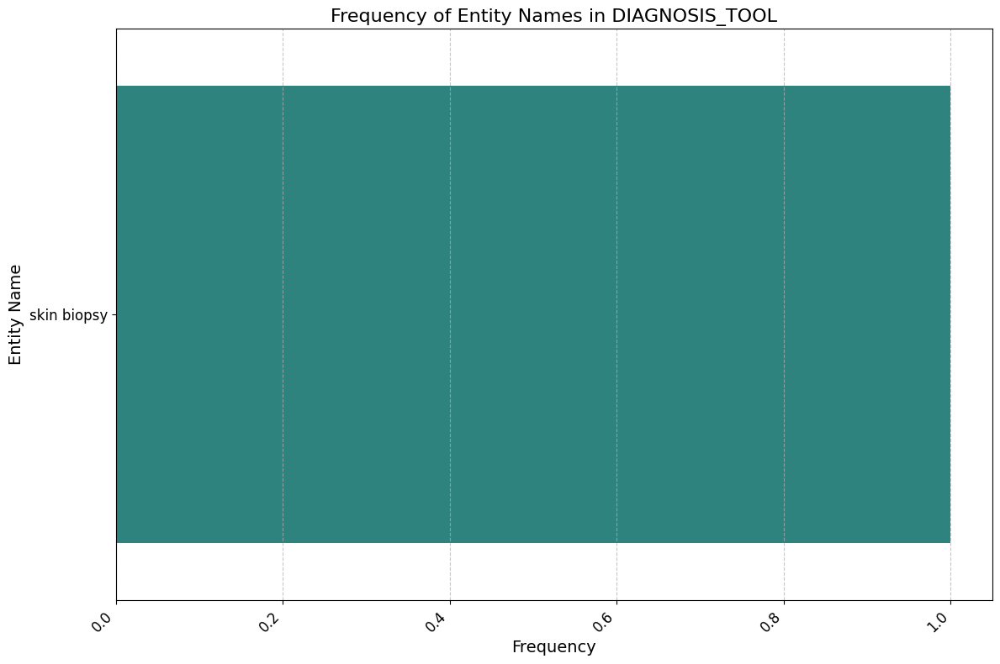

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


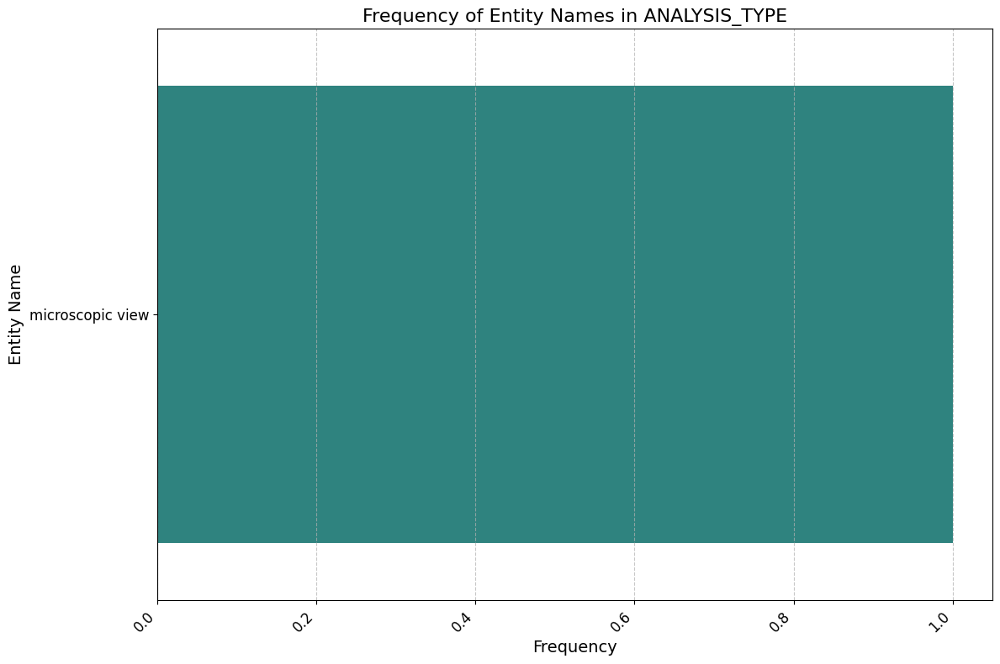

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


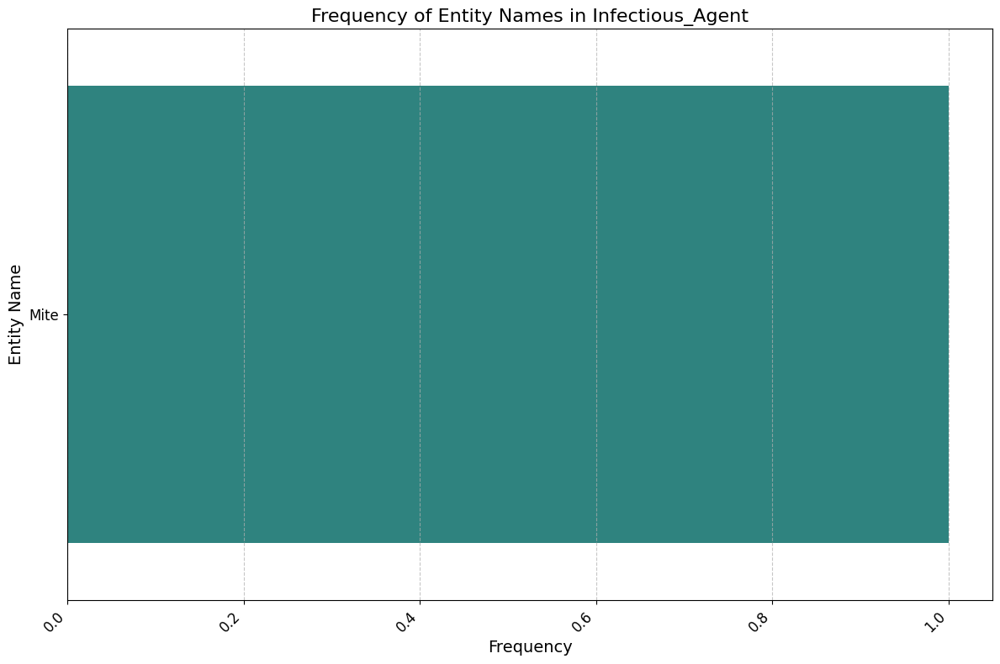

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


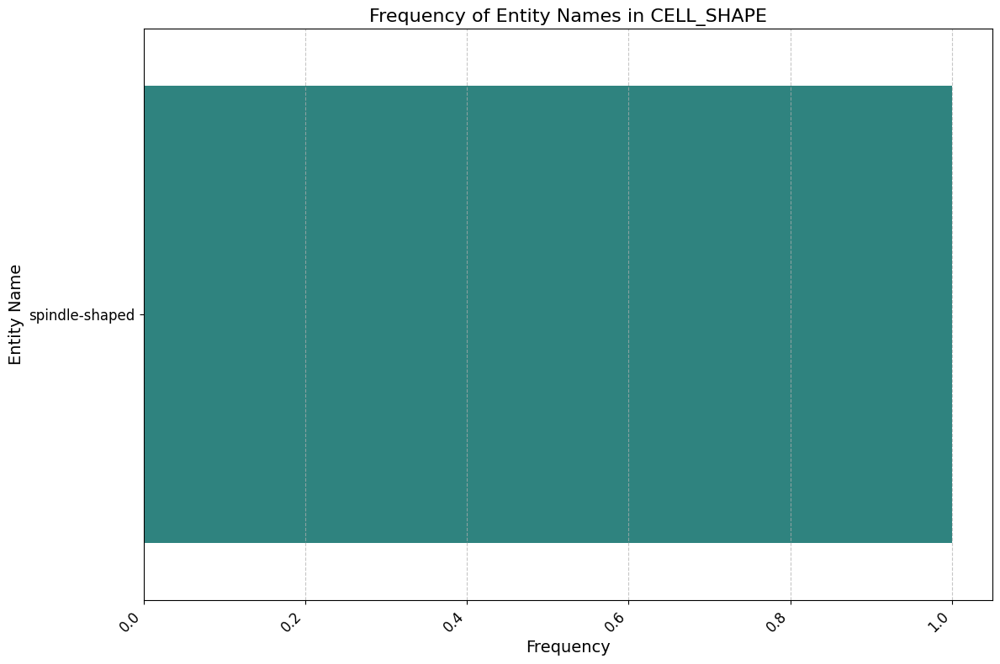

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


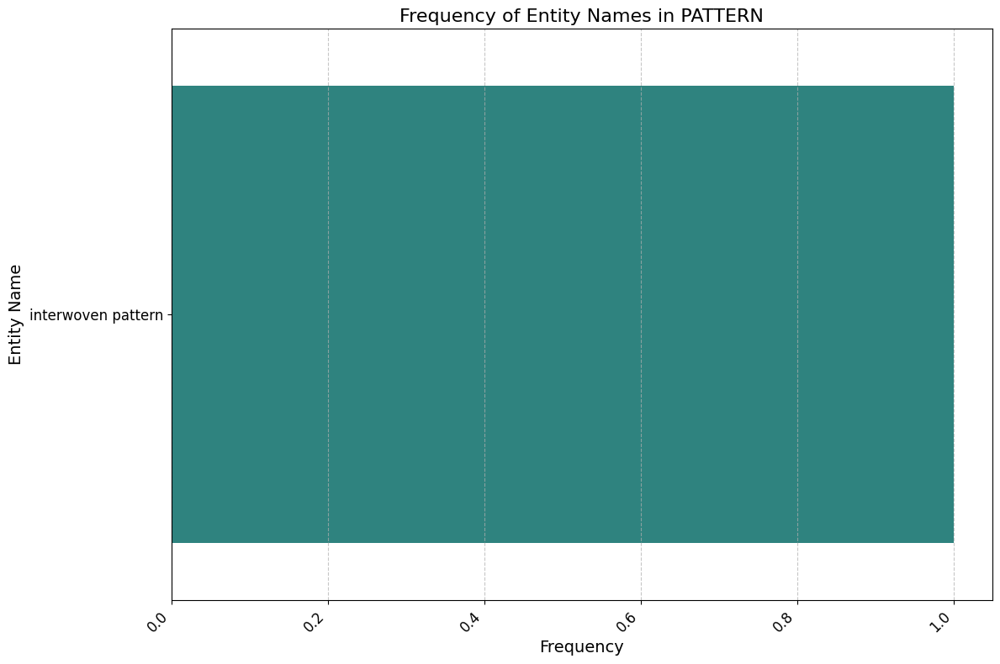

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


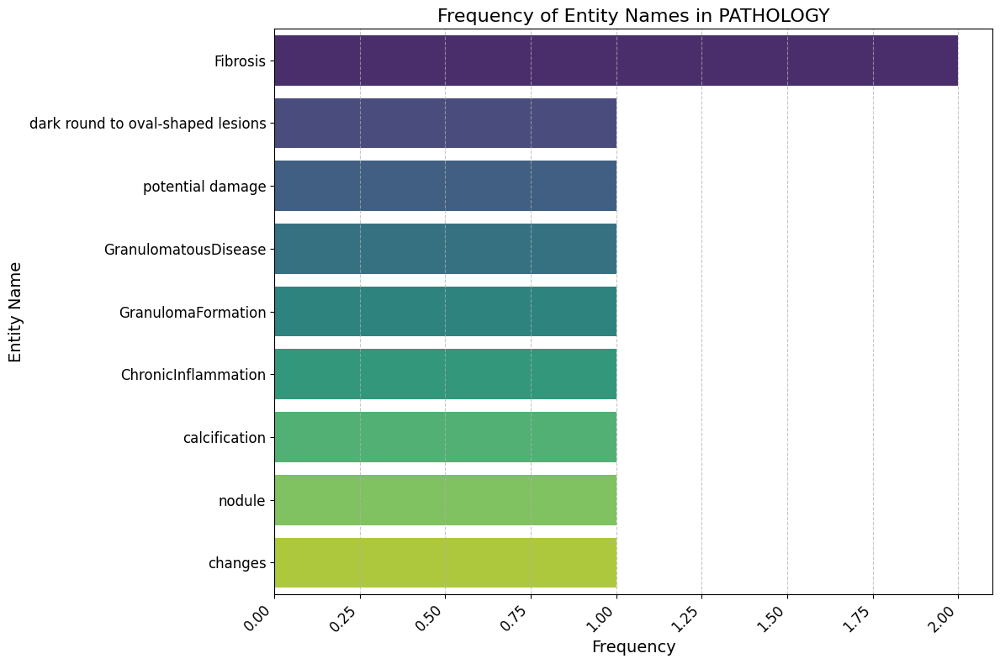

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


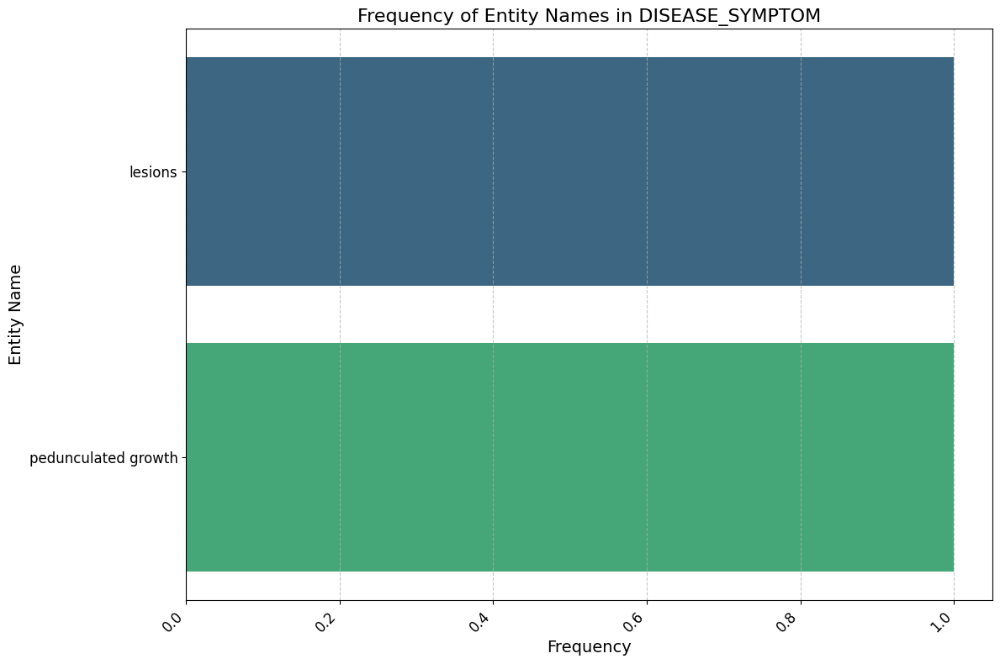

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


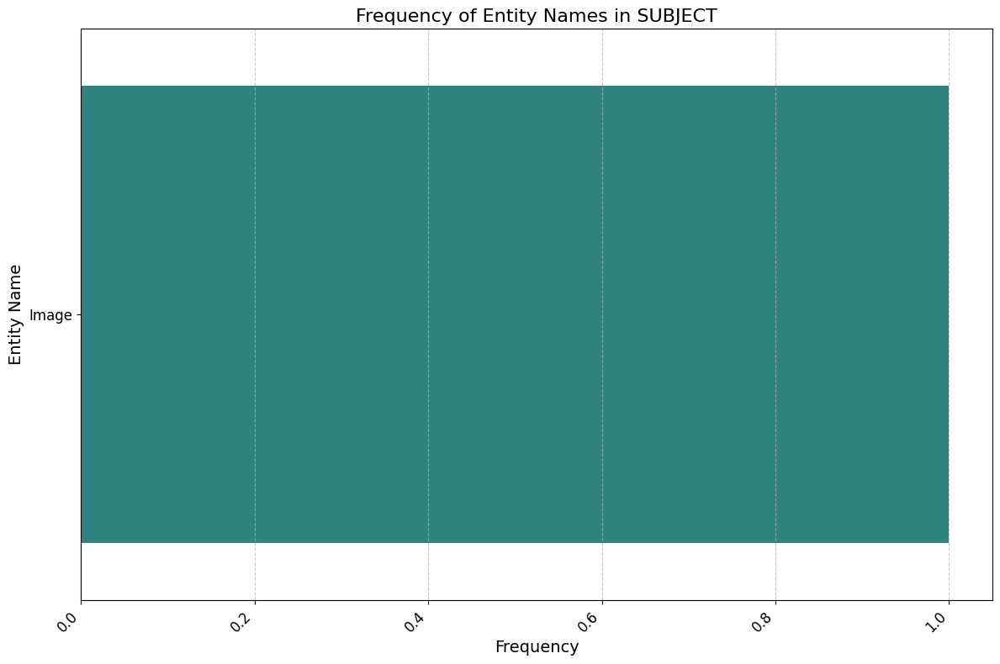

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


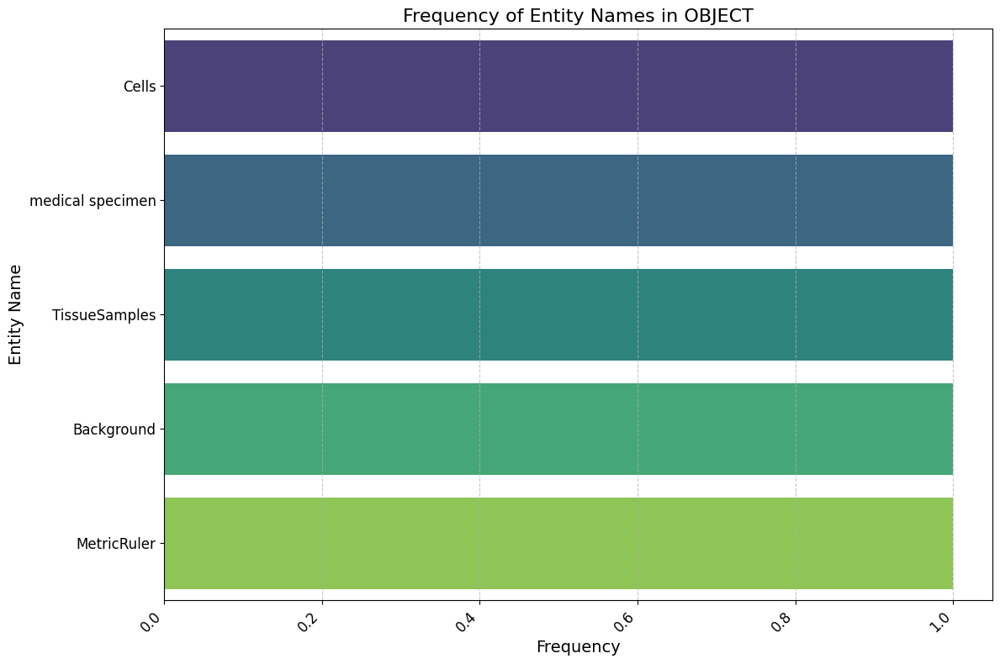

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


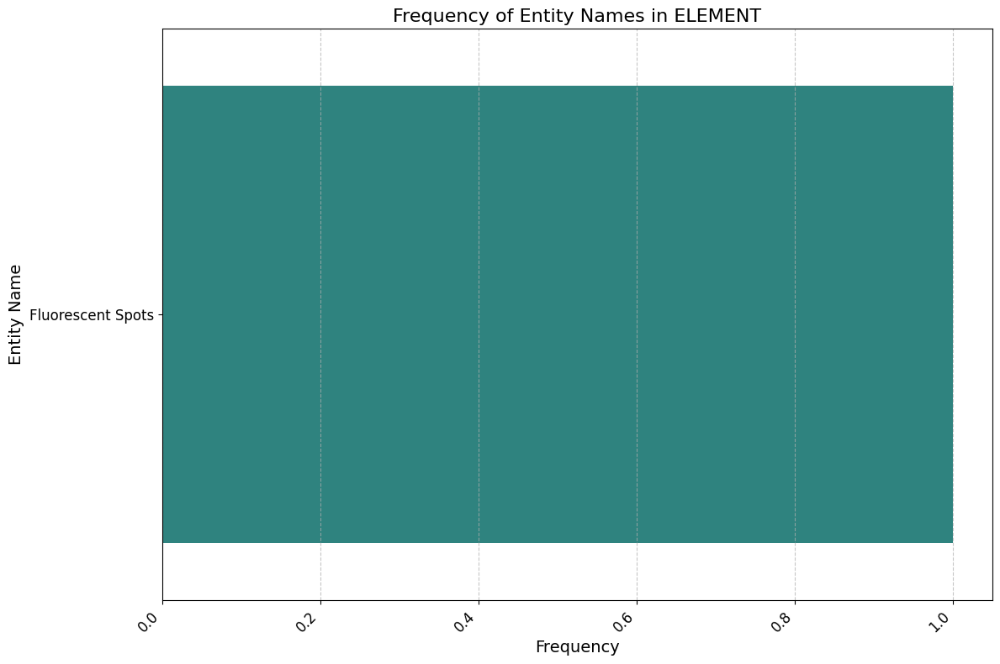

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


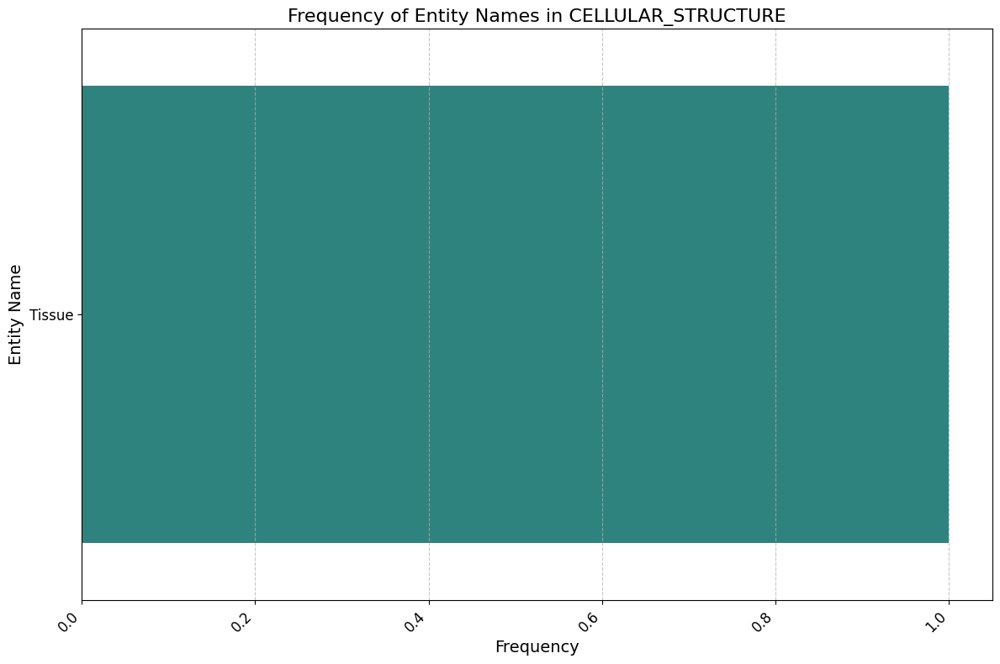

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


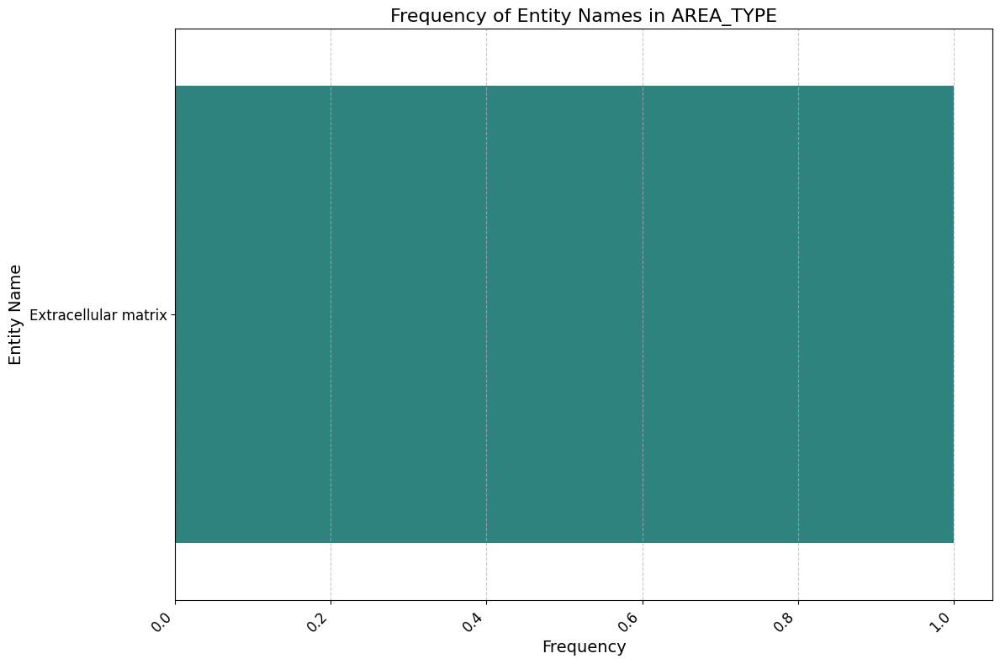

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


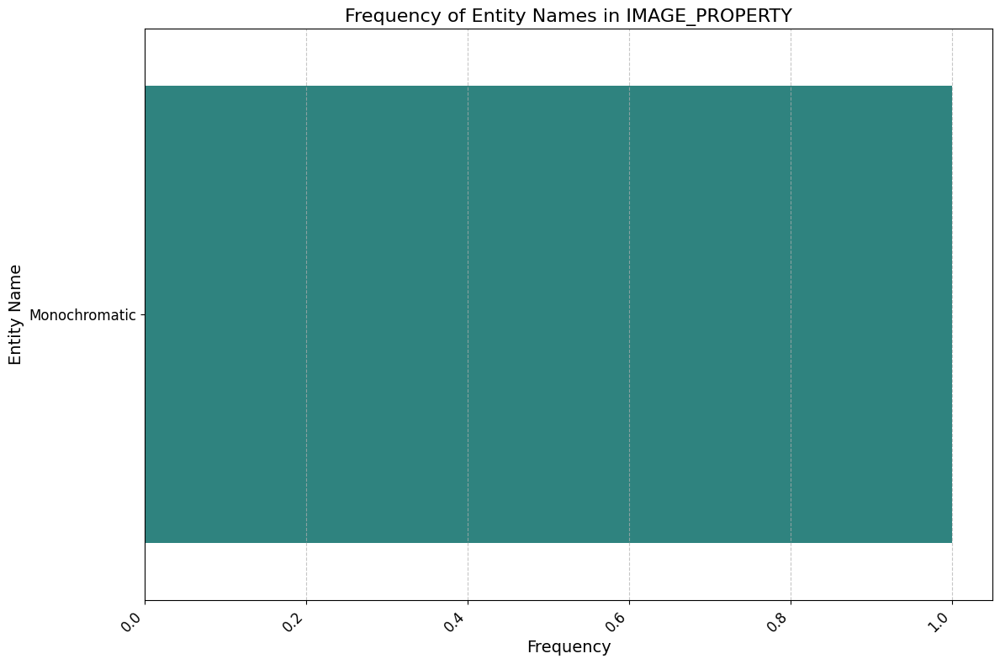

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


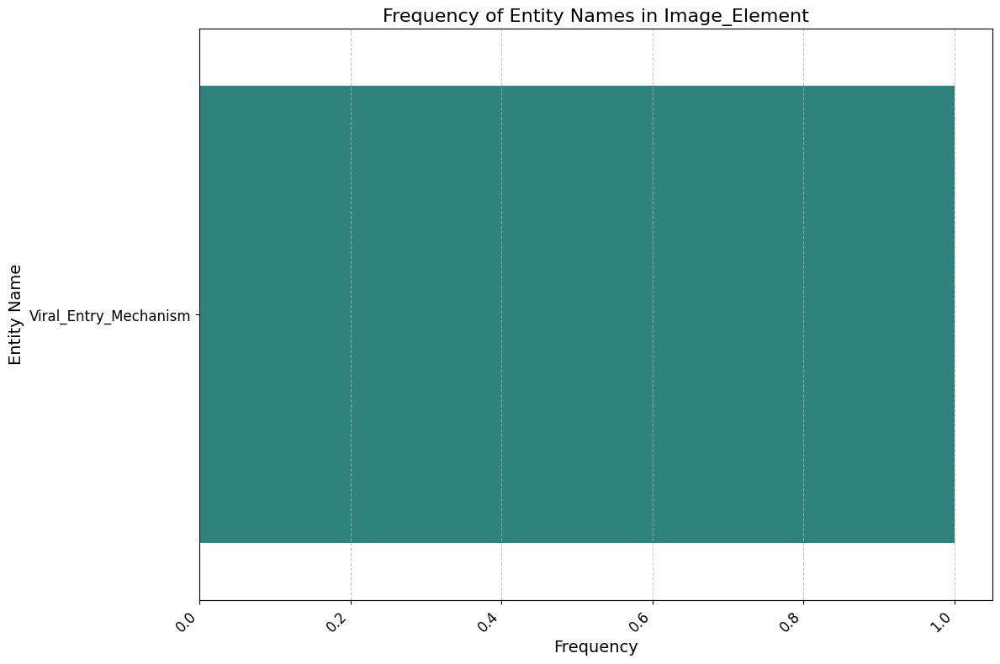

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


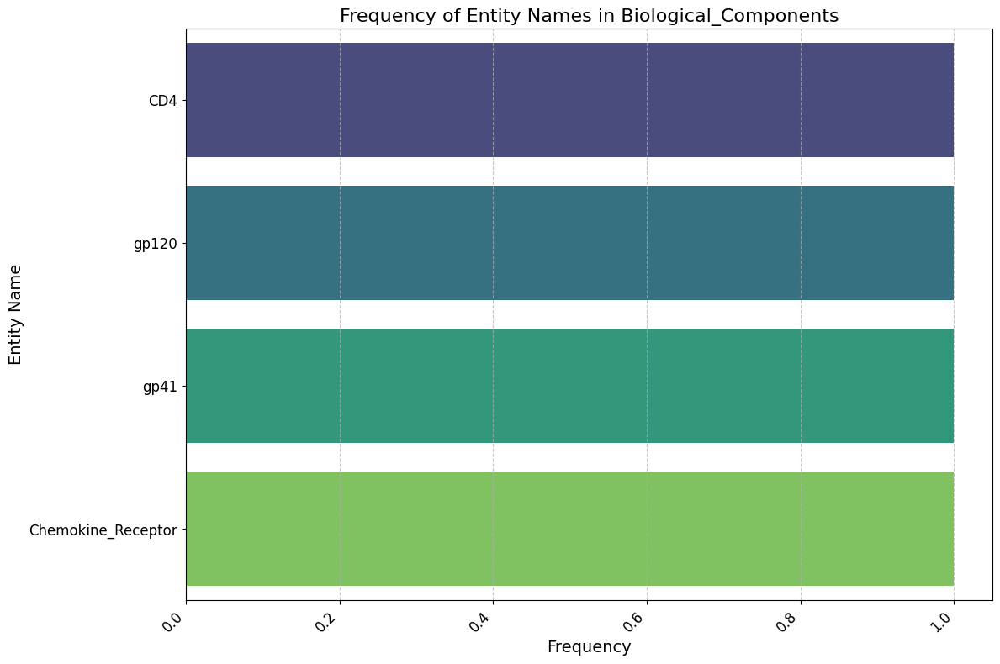

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


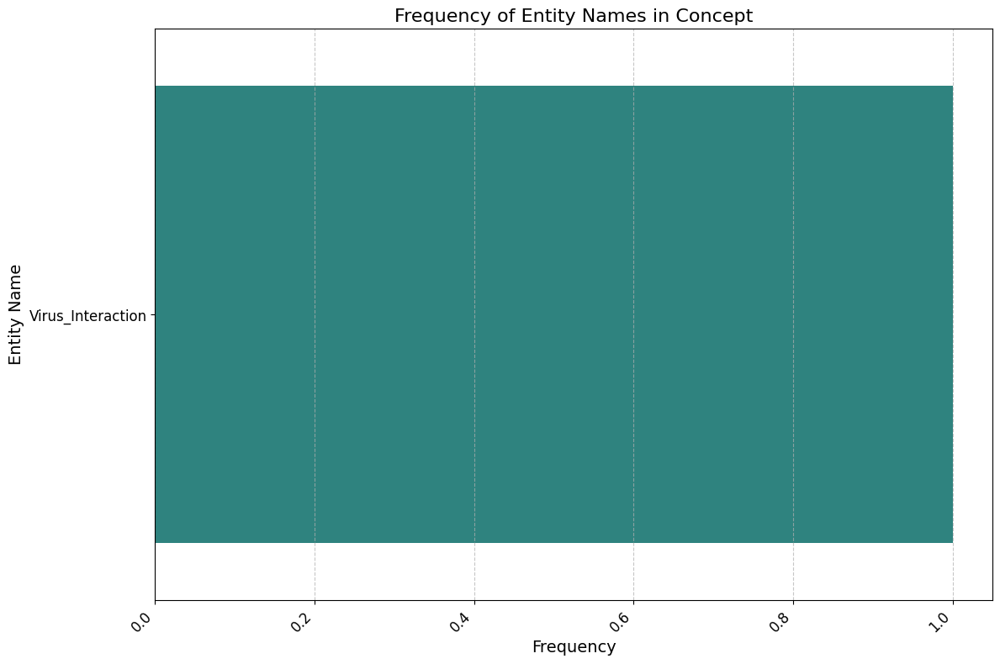

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


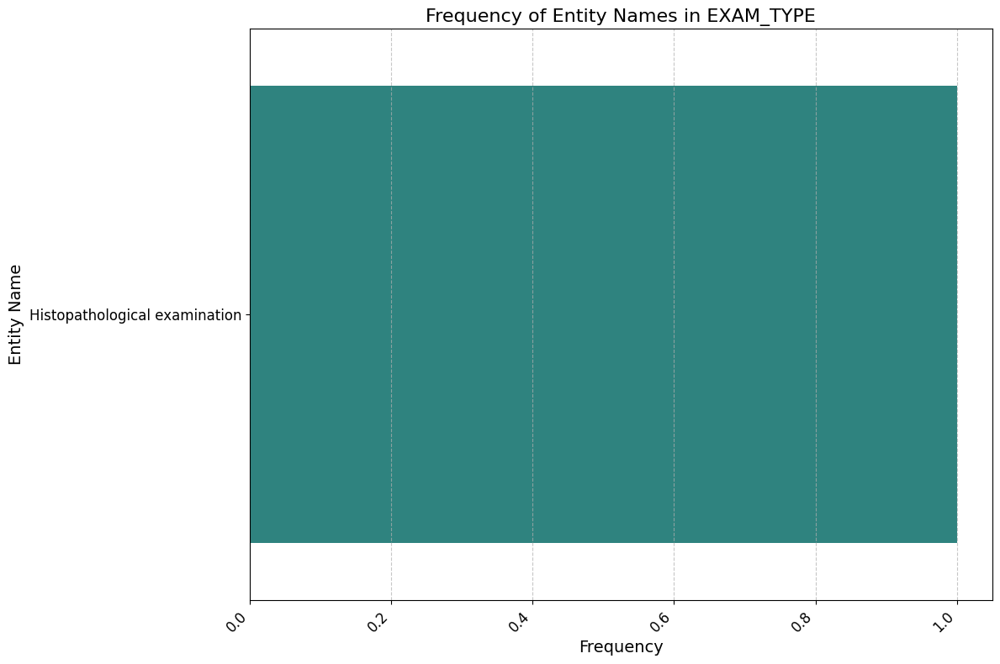

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


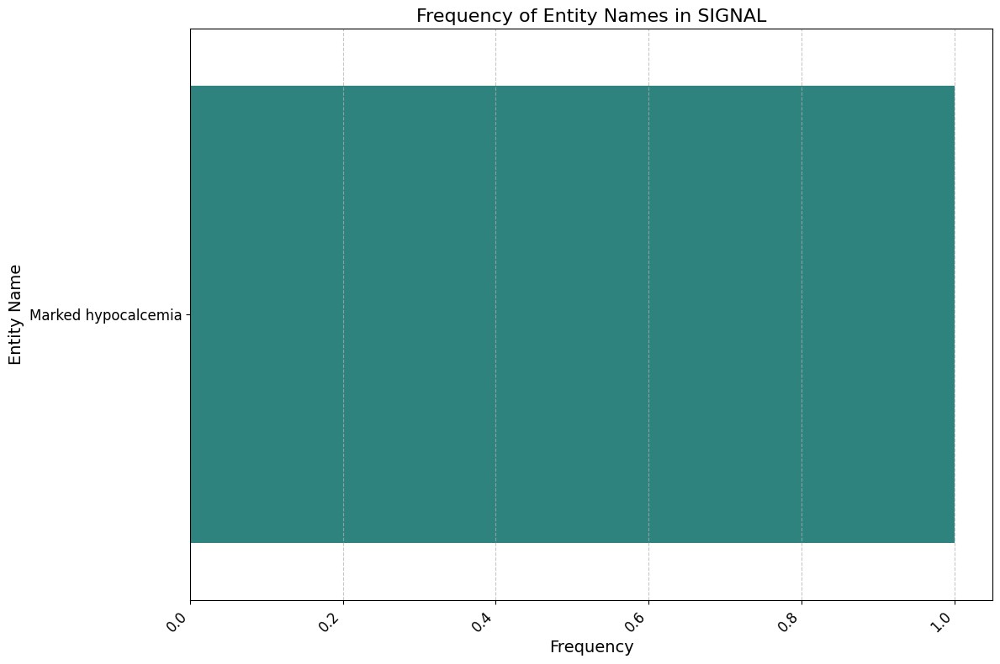

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


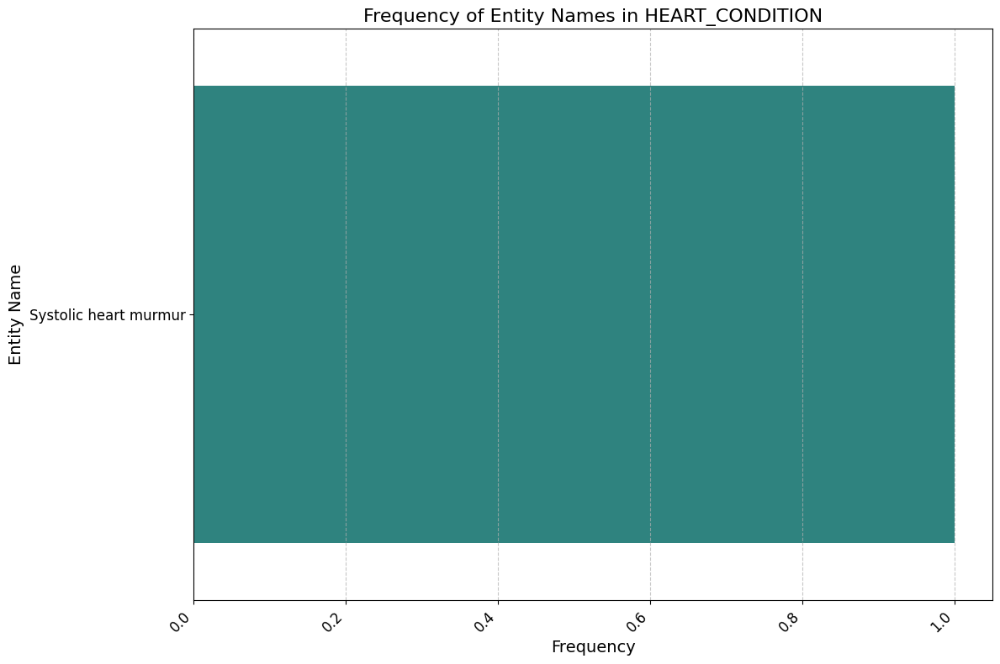

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


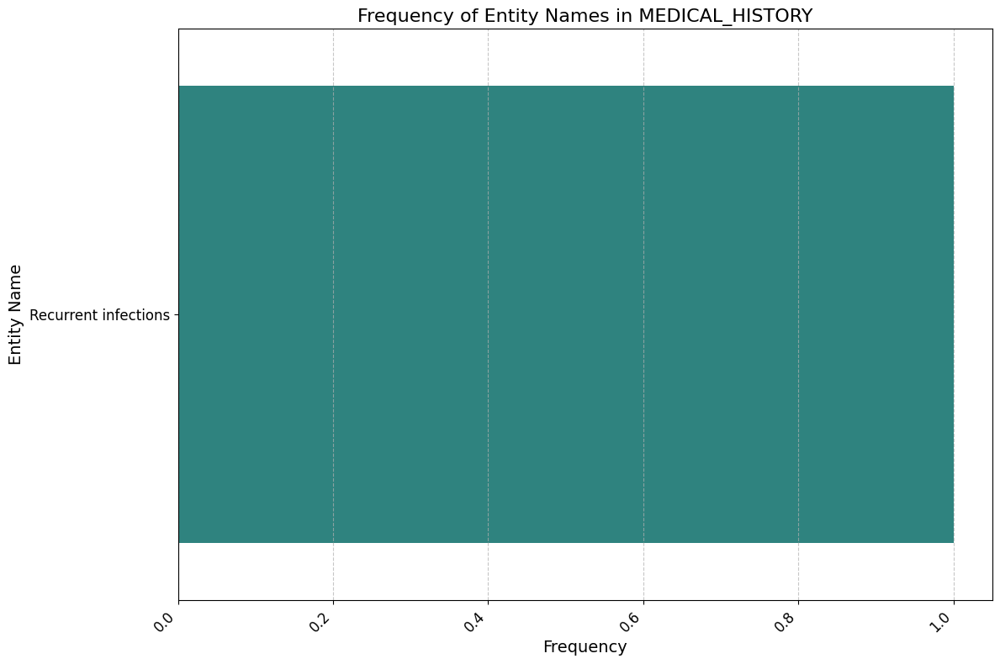

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


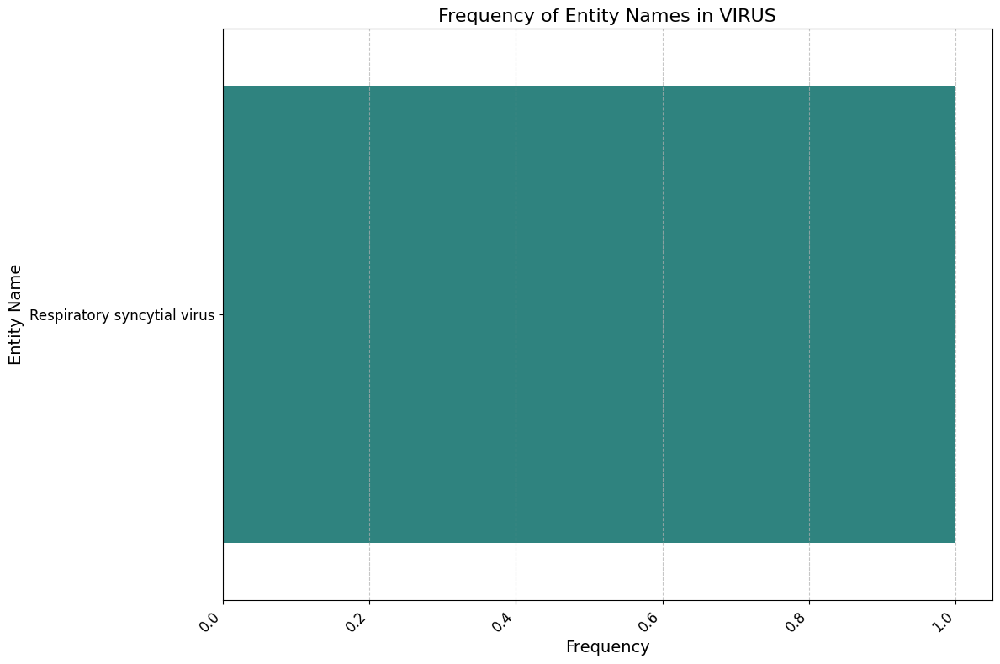

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


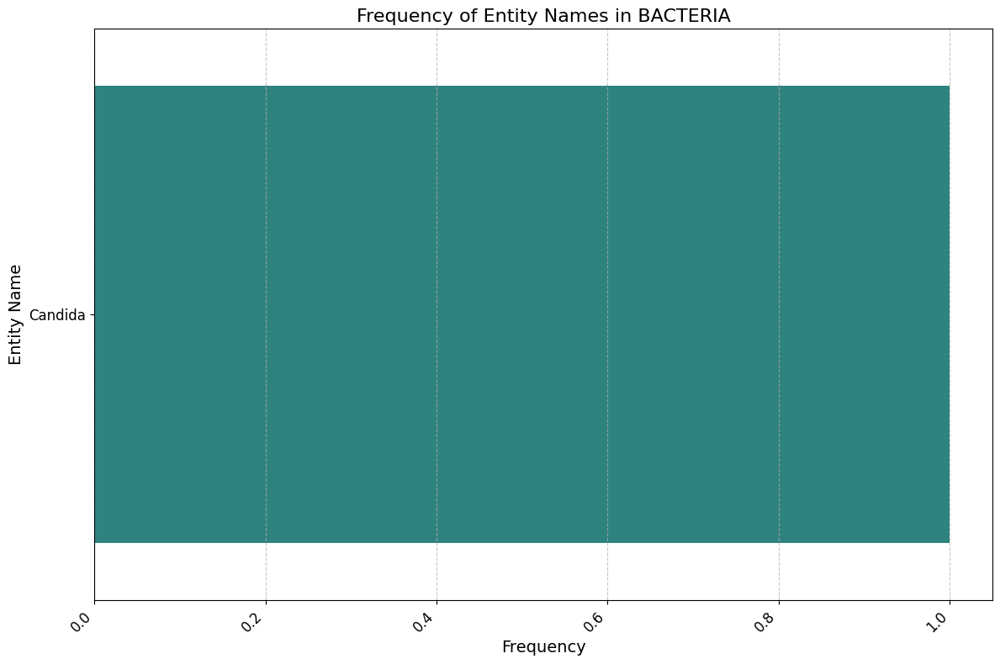

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


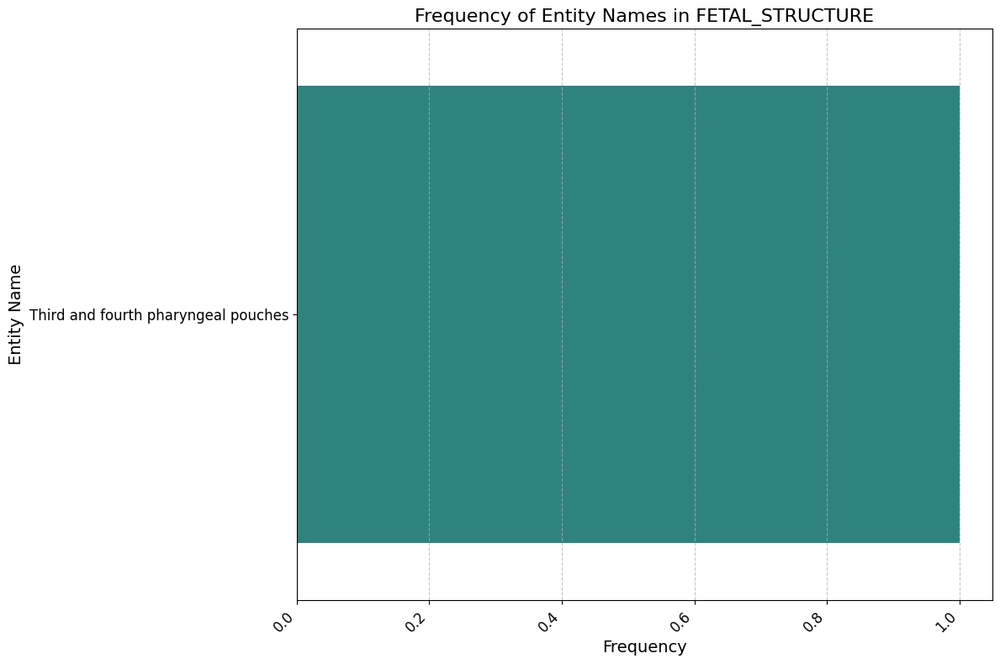

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


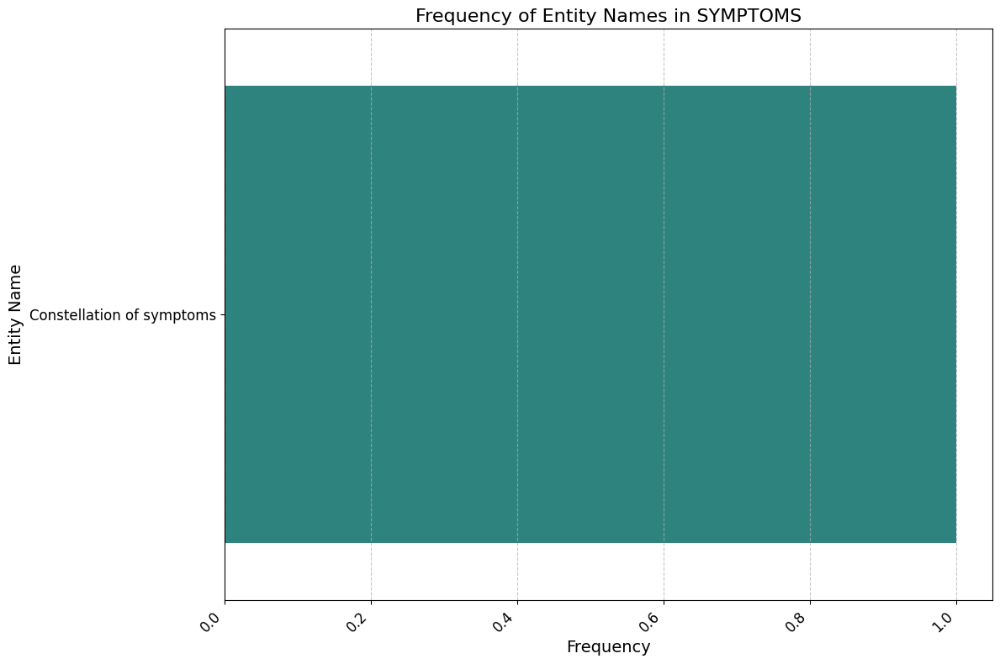

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


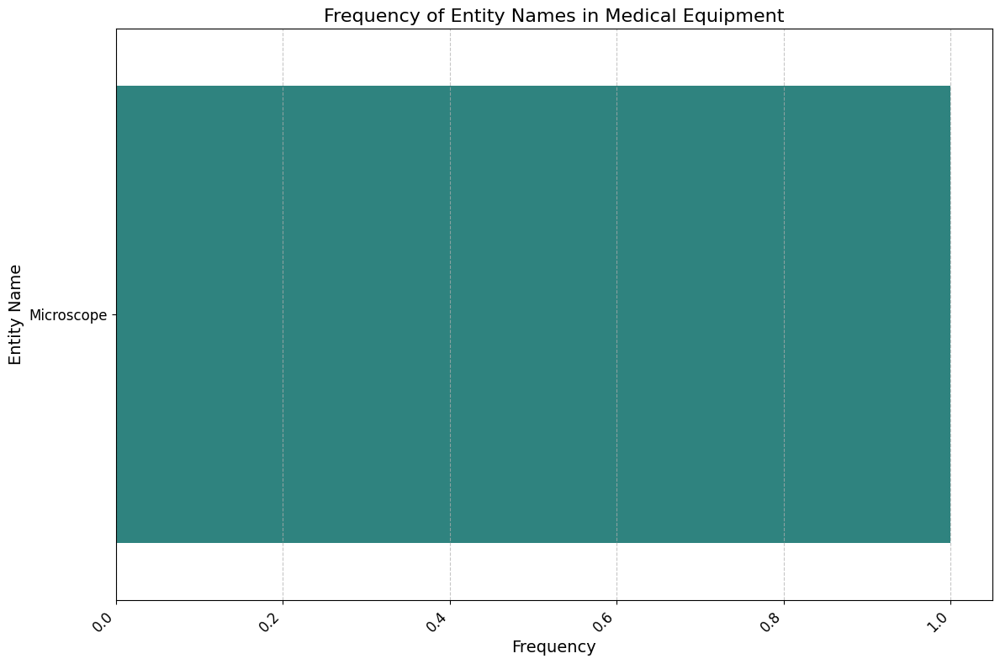

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


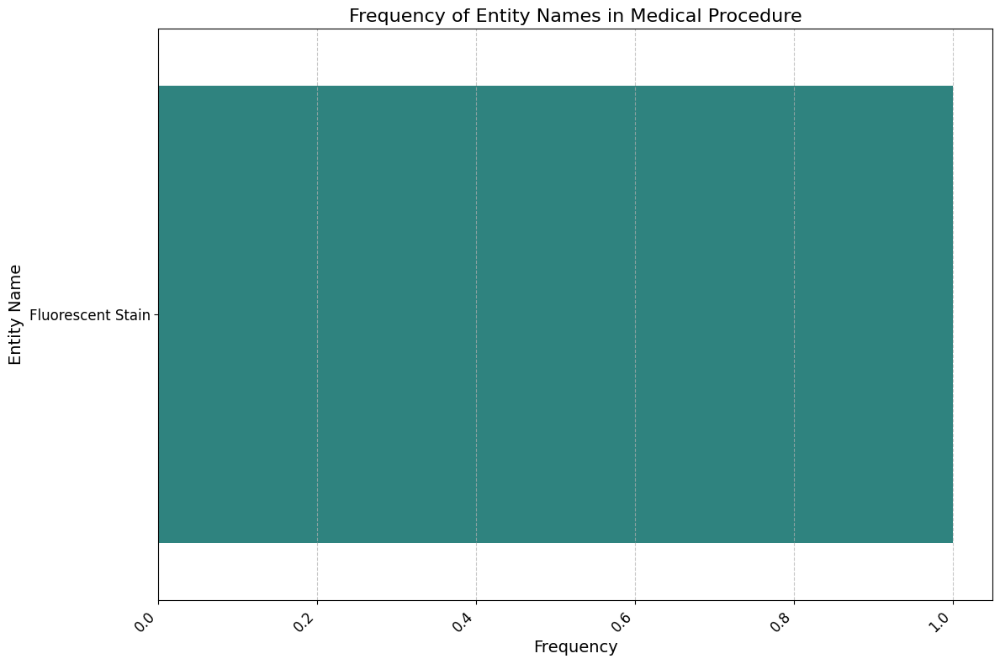

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


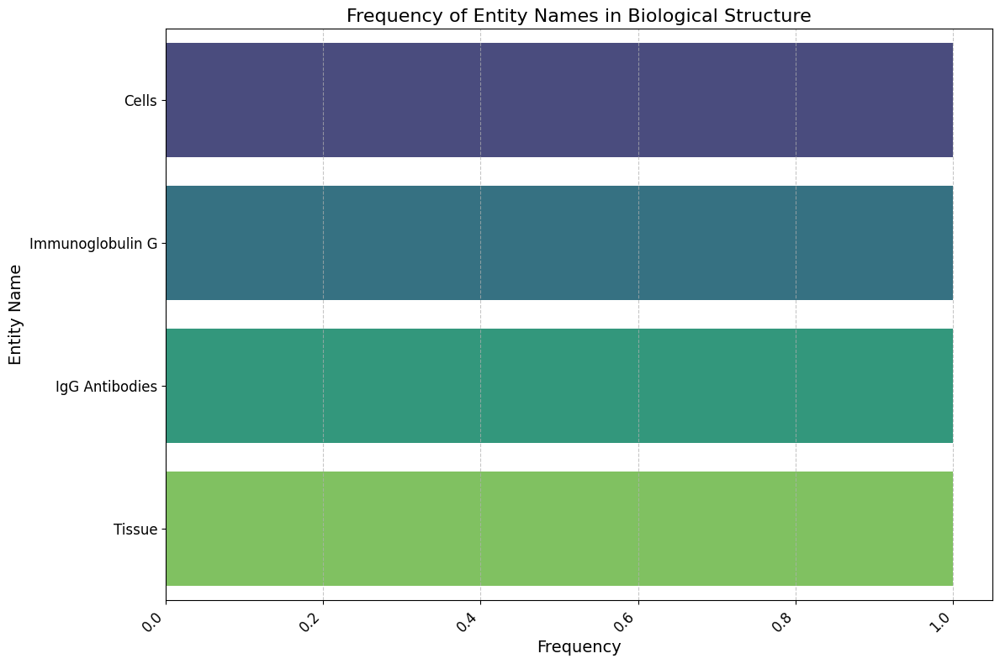

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


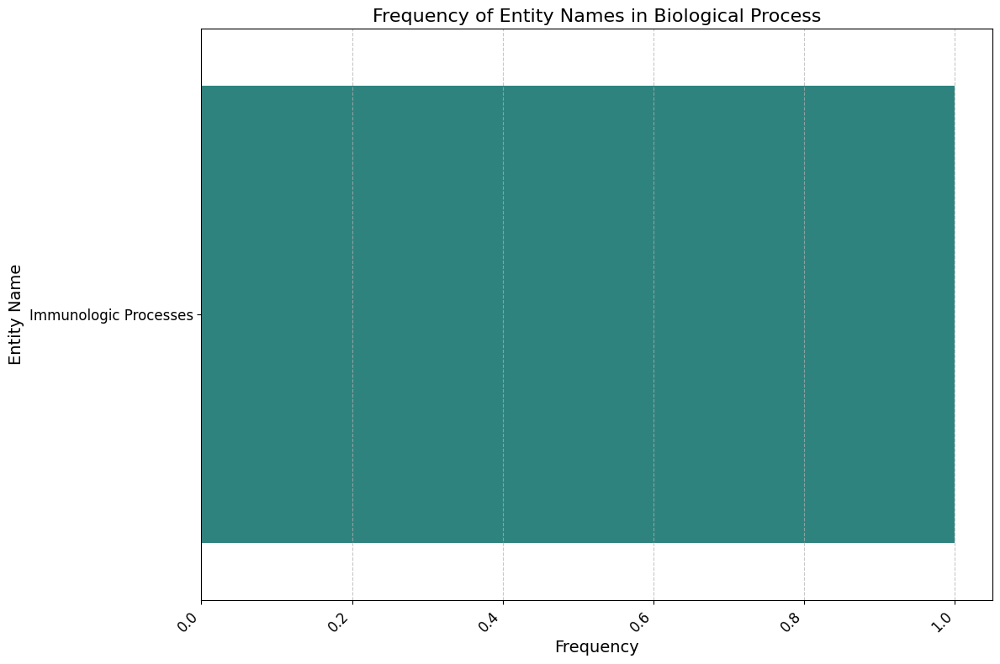

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


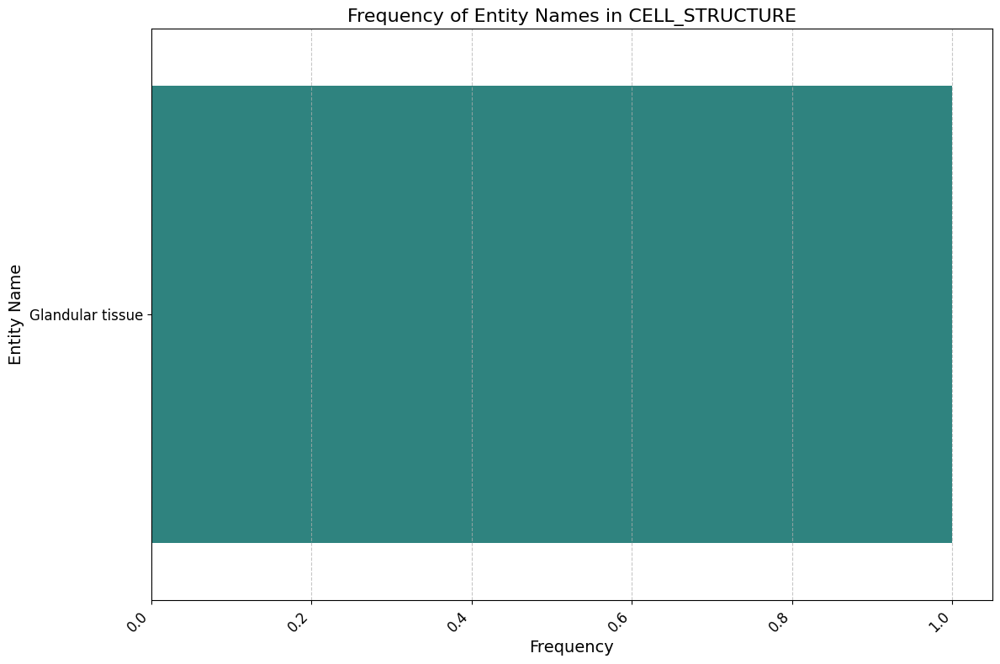

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


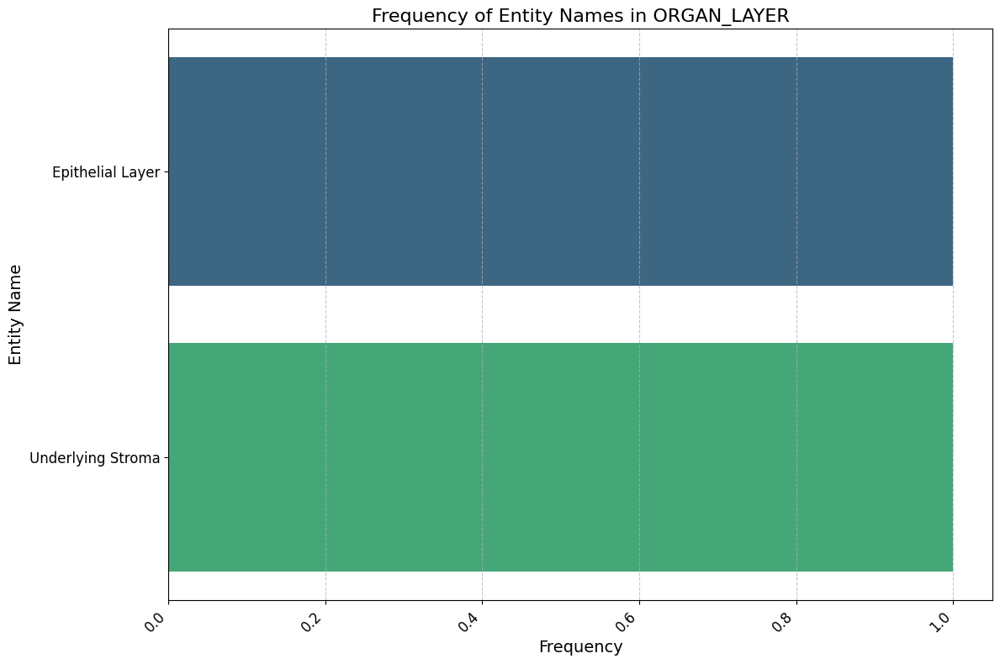

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


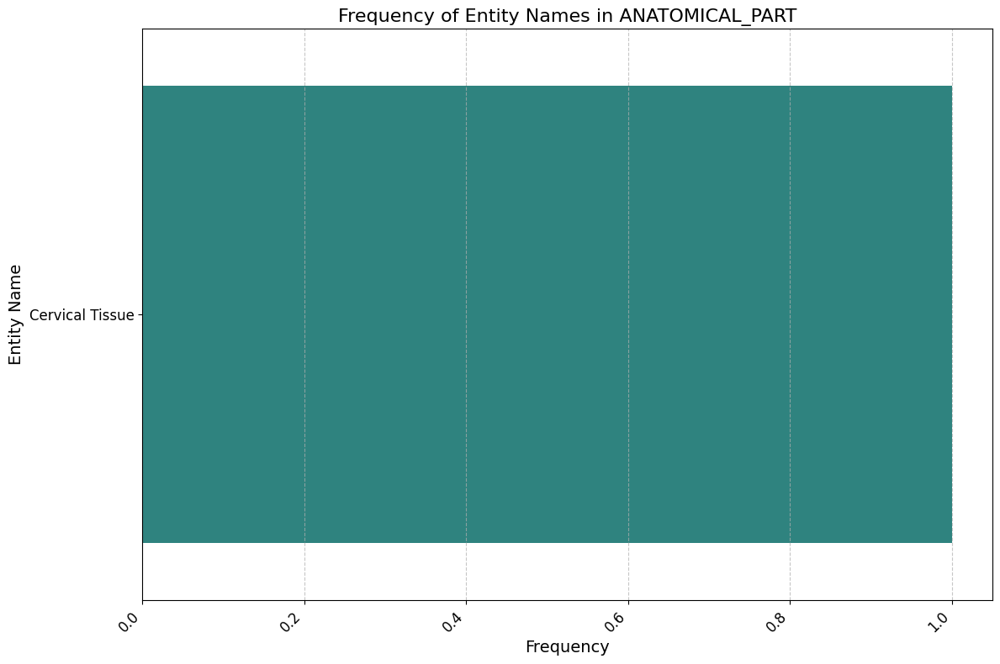

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


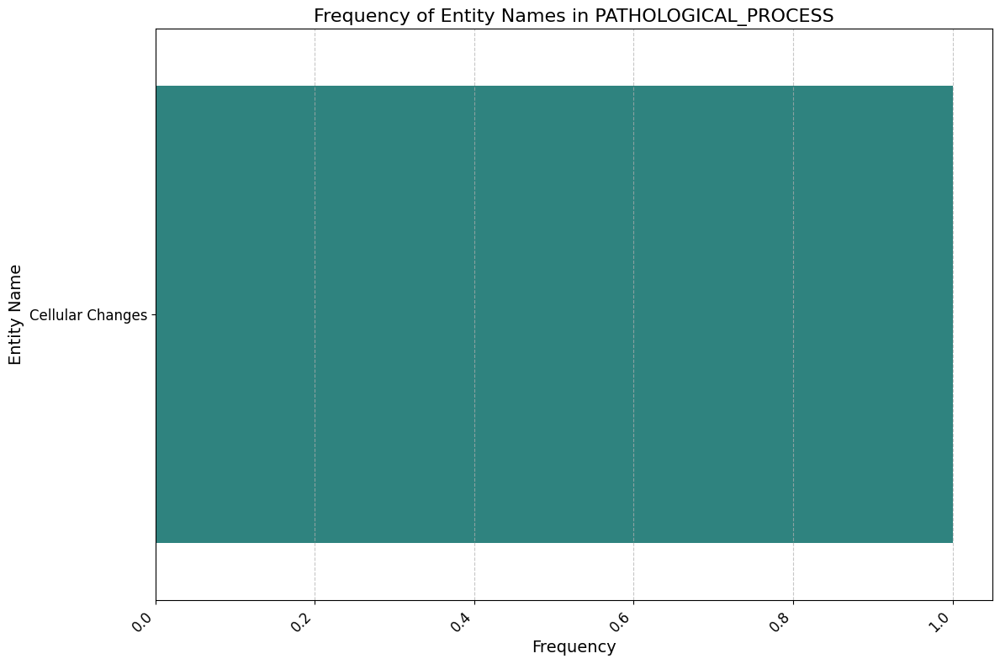

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


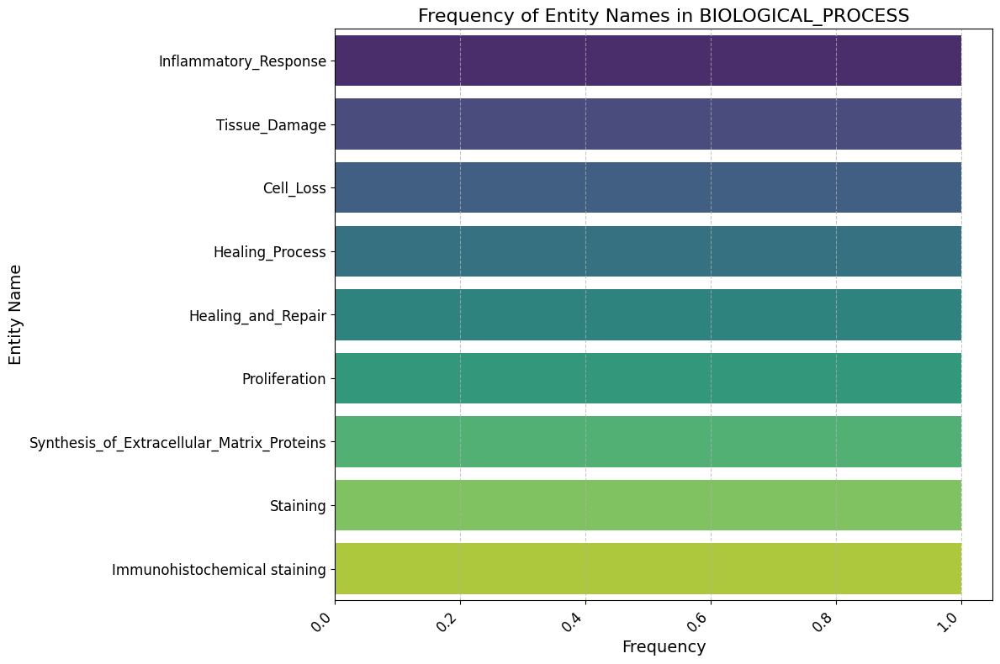

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


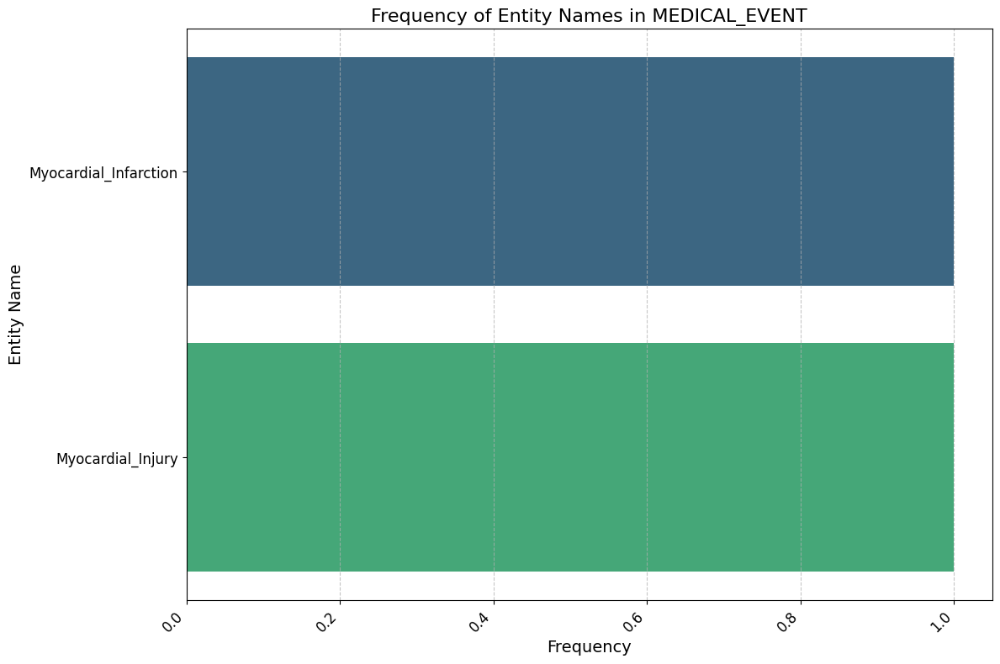

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


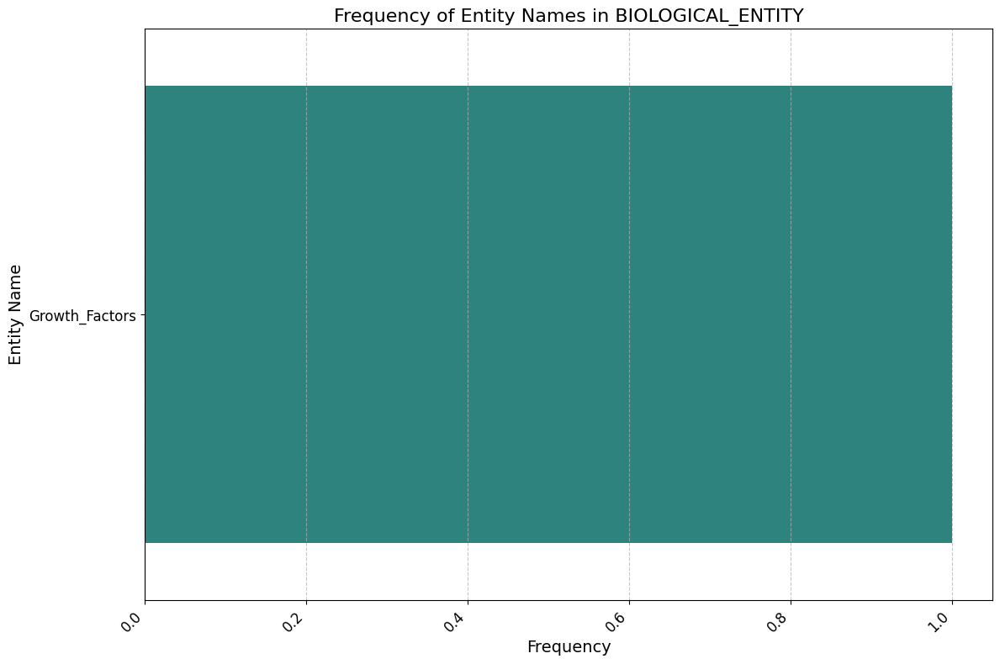

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


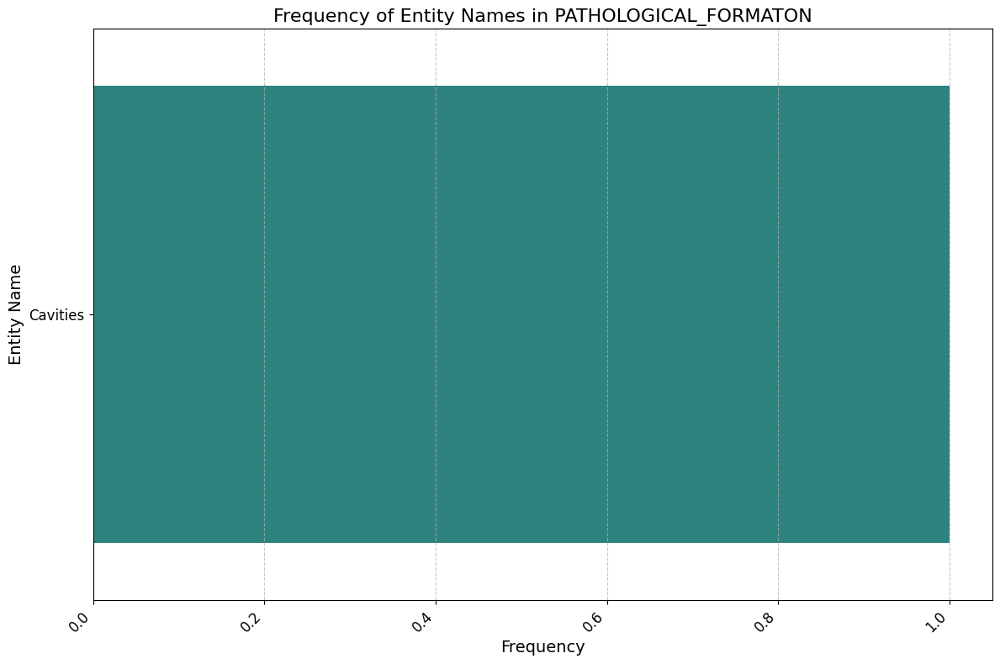

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


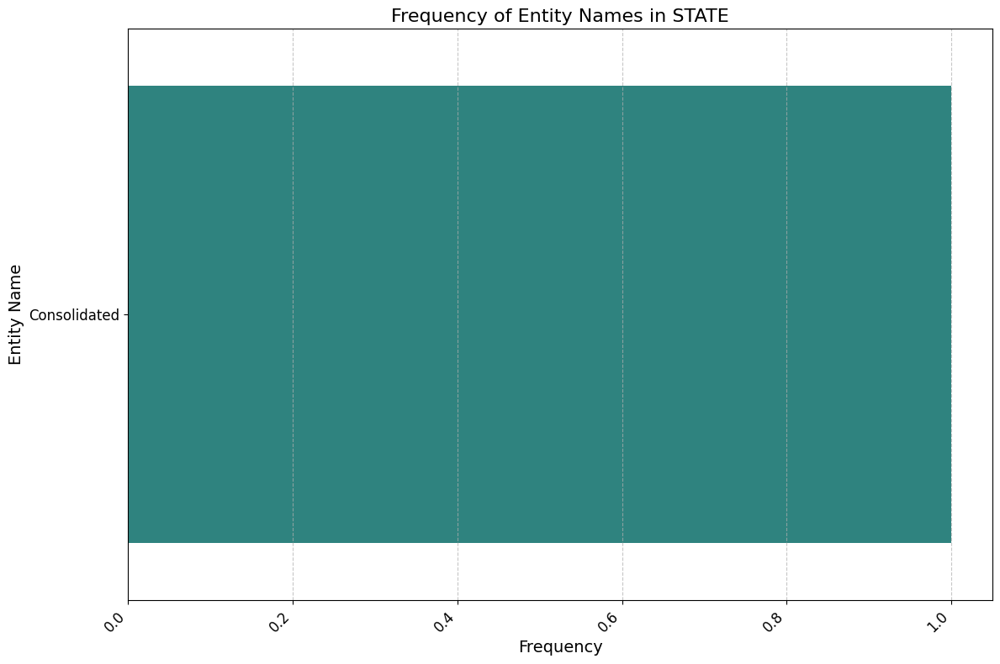

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


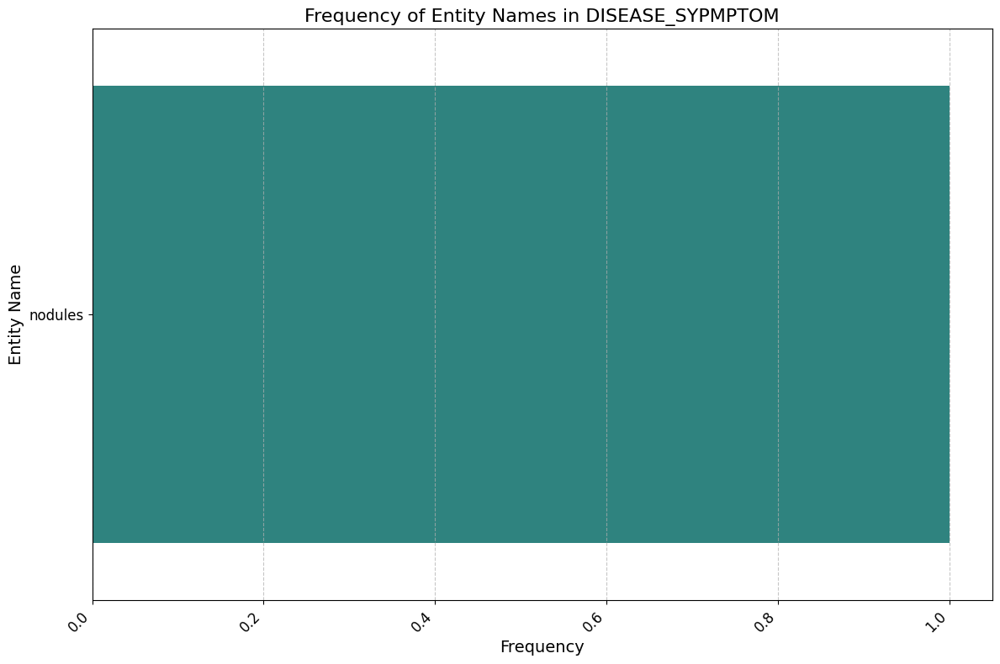

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


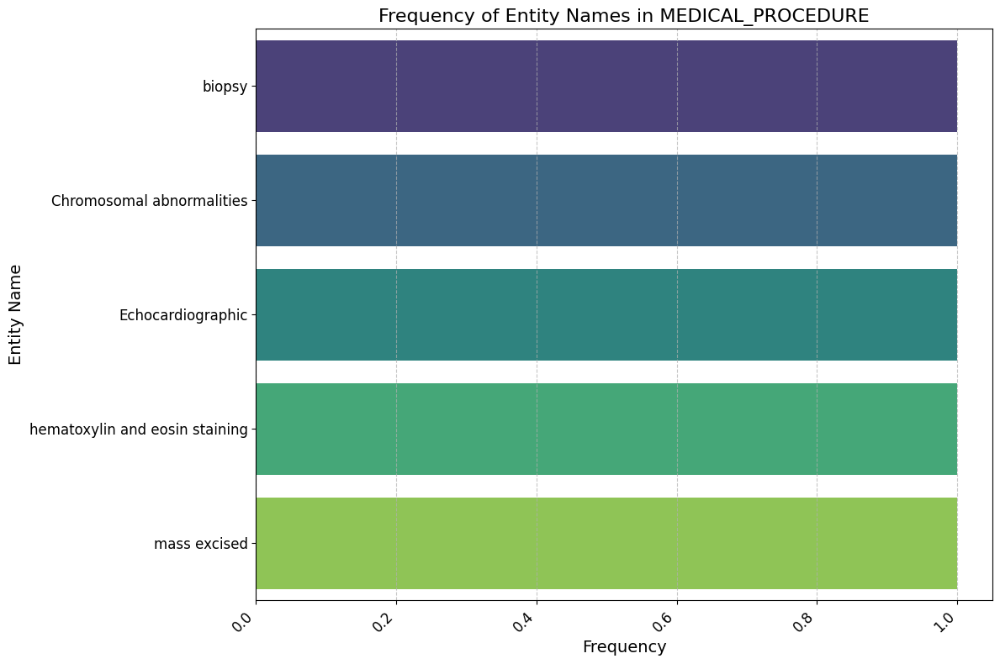

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


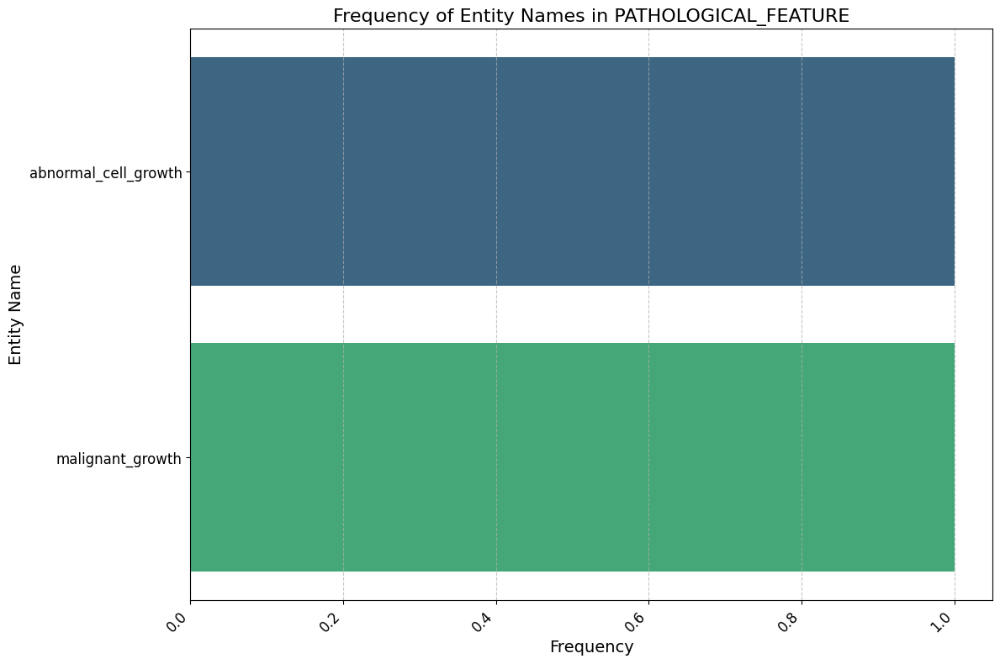

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


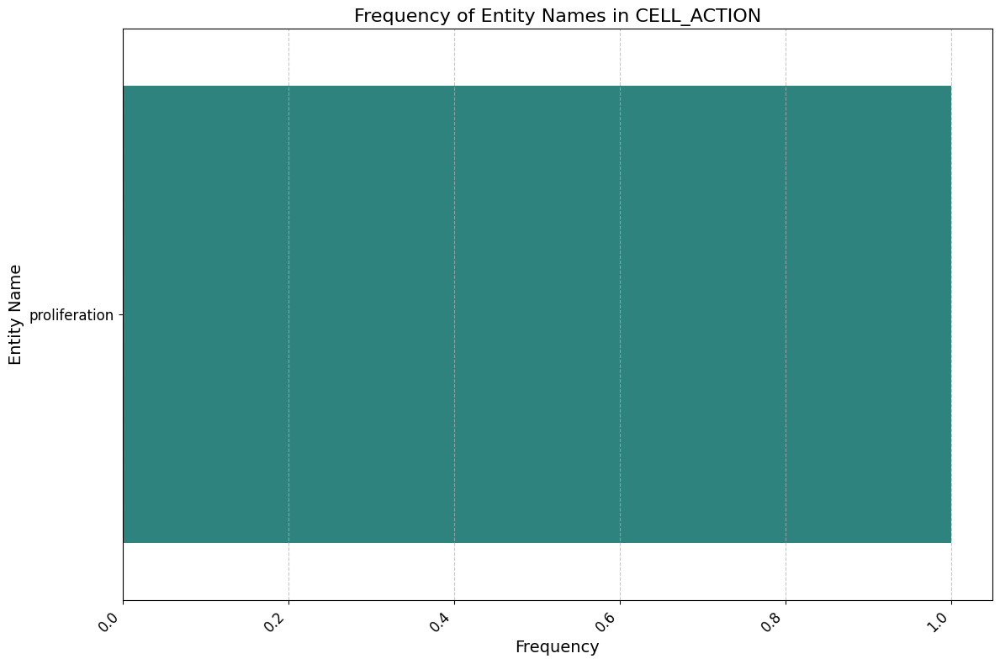

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


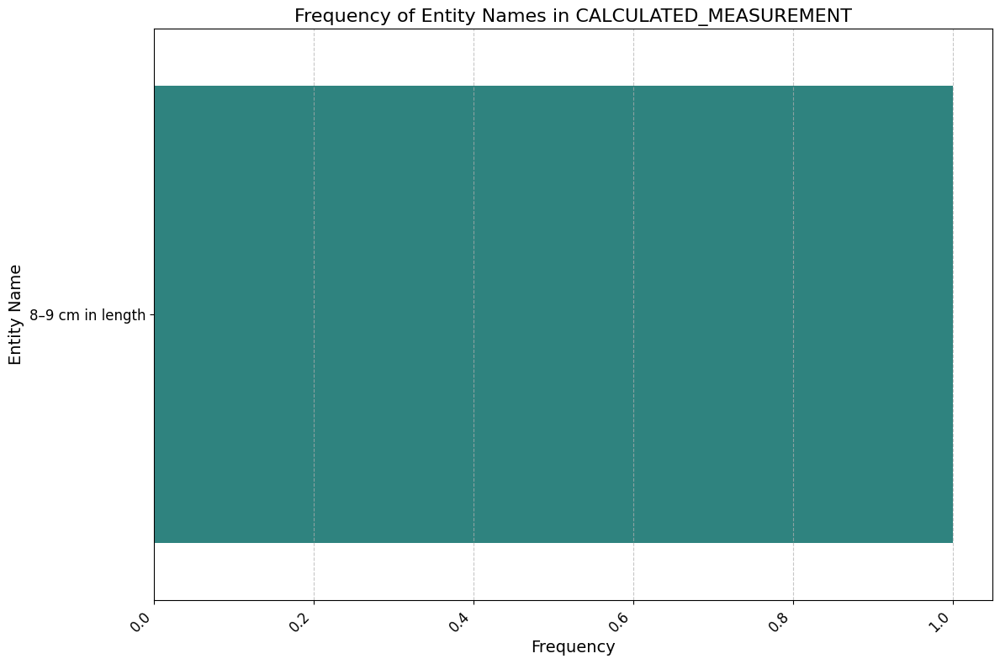

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


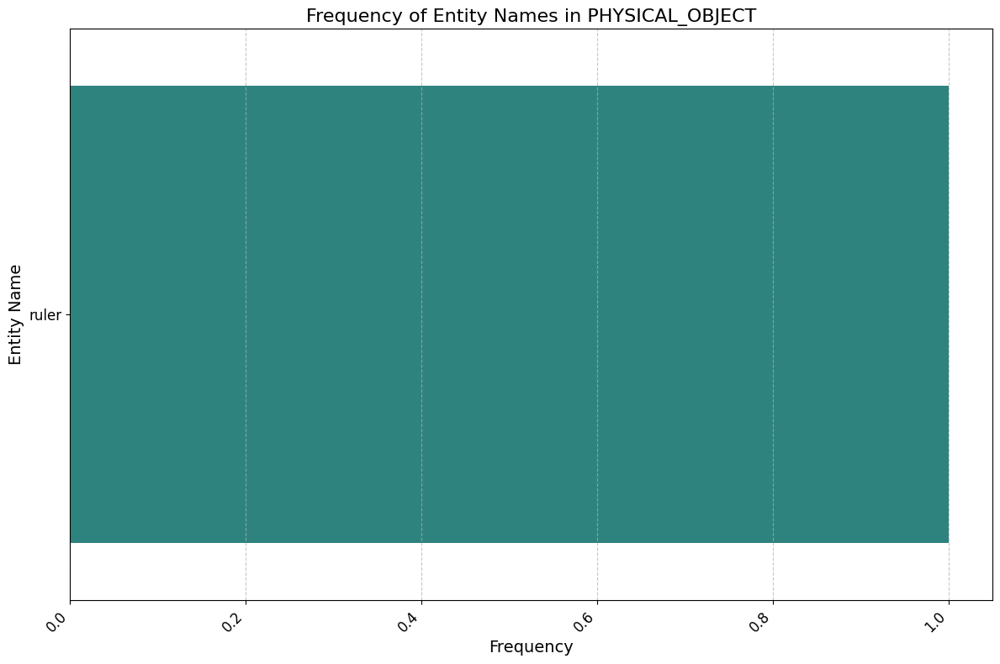

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


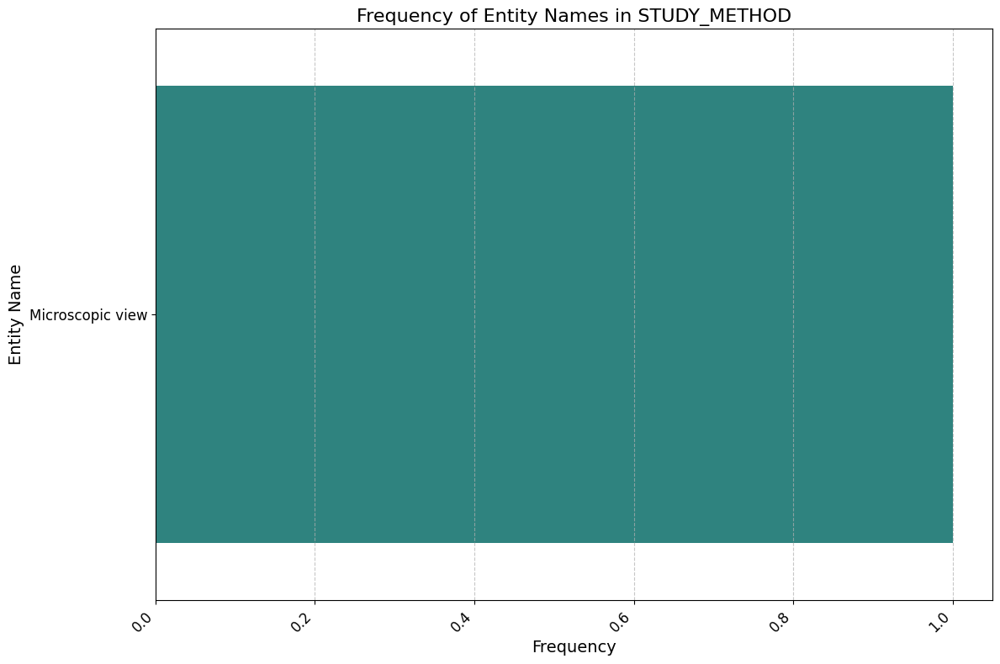

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


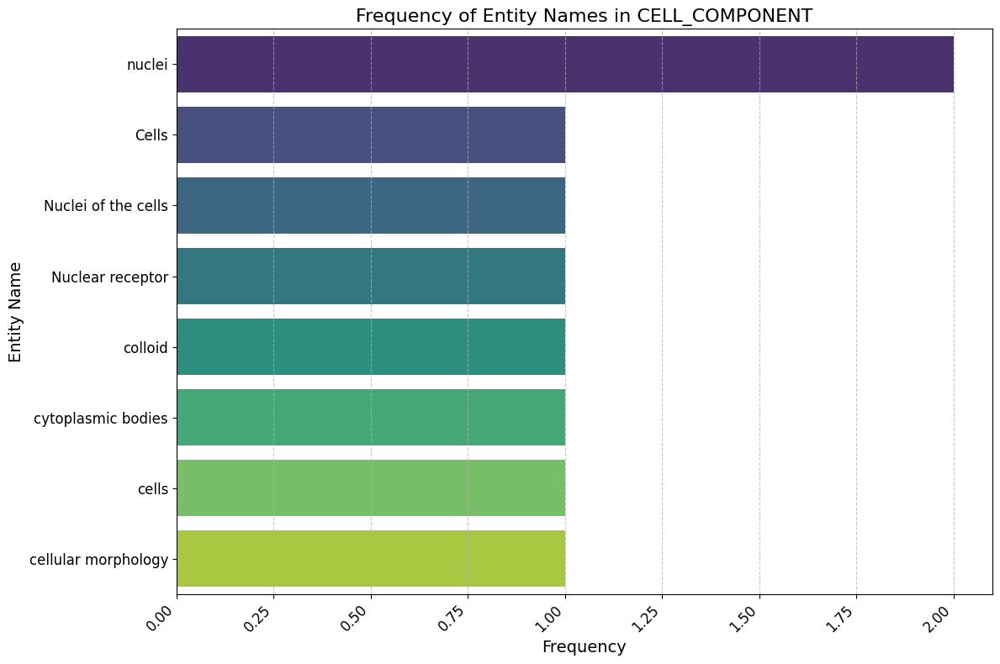

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


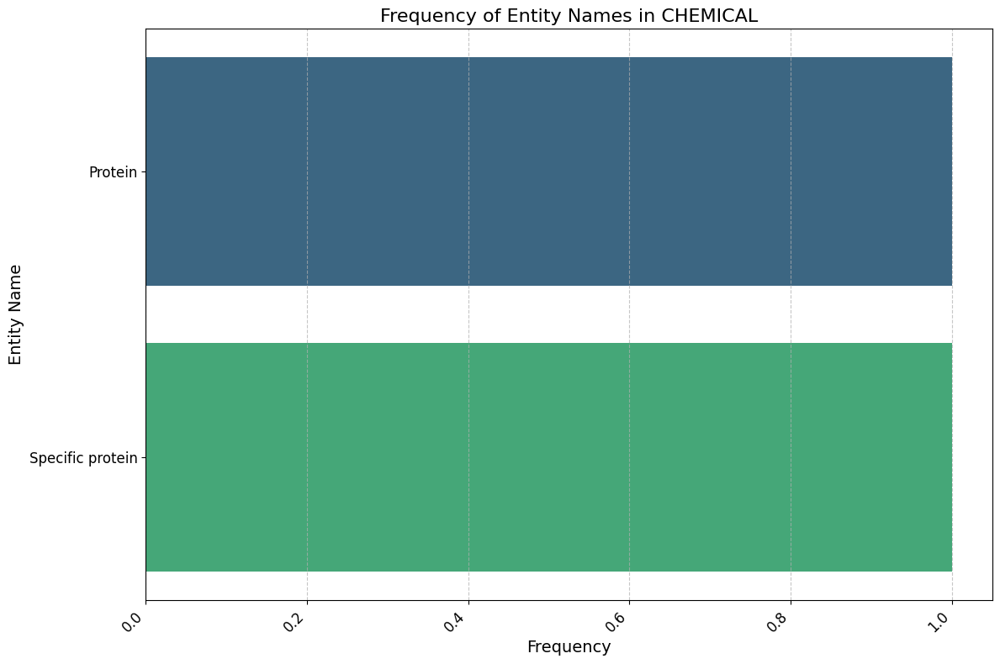

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


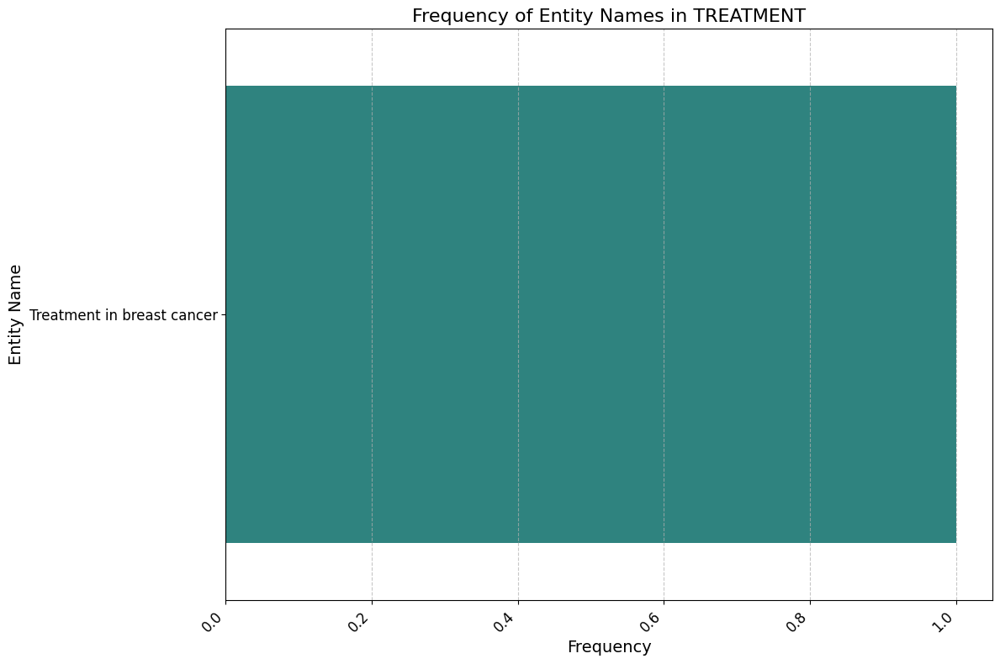

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


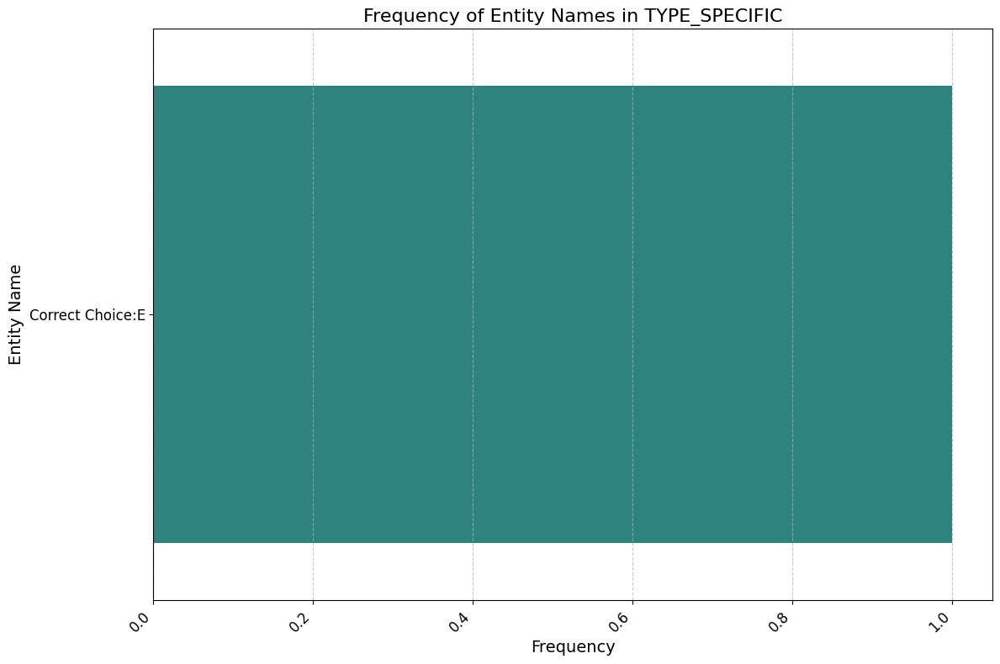

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


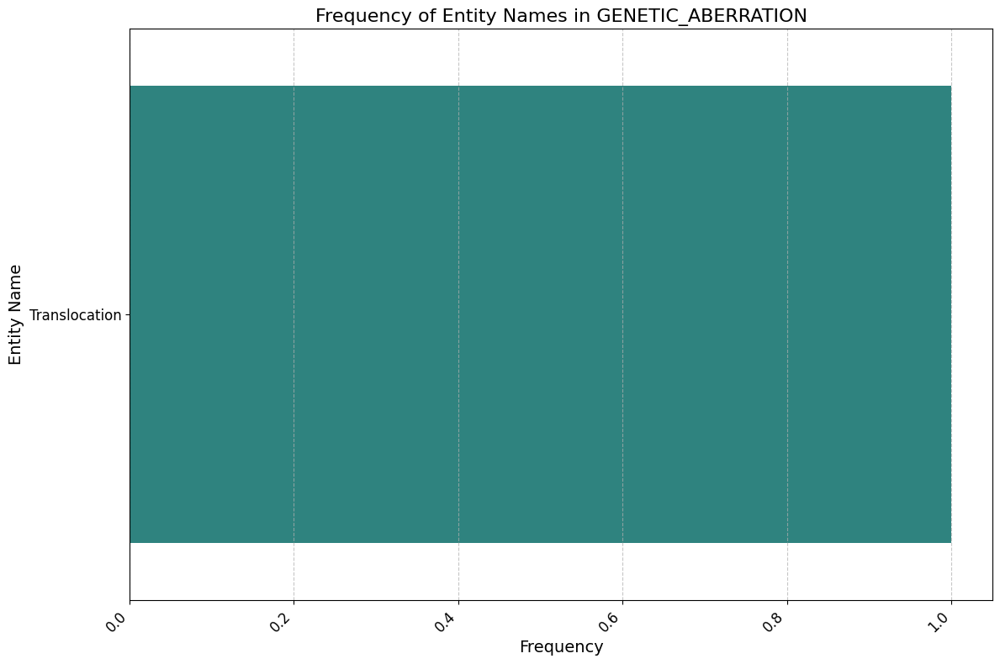

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


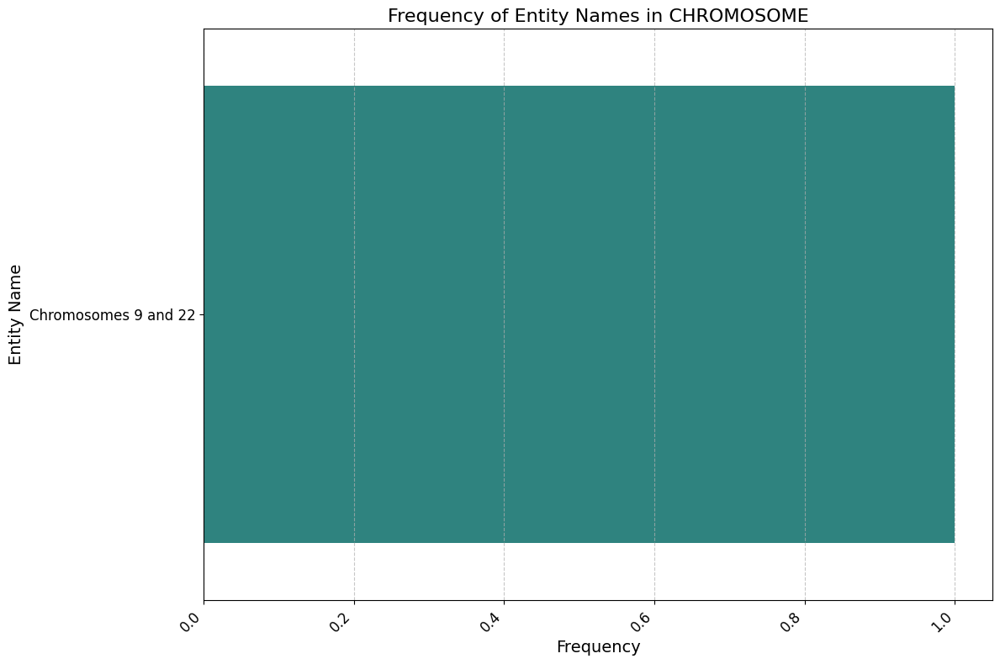

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


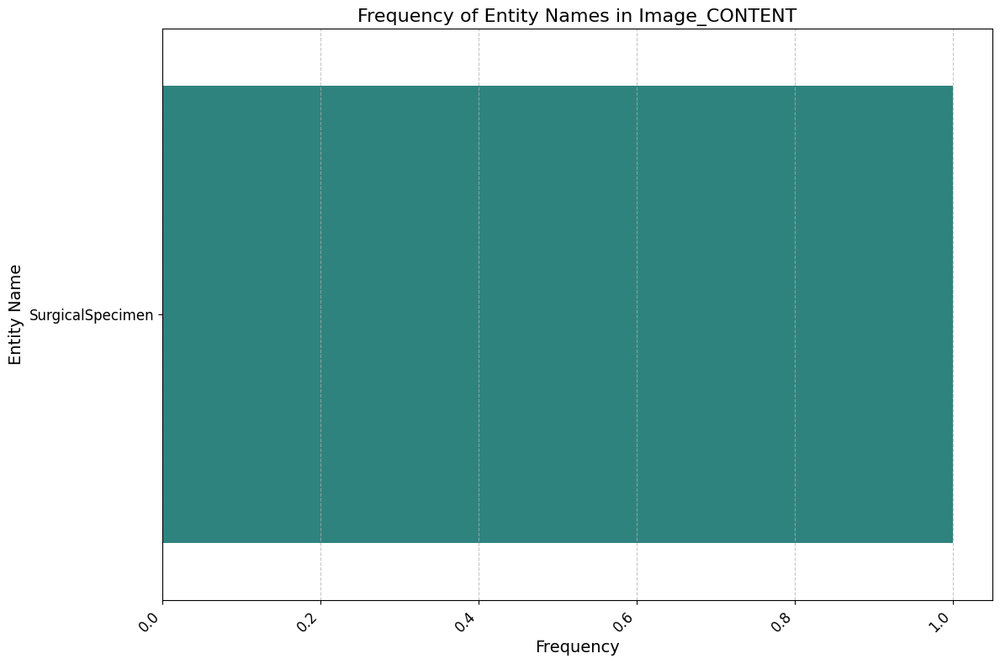

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


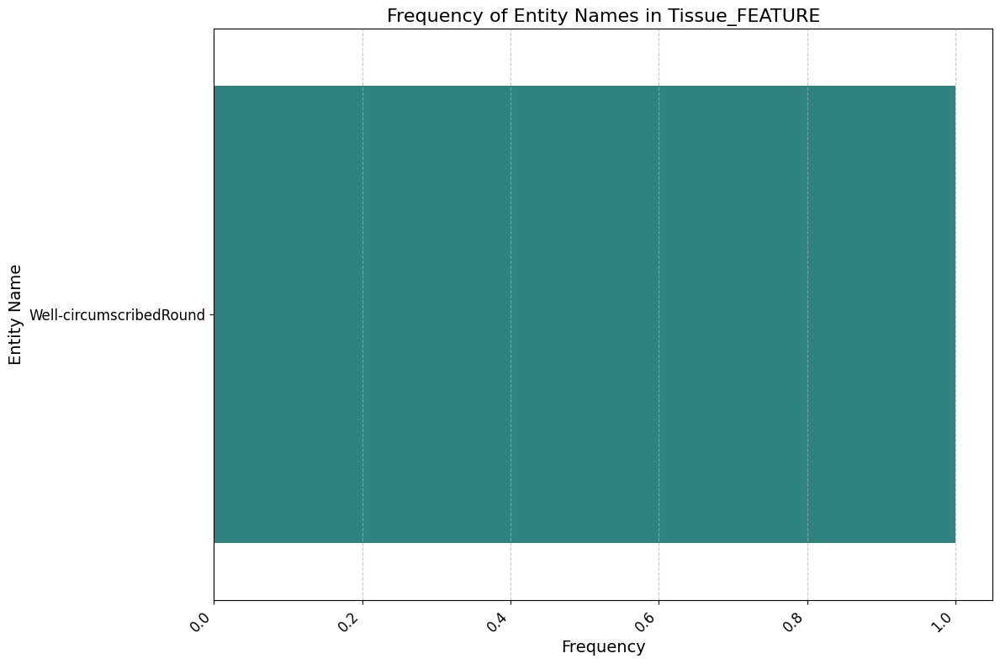

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


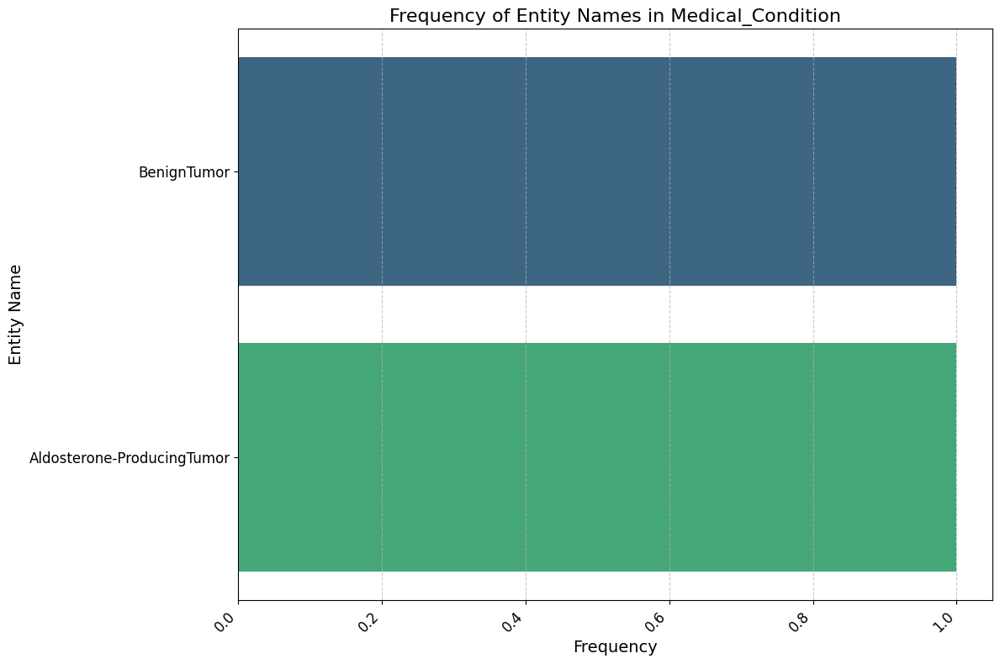

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


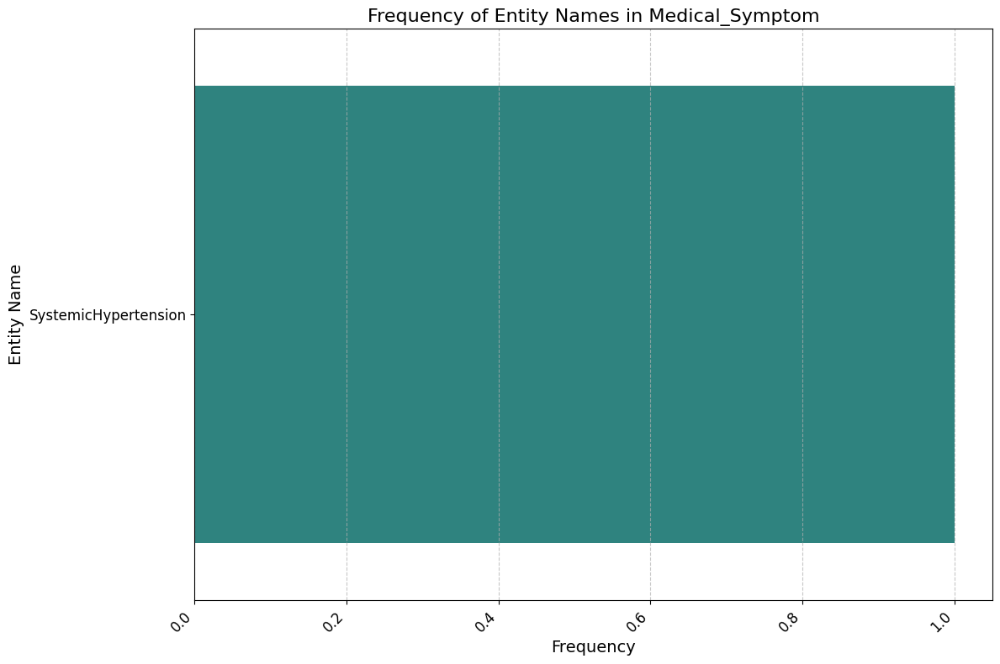

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


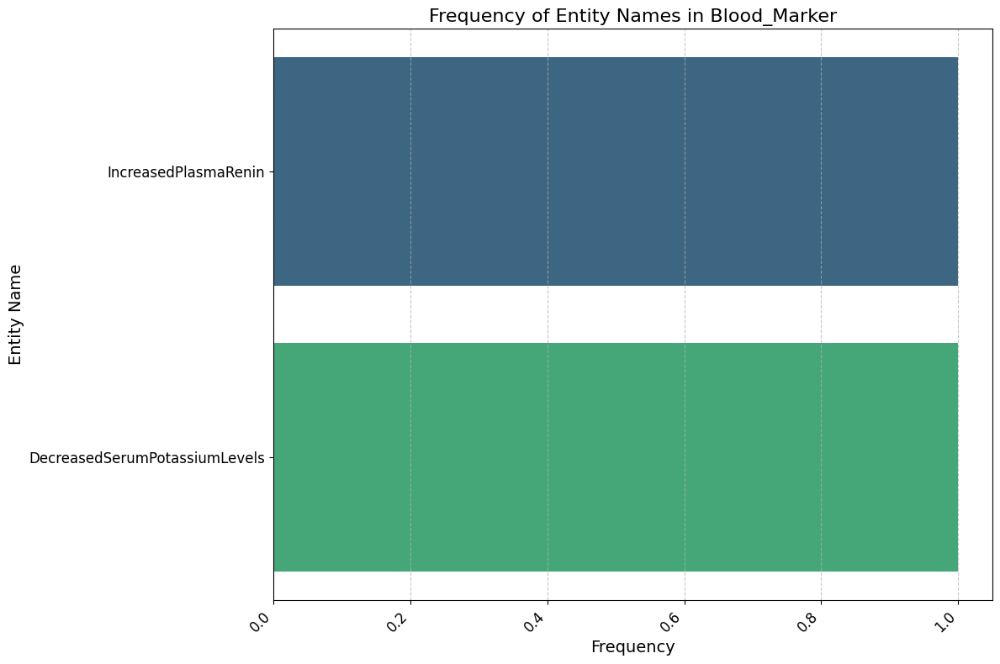

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


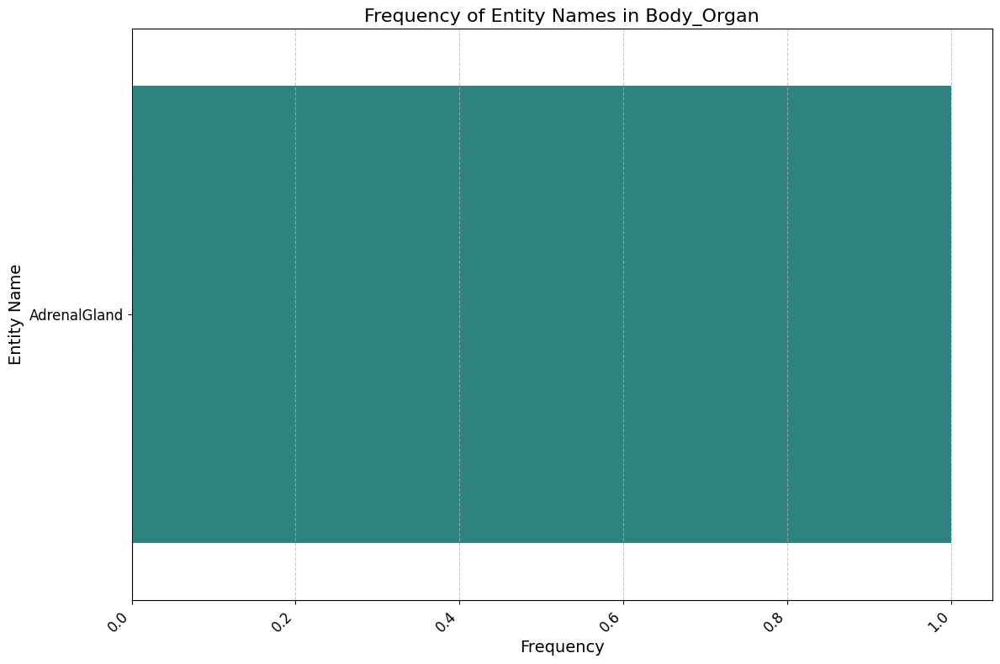

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


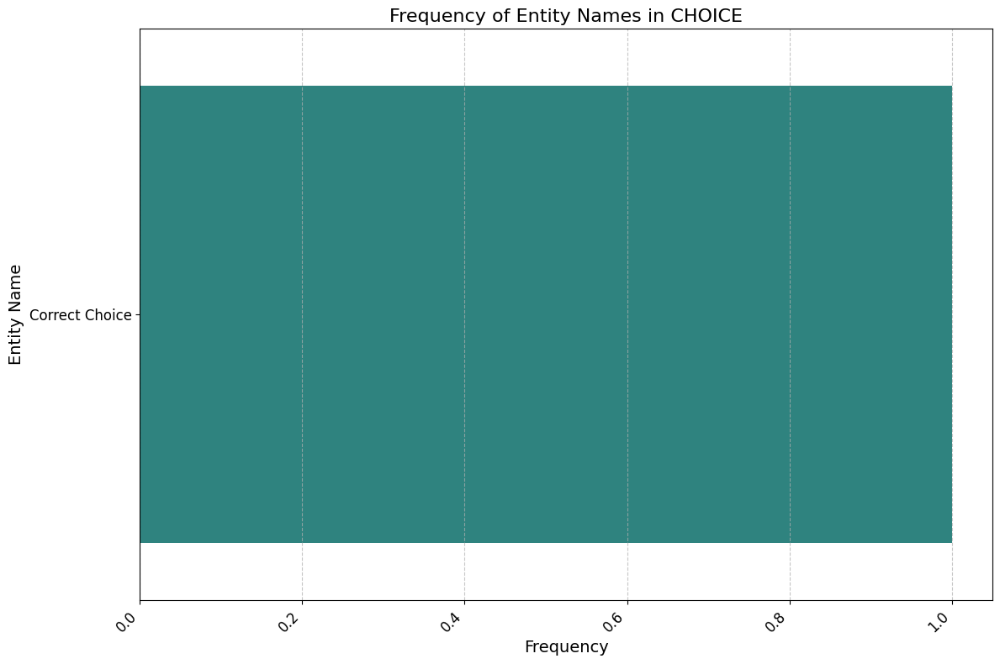

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


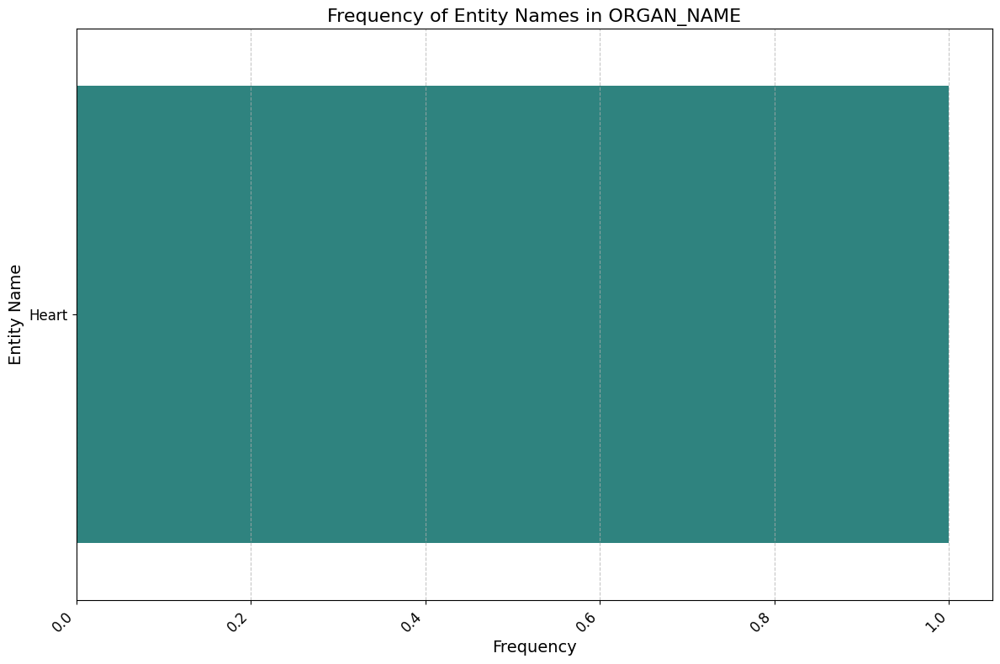

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


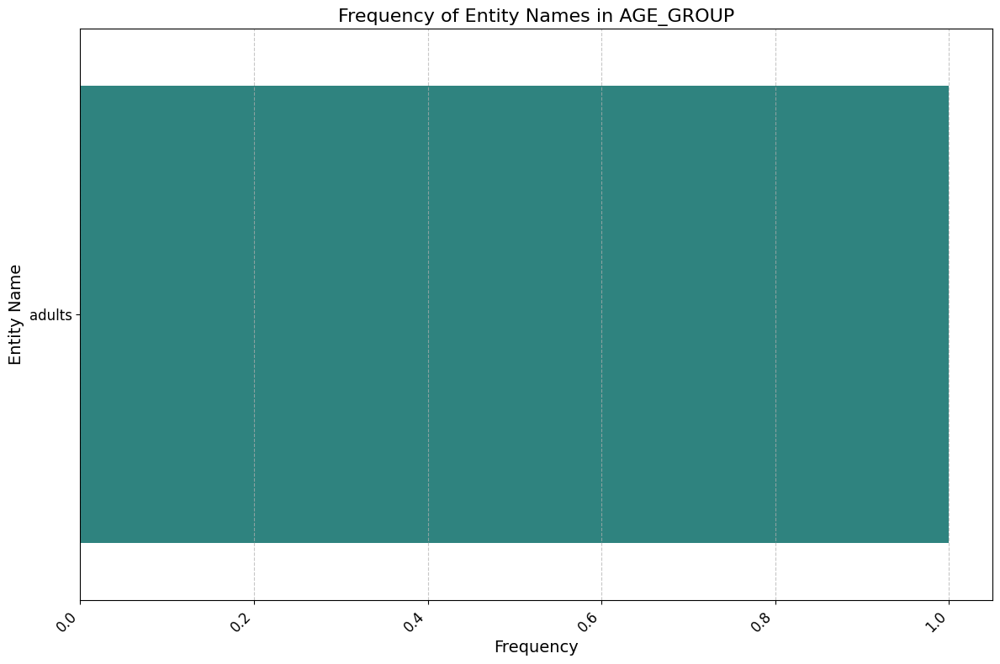

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


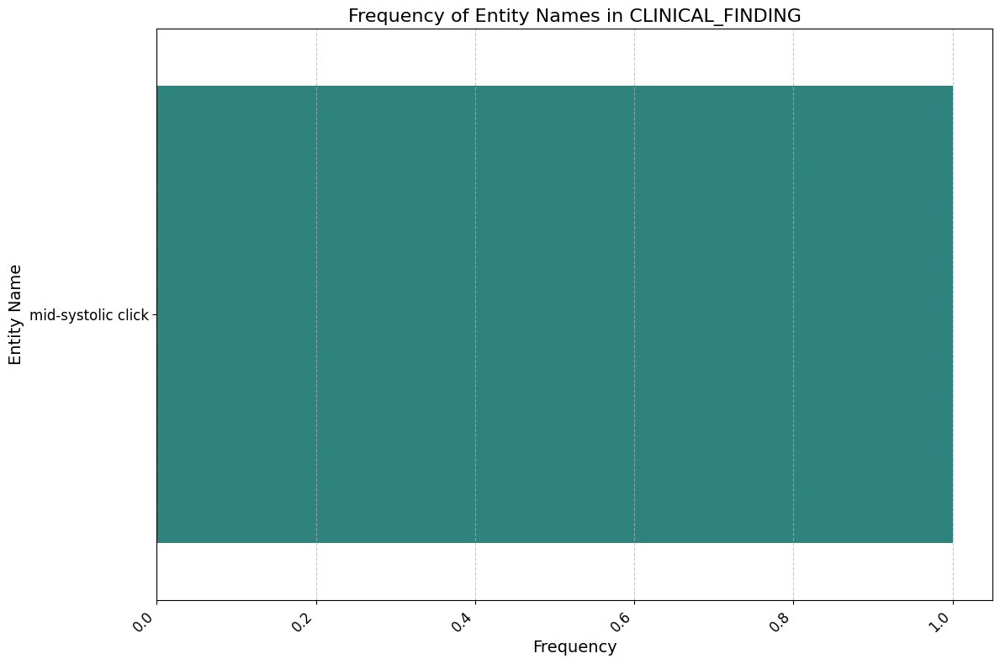

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


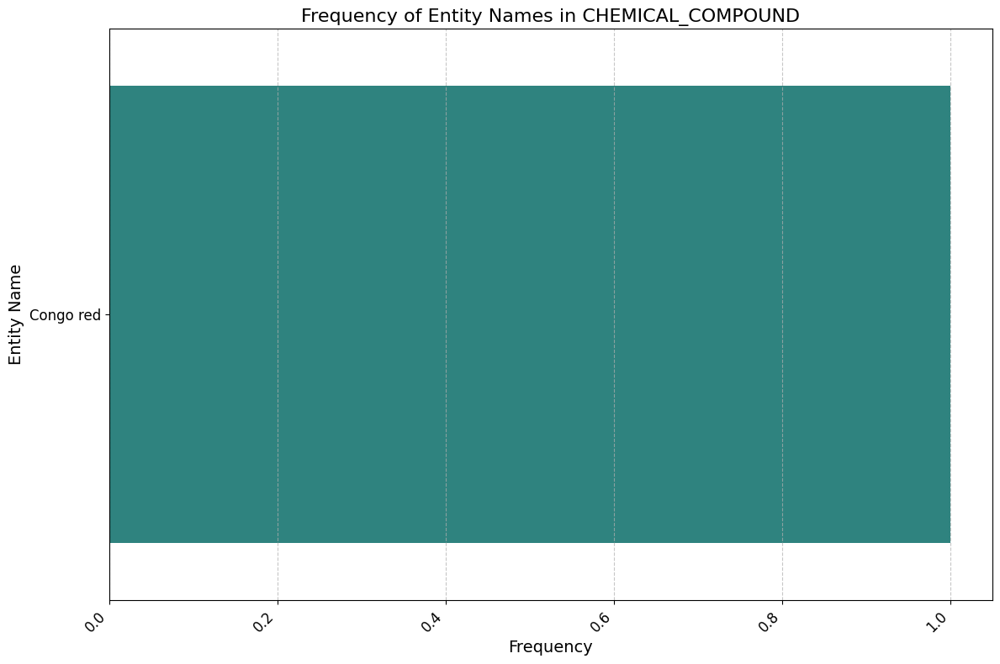

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


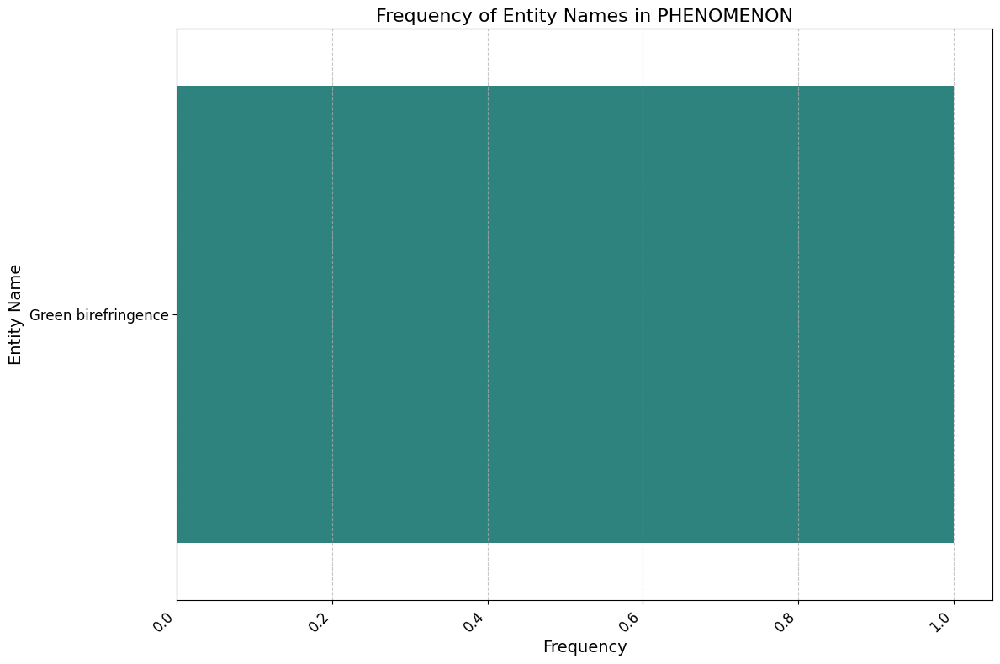

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


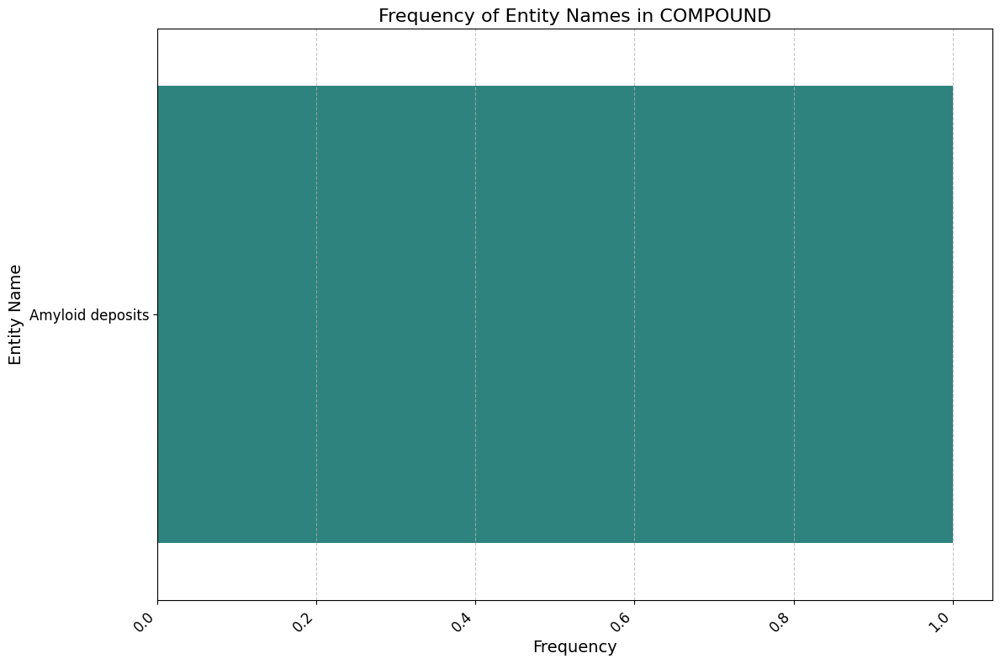

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


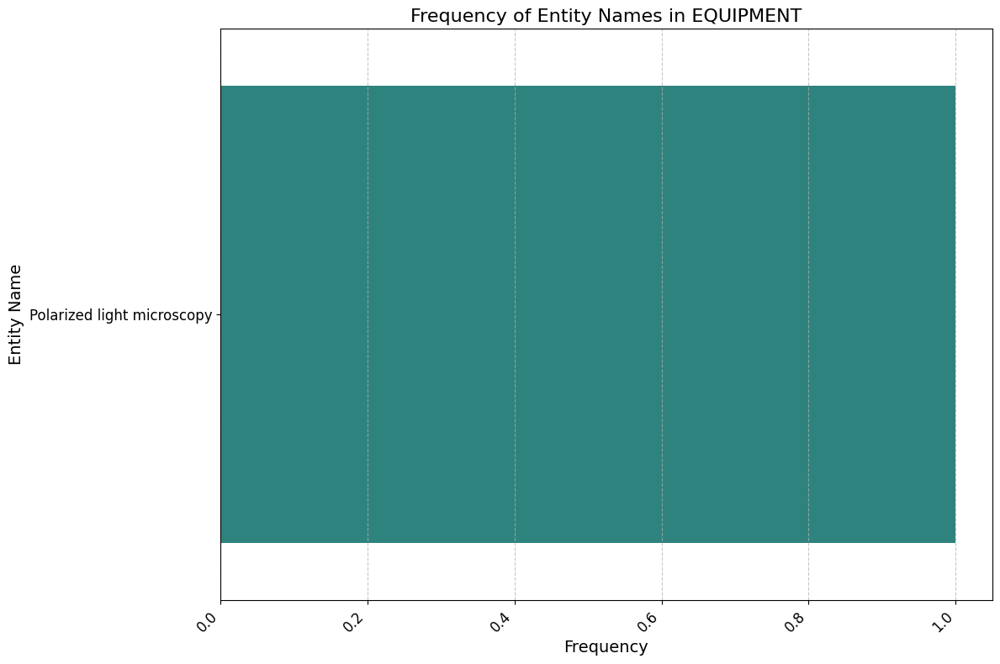

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


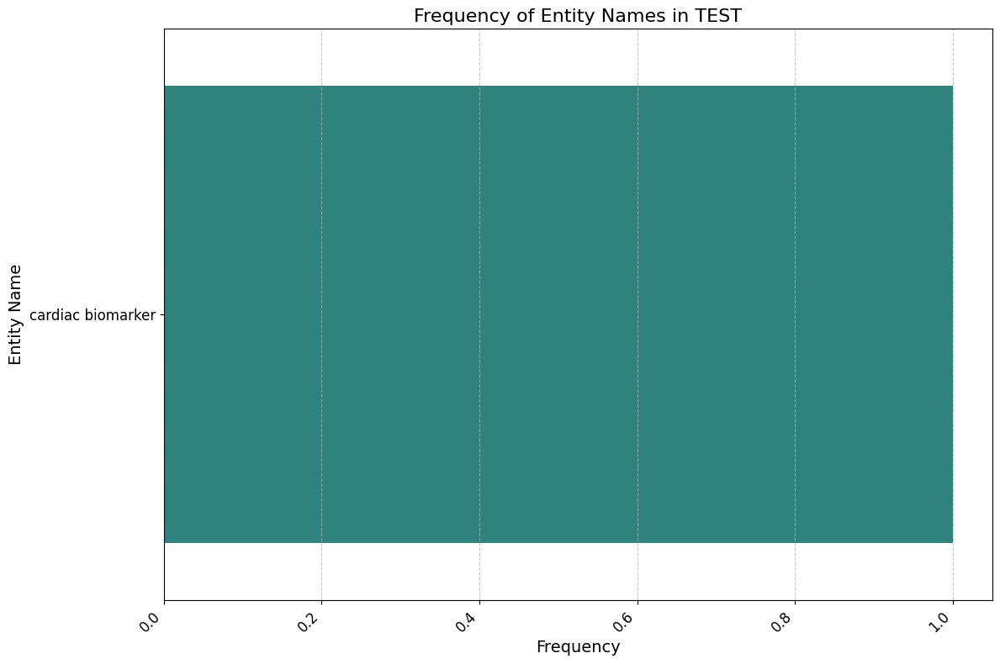

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


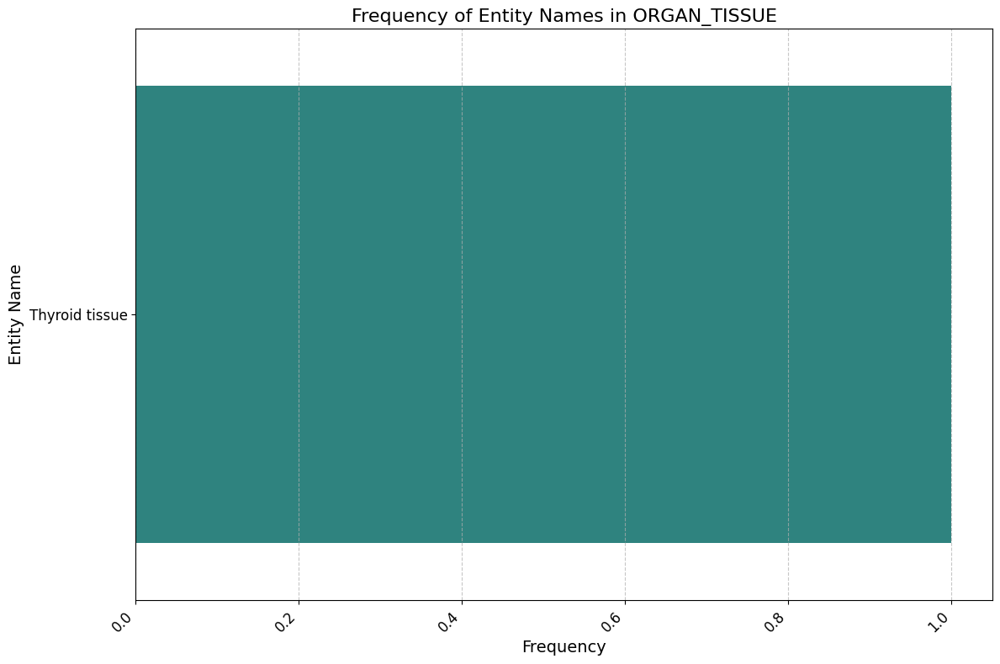

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


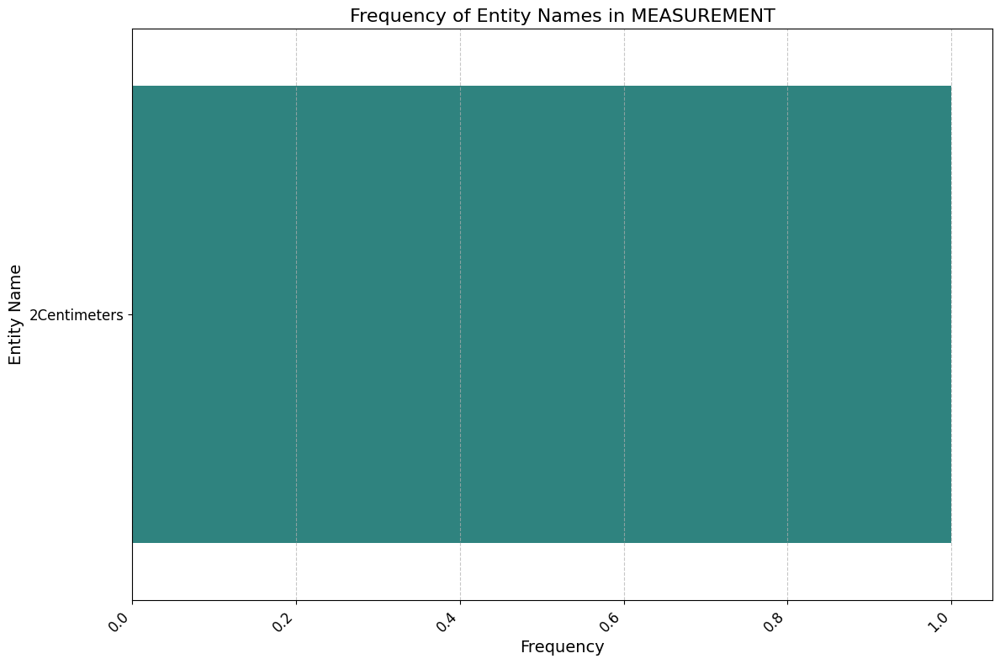

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


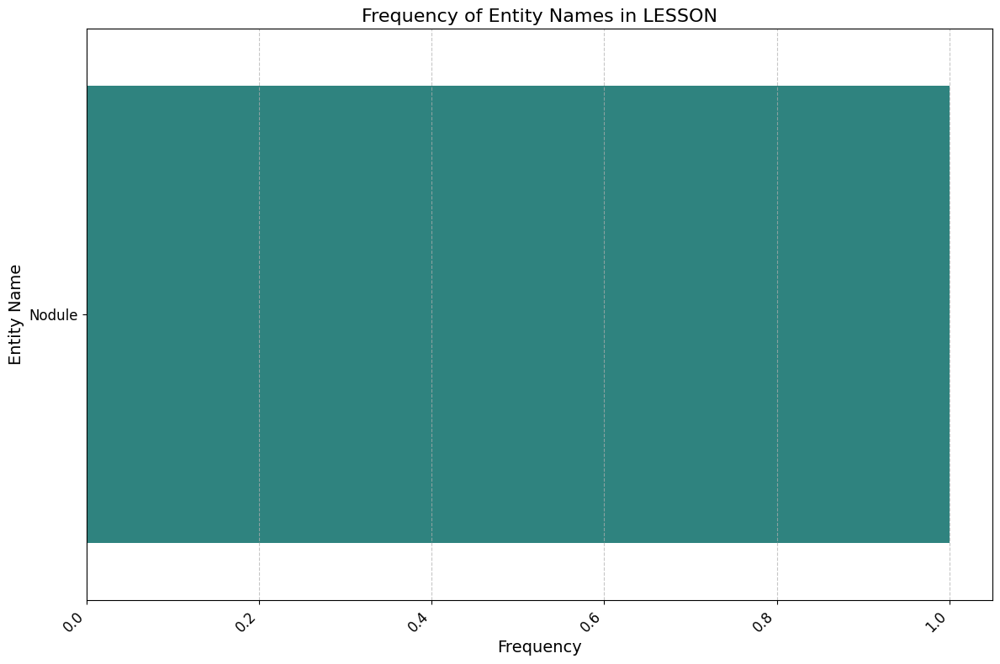

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


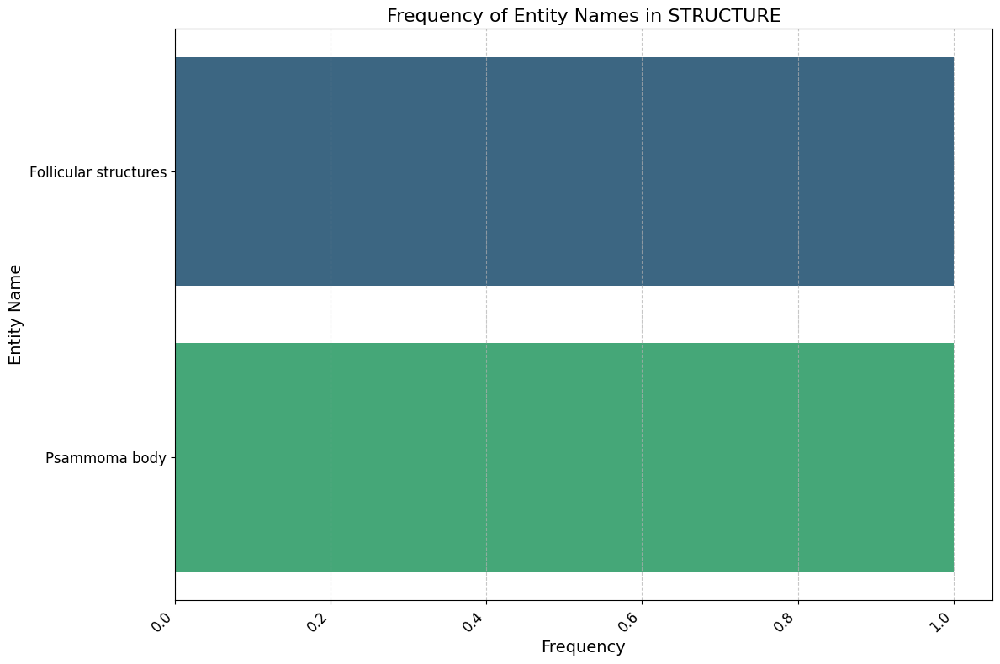

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


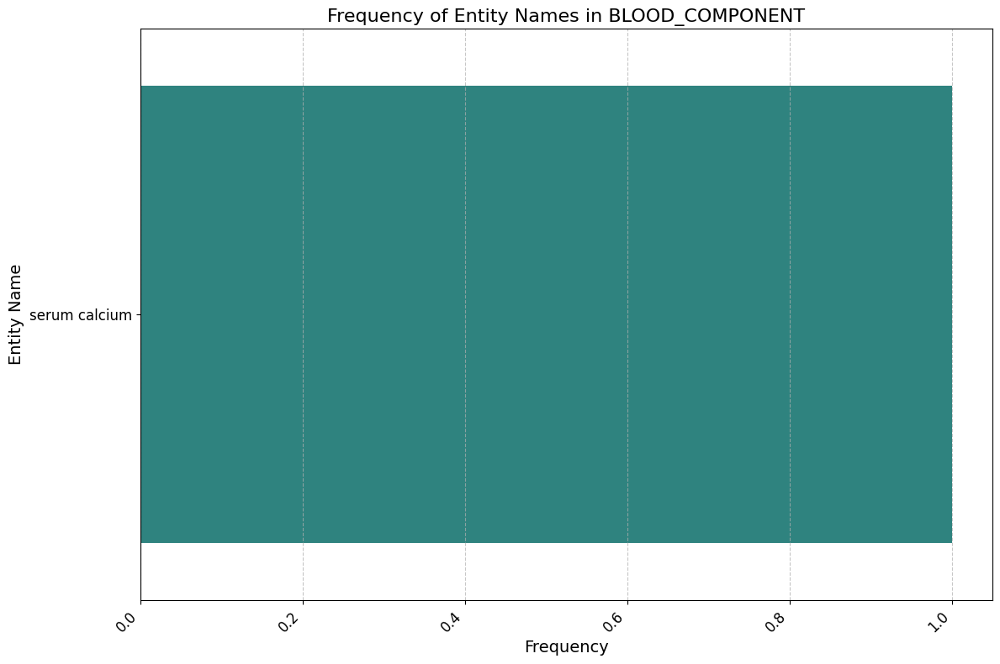

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


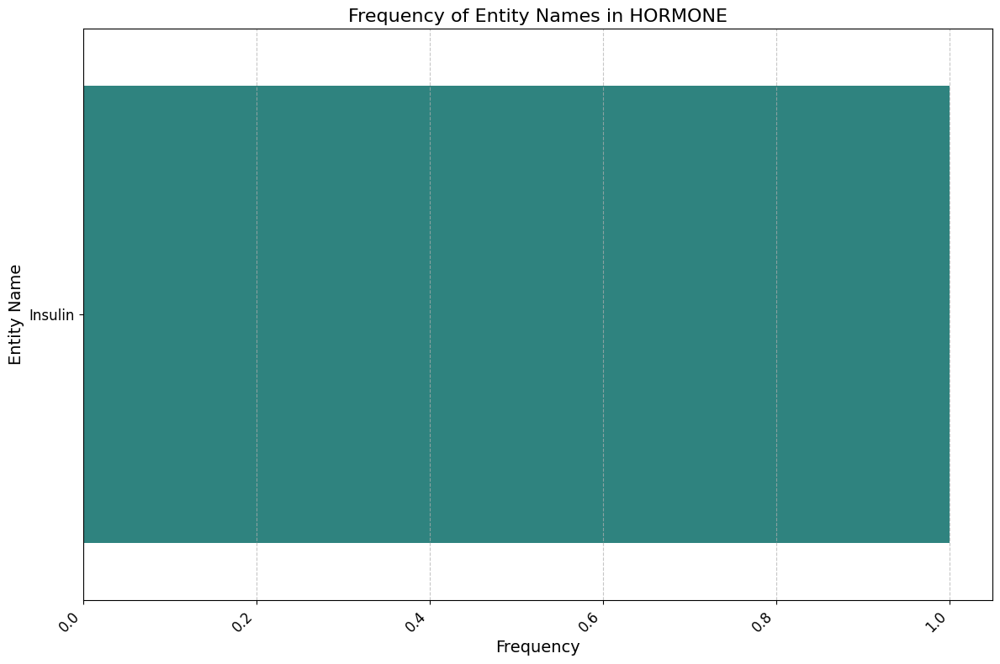

/var/folders/jl/y_4hb2553llg1s2py_vpnp4w0000gn/T/ipykernel_69172/2261395254.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')


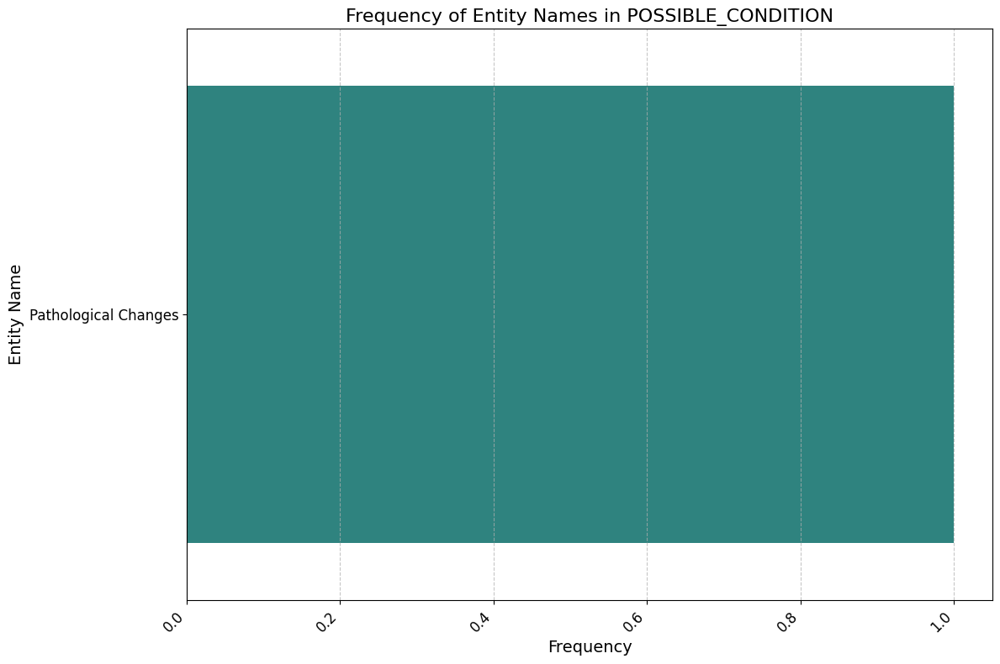

In [227]:

# Frequency Analysis
entity_types = df['ENTITY TYPE'].unique()

# Loop through each entity type and create a plot
for entity_type in entity_types:
    filtered_df = df[df['ENTITY TYPE'] == entity_type]
    entity_name_counts = filtered_df['ENTITY NAME'].value_counts()

    plt.figure(figsize=(12, 8))
    sns.barplot(y=entity_name_counts.index, x=entity_name_counts.values, palette='viridis')
    plt.title(f'Frequency of Entity Names in {entity_type}', fontsize=16)
    plt.xlabel('Frequency', fontsize=14)
    plt.ylabel('Entity Name', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Group-wise comparison for the current entity type
    # group_counts = filtered_df.groupby(['GROUP']).size()
    
    # # Plotting group distribution for the current entity type
    # plt.figure(figsize=(6, 4))  # Adjust the size as needed
    # group_counts.plot(kind='bar')
    # plt.title(f'Group Distribution for {entity_type}')
    # plt.xlabel('Group')
    # plt.ylabel('Count')
    # plt.tight_layout()  # Adjust layout
    # plt.show()


In [218]:
print(df)

Empty DataFrame
Columns: [ENTITY TYPE, ENTITY NAME, GROUP]
Index: []


Color Mapping for Entity Types: {'BODY_PART': 'red', 'CONDITION': 'blue', 'COLOR': 'green', 'DISEASE': 'yellow', 'SYMPTOM': 'purple', 'ORGAN': 'orange', 'ORGAN_PART': 'cyan', 'PATHOLOGICAL_FORMATION': 'magenta', 'FORM': 'lime', 'PATHOLOGICAL_PROCEDURE': 'pink', 'IMAGE_TYPE': 'red', 'TEST_TYPE': 'blue', 'SUBJECT_TYPE': 'green', 'SUBJECT_LOCATION': 'yellow', 'INTERNAL_STRUCTURE': 'purple', 'PROPERTY': 'orange', 'BIOLOGICAL_TISSUE': 'cyan', 'BIOLOGICAL_SUBSTANCE': 'magenta', 'PHYSIOLOGICAL_PROCESS': 'lime', 'PHYSIOLOGICAL_PROCESS_': 'pink', 'ANATOMICAL_STRUCTURE': 'red', 'DISEASE_PROCESS': 'blue', 'PROCEDURE': 'green', 'COMPLICATION': 'yellow', 'OPTION': 'purple', 'PATHOLOGICAL_CONDITION': 'orange', 'CAUSE': 'cyan', 'BIOLOGICAL_STRUCTURE': 'magenta', 'MEDICAL_CONDITION': 'lime', 'MEASUREMENT_UNIT': 'pink', 'SUBSTANCE': 'red', 'CELL_TYPE': 'blue', 'ITEM': 'green', 'CELL_FEATURE': 'yellow', 'CELL_STATE': 'purple', 'BEHAVIORAL_CONCEPT': 'orange', 'TISSUE_TYPE': 'cyan', 'TREATMENT_TYPE': 'mag

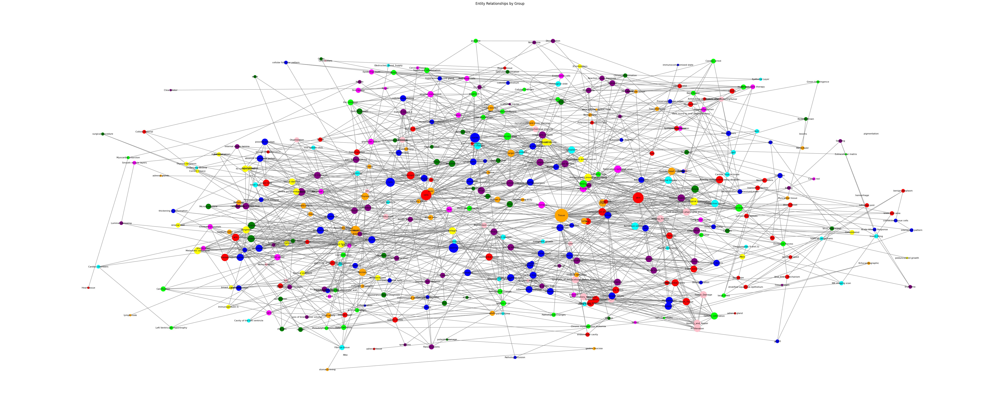

REPORT
Network Density: 0.01675041876046901
Number of Connected Components: 25
Top Nodes by Degree: [('Tissue', 45), ('skin', 29), ('cells', 27), ('nuclei', 23), ('edema', 22)]
Betweenness Centrality: {'arm': 0.0002305244258081496, 'discoloration': 0.00022937372151958982, 'purples': 0.00022822301723103, 'browns': 0.00022812712520698335, 'hyperpigmentation': 0.00022812712520698335, 'ecchymoses': 0.00022812712520698335, 'gangrenous': 0.00022812712520698335, 'desquamated': 0.00022812712520698335, 'gangrene': 0.00022812712520698335, 'pellagra': 0.0001671397979133128, 'congestive heart failure': 0.00010615247061964271, 'edema': 0.03830669644689366, 'Metastatic carcinoma': 1.1411150861551482e-05, 'nodules': 0.03654684766477987, 'masses': 0.00013568721402601157, 'Heart': 0.033933521511841355, 'Chambers': 0.0005641135990616407, 'Inner wall': 0.0002856431612301652, 'Ventricle': 5.3584463037268664e-05, 'Thrombus': 0.04007358370357247, 'Abnormal growth': 5.3584463037268664e-05, 'Mesh-like appeara

In [228]:
import networkx as nx


colors = ["red", "blue", "green", "yellow", "purple", "orange", "cyan", "magenta", "lime", "pink"]

# Create a color map for different entity types
unique_types = df['ENTITY TYPE'].unique()
color_map = {etype: colors[i % len(colors)] for i, etype in enumerate(unique_types)}
df['color'] = df['ENTITY TYPE'].apply(lambda x: color_map[x])

# Print the color mapping
print("Color Mapping for Entity Types:", color_map)

# Initialize a graph
G = nx.Graph()

# Add nodes with color attribute
for index, row in df.iterrows():
    G.add_node(row['ENTITY NAME'], type=row['ENTITY TYPE'], color=row['color'])

# Add edges for intra-group relationships
for group in df['GROUP'].unique():
    group_df = df[df['GROUP'] == group]
    entities = group_df['ENTITY NAME'].tolist()
    for i in range(len(entities)):
        for j in range(i+2, len(entities)):
            G.add_edge(entities[i], entities[j])

# Node size based on degree
node_size = [G.degree[node] * 50 for node in G]

# Draw the graph
plt.figure(figsize=(50, 20))
pos = nx.spring_layout(G, k=0.15, iterations=10)  # Tweak these parameters as needed
nx.draw(G, pos, with_labels=True, node_color=[data['color'] for _, data in G.nodes(data=True)], 
        node_size=node_size, edge_color='gray', font_size=8)
plt.title("Entity Relationships by Group")
# # Creating a color map caption
# caption = "Color Mapping:\n" + "\n".join([f"{etype}: {color}" for etype, color in color_map.items()])
# plt.figtext(0.5, 0.01, caption, wrap=True, horizontalalignment='left', fontsize=12)

plt.show()
# Report

print("REPORT")
density = nx.density(G)
print("Network Density:", density)
connected_components = nx.number_connected_components(G)
print("Number of Connected Components:", connected_components)
degrees = dict(G.degree())
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
print("Top Nodes by Degree:", sorted_degrees[:5])  # Top 5 nodes
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
print("Betweenness Centrality:", betweenness_centrality)
print("Closeness Centrality:", closeness_centrality)
print("Eigenvector Centrality:", eigenvector_centrality)



